# Microkinetic Modelling of SAKE Datasets: Model Selection Work

### Import Packages

In [1]:
import os
import shutil
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

from scipy.integrate import odeint, solve_ivp
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score

pd.set_option('display.float_format', '{:.9f}'.format)

## Saving function

In [2]:
def save_results(results_list, dataset_name_list, model_name, filename):
    """
    Save multiple result DataFrames into a single Excel sheet.

    Parameters:
    - results_list (list of pd.DataFrame): List of DataFrames containing results.
    - dataset_name_list (list): List of dataset names corresponding to results.
    - model_name (str): Name of the model, used as the Excel sheet name.
    - filename (str): Output Excel file name (with .xlsx extension).
    """
    # Combine all DataFrames in 'results_list' into one DataFrame
    results_dataframe = pd.concat(results_list)

    # Add a new column 'Exp' to label rows by dataset name(s)
    results_dataframe['Exp'] = dataset_name_list

    # Define sheet names for Excel (currently only one: the model name)
    sheet_names = [model_name]

    # Store the DataFrame(s) in a list (could support multiple later)
    dfs = [results_dataframe]

    # Create an Excel writer context to save DataFrame(s) to an Excel file
    with pd.ExcelWriter(filename) as writer:
        # Loop through DataFrames and sheet names together
        for df, sheet_name in zip(dfs, sheet_names):
            # Save each DataFrame to its respective sheet
            df.to_excel(writer, sheet_name=sheet_name, index=False)

## Modelling Functions for Different Models

#### Simplified Model with Inhibition (S3)

In [3]:
# -------------------------------------------------------------------
# ODE Model Definition
# -------------------------------------------------------------------
def selected_3parameter_model(y, t, Kk2, Kk3, KI, KI_speed, epsilon=1e-6):
    """
    ODE model describing reaction kinetics with 5 species:
    A, P, B, Phenol, Bd
    
    Parameters:
        y : list
            Current concentrations [A, P, B, Phenol, Bd]
        t : float
            Time (not directly used but required for ODE solvers)
        Kk2, Kk3 : float
            Reaction rate constants
        KI : float
            Some scaling constant
        KI_speed : float
            Transfer rate parameter
        epsilon : float, optional
            Small positive value to prevent division by zero / negatives
    
    Returns:
        dydt : list
            Derivatives [dA/dt, dP/dt, dB/dt, dPhenol/dt, dBd/dt]
    """
    A, P, B, Phenol, Bd = y

    # Enforce positivity (avoid zero/negative concentrations)
    A = max(A, epsilon)
    B = max(B, epsilon)
    Phenol = max(Phenol, epsilon)
    Bd = max(Bd, epsilon)
    
    dA_dt = -Kk2 * A * B - Kk3 * A * B**2
    dP_dt = Kk2 * A * B + Kk3 * A * B**2
    dB_dt = -Kk2 * A * B - Kk3 * A * B**2 + (KI_speed / KI) * Bd - KI_speed * B * Phenol
    dPhenol_dt = Kk2 * A * B + Kk3 * A * B**2 + (KI_speed / KI) * Bd - KI_speed * B * Phenol
    dBd_dt = KI_speed * B * Phenol - (KI_speed / KI) * Bd

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt, dBd_dt]

# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_selected_3parameter_model(t, Kk2, Kk3, KI, KI_speed, initial_conditions):
    """
    Simulate selected_3parameter_model using odeint.
    
    Parameters:
        t : array
            Time points for evaluation
        Kk2, Kk3, KI, KI_speed : float
            Model parameters
        initial_conditions : list
            Initial concentrations [A, P, B, Phenol, Bd]
    
    Returns:
        sol : ndarray
            Solution with shape (len(t), 5)
    """
    sol = odeint(
        selected_3parameter_model, initial_conditions, t, 
        args=(Kk2, Kk3, KI, KI_speed), 
        rtol=1e-10, atol=1e-11
    )
    return sol


# ----------------------------
# Wrapper for Curve Fitting
# ----------------------------
def wrapper_selected_3parameter_model(global_time, Kk2, Kk3, KI, KI_speed, all_times, all_initial_conditions):
    """
    Wrapper for curve fitting. Simulates A and P across multiple datasets,
    interpolates to experimental timepoints, and concatenates results.
    """
    concatenated_results = []

    for time, initial_conditions in zip(all_times, all_initial_conditions):
        t_dense = np.linspace(min(time), max(time), 5000)
        sol = simulate_selected_3parameter_model(t_dense, Kk2, Kk3, KI, KI_speed, initial_conditions)

        # Interpolations
        interp_A = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')
        interp_P = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')

        concatenated_results.extend(interp_A(time))
        concatenated_results.extend(interp_P(time))

    return np.array(concatenated_results)

# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model(
    file, KI_speed=1, plot_B=False, plot_Phenol=False, figsize_final=(7, 5), 
    subplot_figsize=(6, 4), save_svg=False, 
    save_individual_svgs=False, svg_folder="svg_plots",
    individual_plots_legend=True, labels=True, subplots=True,
    legend_position=None,convert_to_SI=False
):
    """
    Fit selected_3parameter_model parameters to experimental data stored in an Excel file.
    """
    # ----------------------------
    # Data Preprocessing
    # ----------------------------
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_times_duplicate = [], [], []
    all_data, number_datapoints = [], []

    for sheet in sheets:
        df = xlsx.parse(sheet)
        time, A, P, B, Phenol = (
            df.iloc[:, 0].values, df.iloc[:, 1].values, df.iloc[:, 2].values,
            df.iloc[:, 3].values, df.iloc[:, 4].values
        )

        # Initial conditions: [A0, P0, B0, Phenol0, Bd0]
        initial_conditions = [A[0], P[0], B[0], Phenol[0], 0]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)   # duplicated to align A & P
        all_initial_conditions.append(initial_conditions)

        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    print("Number of datapoints per SAKE period:", number_datapoints)

    # ----------------------------
    # Weights for Curve Fitting
    # ----------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5
    weights = []
    for i, j in zip(weights_per_sheet, number_datapoints):
        weights += [i] * j
        weights += [i] * j   # duplicated (A & P both weighted)

    # Steepness-based weighting
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))

        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))

        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale weights
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = weights_steepness + weights_scaled

    # ----------------------------
    # Curve Fitting
    # ----------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])
        combined_exp_AP.extend(data[:, 1])

    initial_guess = [0.0001, 0.0002, 0.001]
    bounds = ([1e-11, 1e-11, 0.000001], [50, 50, 0.5])

    best_params, _ = curve_fit(
        lambda t, Kk2, Kk3, KI: wrapper_selected_3parameter_model(
            t, Kk2, Kk3, KI, KI_speed, all_times, all_initial_conditions
        ),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False
    )

    # ----------------------------
    # Plotting & Metrics
    # ----------------------------
    plt.figure(figsize=(6, 3 * len(all_times)))
    times, combined_exp_A, combined_sim_A = [], [], []
    combined_exp_P, combined_sim_P = [], []
    if plot_B:
        combined_sim_B, combined_sim_Bd = [], []
    if plot_Phenol:
        combined_sim_Phenol = []

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_selected_3parameter_model(t_dense, *best_params, KI_speed, initial_conditions)

        # Interpolate for A, P
        interp_A = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')
        interp_P = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')
        A_interp, P_interp = interp_A(time), interp_P(time)

        # Store for metrics
        combined_exp_A.extend(data[:, 0])
        combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1])
        combined_sim_P.extend(P_interp)
        times.extend(time)

        if plot_B:
            interp_B = interp1d(t_dense, sol[:, 2], kind='linear', fill_value='extrapolate')
            interp_Bd = interp1d(t_dense, sol[:, 4], kind='linear', fill_value='extrapolate')
            combined_sim_B.extend(interp_B(time))
            combined_sim_Bd.extend(interp_Bd(time))
        if plot_Phenol:
            interp_Phenol = interp1d(t_dense, sol[:, 3], kind='linear', fill_value='extrapolate')
            combined_sim_Phenol.extend(interp_Phenol(time))

        # ----------------------------
        # Individual subplot
        # ----------------------------
        ax1 = plt.subplot(len(all_times), 1, i + 1)
        ax1.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
        ax1.plot(t_dense, sol[:, 0], '-', label='A (fit)')
        ax1.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
        ax1.plot(t_dense, sol[:, 1], '-', label='P (fit)')

        ax1.set_title(f"Fit for {sheets[i]}")
        ax1.set_xlabel("Time / min")
        ax1.set_ylabel("Concentration / mM")

        if plot_B or plot_Phenol:
            ax2 = ax1.twinx()
            if plot_B:
                ax2.plot(t_dense, sol[:, 2], '-', label='B (fit)', color='tab:green')
                ax2.plot(t_dense, sol[:, 4], '-', label='Bd (fit)', color='tab:olive')
            if plot_Phenol:
                ax2.plot(t_dense, sol[:, 3], '-', label='Phenol (fit)', color='tab:red')
            ax2.set_ylabel("Conc. B/Bd/Phenol (mM)")

            lines, labels_lines = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax1.legend(lines + lines2, labels_lines + labels2, loc="best")
    ax1.legend(loc="best")
    plt.tight_layout()
    plt.show()

    # ----------------------------
    # Global combined plot
    # ----------------------------
    global_times, cumulative_time = [], 0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)

    fig, ax1 = plt.subplots(figsize=figsize_final)
    ax1.plot(global_times, combined_exp_A, 'o', markersize=1.2, label='Data A')
    ax1.plot(global_times, combined_sim_A, '-', label='Model A')
    ax1.plot(global_times, combined_exp_P, 'o', markersize=1.2, label='Data P')
    ax1.plot(global_times, combined_sim_P, '-', label='Model P')
    ax1.set_xlabel('Time / min')
    ax1.set_ylabel('Concentration / mM')
    ax1.legend(loc="best")
    ax1.set_ylim(0, None)   
    if plot_B or plot_Phenol:
        ax2 = ax1.twinx()
        if plot_B:
            ax2.plot(global_times, combined_sim_B, '-', label='Model B', color='tab:green')
            ax2.plot(global_times, combined_sim_Bd, '-', label='Model Bd', color='tab:olive')
        if plot_Phenol:
            ax2.plot(global_times, combined_sim_Phenol, '-', label='Model Phenol', color='tab:red')
        ax2.set_ylabel("B, Bd, Phenol (mM)")

        lines, labels_lines = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax1.legend(lines + lines2, labels_lines + labels2, loc="best")
    
    plt.xlim(0, None)
    plt.show()

    # ----------------------------
    # Statistics & Output
    # ----------------------------
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A))**2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P))**2))
    
    if convert_to_SI:
        best_params[0]=best_params[0]*16.66666
        best_params[1]=best_params[1]*16.66666*1000
    results = {
        "Kk2": [best_params[0]], 
        "Kk3": [best_params[1]],
        "KI": [best_params[2]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
         "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    }

    results_df = pd.DataFrame(results)
    
    return results_df


#### Simplified Model wit Inhibition (S3) with Extra Plotting Functionality

In [4]:
# ----------------------------------------------------------
# Fit model to experimental data from Excel (with extra plotting options)
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model_extra_plotting_options(
    file, KI_speed=1, plot_B=False, plot_Phenol=False, figsize_final=(7, 5), 
    subplot_figsize=(6, 4), save_svg=False, 
    save_individual_svgs=False, svg_folder="svg_plots",
    individual_plots_legend=True, labels=True, subplots=True,
    legend_anchor_final=1.15, legend_anchor_subplot=1.15, convert_to_SI=False,
    sim_colors=None, sim_linewidth=1.8,  
    export_data=False, export_filename="fit_results.xlsx"  # NEW
):
    """
    Fit selected_3parameter_model parameters to experimental data stored in an Excel file.
    Legends are placed outside on the right via bbox_to_anchor=(legend_anchor, 1.0).
    sim_colors: dict or list for simulated lines (A, P, B, Bd, Phenol).
    sim_linewidth: float linewidth for simulated lines.
    export_data: if True, save all plotted data (exp + sim) into an xlsx file with sheets.
    """
    # ----------------------------
    # Helper for legend placement
    # ----------------------------
    def _place_legend(ax, legend_anchor, handles=None, labels=None):
        if handles is None or labels is None:
            handles, labels = ax.get_legend_handles_labels()
        return ax.legend(handles, labels, loc="upper left",
                         bbox_to_anchor=(legend_anchor, 1.0), borderaxespad=0.0)

    # ----------------------------
    # Simulation styling defaults
    # ----------------------------
    _default_colors = {
        "A": "tab:blue",
        "P": "tab:orange",
        "B": "tab:green",
        "Bd": "tab:olive",
        "Phenol": "tab:red",
    }
    if sim_colors is None:
        sim_colors = _default_colors.copy()
    elif isinstance(sim_colors, (list, tuple)):
        keys = ["A", "P", "B", "Bd", "Phenol"]
        sim_colors = {k: (sim_colors[i] if i < len(sim_colors) else _default_colors[k])
                      for i, k in enumerate(keys)}
    else:
        merged = _default_colors.copy()
        merged.update(sim_colors)
        sim_colors = merged

    # Reserve horizontal space for outside legends
    right_margin_1 = max(0.5, 1.0 - (legend_anchor_subplot - 1.0) - 0.07)
    right_margin_2 = max(0.5, 1.0 - (legend_anchor_final - 1.0) - 0.07)

    # ----------------------------
    # Data Preprocessing
    # ----------------------------
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_times_duplicate = [], [], []
    all_data, number_datapoints = [], []

    for sheet in sheets:
        df = xlsx.parse(sheet)
        time, A, P, B, Phenol = (
            df.iloc[:, 0].values, df.iloc[:, 1].values, df.iloc[:, 2].values,
            df.iloc[:, 3].values, df.iloc[:, 4].values
        )

        # Initial conditions: [A0, P0, B0, Phenol0, Bd0]
        initial_conditions = [A[0], P[0], B[0], Phenol[0], 0]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)   # duplicated to align A & P
        all_initial_conditions.append(initial_conditions)

        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    print("Number of datapoints per SAKE period:", number_datapoints)

    # ----------------------------
    # Weights for Curve Fitting
    # ----------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5
    weights = []
    for i, j in zip(weights_per_sheet, number_datapoints):
        weights += [i] * j
        weights += [i] * j   # duplicated (A & P both weighted)

    # Steepness-based weighting
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))

        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))

        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale weights
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = weights_steepness + weights_scaled

    # ----------------------------
    # Curve Fitting
    # ----------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])
        combined_exp_AP.extend(data[:, 1])

    initial_guess = [0.0001, 0.0002, 0.001]
    bounds = ([1e-11, 1e-11, 0.000001], [50, 50, 0.5])

    best_params, _ = curve_fit(
        lambda t, Kk2, Kk3, KI: wrapper_selected_3parameter_model(
            t, Kk2, Kk3, KI, KI_speed, all_times, all_initial_conditions
        ),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False
    )

    # ----------------------------
    # Plotting & Data collection
    # ----------------------------
    n_subplots = len(all_times)
    fig_width, fig_height = subplot_figsize
    fig1 = plt.figure(figsize=(fig_width, fig_height * n_subplots))
    fig1.subplots_adjust(right=right_margin_1)

    times, combined_exp_A, combined_sim_A = [], [], []
    combined_exp_P, combined_sim_P = [], []
    if plot_B:
        combined_sim_B, combined_sim_Bd = [], []
    if plot_Phenol:
        combined_sim_Phenol = []

    # For exporting: dictionary of DataFrames
    export_dfs = {}

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_selected_3parameter_model(t_dense, *best_params, KI_speed, initial_conditions)

        # Interpolate for A, P
        interp_A = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')
        interp_P = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')
        A_interp, P_interp = interp_A(time), interp_P(time)

        # Store for metrics
        combined_exp_A.extend(data[:, 0])
        combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1])
        combined_sim_P.extend(P_interp)
        times.extend(time)

        if plot_B:
            interp_B = interp1d(t_dense, sol[:, 2], kind='linear', fill_value='extrapolate')
            interp_Bd = interp1d(t_dense, sol[:, 4], kind='linear', fill_value='extrapolate')
            B_interp, Bd_interp = interp_B(time), interp_Bd(time)
            combined_sim_B.extend(B_interp)
            combined_sim_Bd.extend(Bd_interp)
        else:
            B_interp, Bd_interp = None, None

        if plot_Phenol:
            interp_Phenol = interp1d(t_dense, sol[:, 3], kind='linear', fill_value='extrapolate')
            Phenol_interp = interp_Phenol(time)
            combined_sim_Phenol.extend(Phenol_interp)
        else:
            Phenol_interp = None

        # Collect export DataFrame for this sheet
        df_export = pd.DataFrame({
            "Time": time,
            "Exp_A": data[:, 0],
            "Sim_A": A_interp,
            "Exp_P": data[:, 1],
            "Sim_P": P_interp,
        })
        if plot_B:
            df_export["Sim_B"] = B_interp
            df_export["Sim_Bd"] = Bd_interp
        if plot_Phenol:
            df_export["Sim_Phenol"] = Phenol_interp
        export_dfs[f"Sheet_{sheets[i]}"] = df_export

        # Plotting
        ax1 = plt.subplot(len(all_times), 1, i + 1)
        ax1.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
        ax1.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
        ax1.plot(t_dense, sol[:, 0], '-', label='A (fit)', color=sim_colors["A"], linewidth=sim_linewidth)
        ax1.plot(t_dense, sol[:, 1], '-', label='P (fit)', color=sim_colors["P"], linewidth=sim_linewidth)

        if plot_B or plot_Phenol:
            ax2 = ax1.twinx()
            if plot_B:
                ax2.plot(t_dense, sol[:, 2], '-', label='B (fit)', color=sim_colors["B"], linewidth=sim_linewidth)
                ax2.plot(t_dense, sol[:, 4], '-', label='Bd (fit)', color=sim_colors["Bd"], linewidth=sim_linewidth)
            if plot_Phenol:
                ax2.plot(t_dense, sol[:, 3], '-', label='Phenol (fit)', color=sim_colors["Phenol"], linewidth=sim_linewidth)
            lines1, labels1 = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            _place_legend(ax1, legend_anchor_subplot, lines1 + lines2, labels1 + labels2)
        else:
            _place_legend(ax1, legend_anchor_subplot)

    plt.tight_layout(rect=(0.0, 0.0, right_margin_1, 1.0))
    plt.show()

    # ----------------------------
    # Global combined plot
    # ----------------------------
    global_times, cumulative_time = [], 0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)

    fig2, ax1 = plt.subplots(figsize=figsize_final)
    fig2.subplots_adjust(right=right_margin_2)

    ax1.plot(global_times, combined_exp_A, 'o', markersize=1.2, label='Data A')
    ax1.plot(global_times, combined_exp_P, 'o', markersize=1.2, label='Data P')
    ax1.plot(global_times, combined_sim_A, '-', label='Model A', color=sim_colors["A"], linewidth=sim_linewidth)
    ax1.plot(global_times, combined_sim_P, '-', label='Model P', color=sim_colors["P"], linewidth=sim_linewidth)

    if plot_B or plot_Phenol:
        ax2 = ax1.twinx()
        if plot_B:
            ax2.plot(global_times, combined_sim_B, '-', label='Model B', color=sim_colors["B"], linewidth=sim_linewidth)
            ax2.plot(global_times, combined_sim_Bd, '-', label='Model Bd', color=sim_colors["Bd"], linewidth=sim_linewidth)
        if plot_Phenol:
            ax2.plot(global_times, combined_sim_Phenol, '-', label='Model Phenol', color=sim_colors["Phenol"], linewidth=sim_linewidth)
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        _place_legend(ax1, legend_anchor_final, lines1 + lines2, labels1 + labels2)
    else:
        _place_legend(ax1, legend_anchor_final)

    plt.tight_layout(rect=(0.0, 0.0, right_margin_2, 1.0))
    plt.show()

    # Add global export sheet
    if export_data:
        df_global = pd.DataFrame({
            "Time": global_times,
            "Exp_A": combined_exp_A,
            "Sim_A": combined_sim_A,
            "Exp_P": combined_exp_P,
            "Sim_P": combined_sim_P,
        })
        if plot_B:
            df_global["Sim_B"] = combined_sim_B
            df_global["Sim_Bd"] = combined_sim_Bd
        if plot_Phenol:
            df_global["Sim_Phenol"] = combined_sim_Phenol
        export_dfs["Global"] = df_global

        with pd.ExcelWriter(export_filename, engine="openpyxl") as writer:
            for sheetname, df in export_dfs.items():
                df.to_excel(writer, sheet_name=sheetname, index=False)
        print(f"✅ Exported plotted data to {export_filename}")

    # ----------------------------
    # Statistics & Output
    # ----------------------------
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A))**2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P))**2))
    
    if convert_to_SI:
        best_params[0] = best_params[0] * 16.66666
        best_params[1] = best_params[1] * 16.66666 * 1000

    results = {
        "Kk2": [best_params[0]], 
        "Kk3": [best_params[1]],
        "KI": [best_params[2]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_A_and_P": [(rmse_global_P + rmse_global_A)/2]
    }

    results_df = pd.DataFrame(results)
    display(best_params)
    return results_df

#### Simplified Model with Inhibition (S3) with User Selected KI_speed Parameter

In [5]:
# ----------------------------------------------------------------------
# ODE Definition with KI_speed (fitted)
# ----------------------------------------------------------------------
def selected_3parameter_model_with_KI_speed(y, t, Kk2, Kk3, KI, KI_speed, epsilon=1e-6):
    """
    ODE model including KI_speed functionality.
    """
    A, P, B, Phenol, Bd = [max(v, epsilon) for v in y]

    dA_dt = -Kk2 * A * (2 * B) - Kk3 * A * (2 * B) ** 2
    dP_dt = Kk2 * A * (2 * B) + Kk3 * A * (2 * B) ** 2
    dB_dt = (-Kk2 * A * (2 * B) - Kk3 * A * (2 * B) ** 2
             + (KI_speed / KI) * Bd - KI_speed * (2 * B) * Phenol)
    dPhenol_dt = (Kk2 * A * (2 * B) + Kk3 * A * (2 * B) ** 2
                  + (KI_speed / KI) * Bd - KI_speed * (2 * B) * Phenol)
    dBd_dt = KI_speed * (2 * B) * Phenol - (KI_speed / KI) * Bd

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt, dBd_dt]

# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_selected_3parameter_model_with_KI_speed(t, Kk2, Kk3, KI, KI_speed, initial_conditions):
    """
    Simulate the ODE model with KI_speed.
    """
    sol = odeint(
        selected_3parameter_model_with_KI_speed, initial_conditions, t,
        args=(Kk2, Kk3, KI, KI_speed),
        rtol=1e-8, atol=1e-8
    )
    return sol

# -------------------------------------------------------------------
# Wrapper for Curve Fitting
# -------------------------------------------------------------------
def wrapper_selected_3parameter_model_with_KI_speed(global_time, Kk2, Kk3, KI, KI_speed,
                                                    all_times, all_initial_conditions):
    """
    Wrapper for curve fitting: runs simulation per SAKE period,
    interpolates A and P, concatenates.
    """
    concatenated_results = []
    for time, initial_conditions in zip(all_times, all_initial_conditions):
        t_dense = np.linspace(time.min(), time.max(), 5000)
        sol = simulate_selected_3parameter_model_with_KI_speed(
            t_dense, Kk2, Kk3, KI, KI_speed, initial_conditions
        )

        # Interpolations (A and P only, to match experimental columns used in fitting)
        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")

        concatenated_results.extend(interp_A(time))
        concatenated_results.extend(interp_P(time))

    return np.array(concatenated_results)

# ----------------------------------------------------------
# Fit model to experimental data from Excel(KI_speed is FIT, not fixed)
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model_with_KI_speed(
    file, KI_speed=1.0, plot_B=False, plot_Phenol=False,
    figsize_final=(7, 5), subplot_figsize=(6, 4),
    save_svg=False, save_individual_svgs=False, svg_folder="svg_plots",
    individual_plots_legend=True, labels=True, subplots=True,
    legend_position=None, convert_to_SI=False
):
    """
    Fit selected_3parameter_model_with_KI_speed parameters to experimental data.
    NOTE: `KI_speed` in the signature is used as the INITIAL GUESS, not fixed.
    """

    # ----------------------------
    # Data Preprocessing
    # ----------------------------
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_times_duplicate = [], [], []
    all_data, number_datapoints = [], []

    for sheet in sheets:
        df = xlsx.parse(sheet)
        time, A, P, B, Phenol = (
            df.iloc[:, 0].values, df.iloc[:, 1].values, df.iloc[:, 2].values,
            df.iloc[:, 3].values, df.iloc[:, 4].values
        )

        # Initial conditions: [A0, P0, B0, Phenol0, Bd0]
        initial_conditions = [A[0], P[0], B[0], Phenol[0], 0.0]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)   # duplicated to align A & P
        all_initial_conditions.append(initial_conditions)

        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    print("Number of datapoints per SAKE period:", number_datapoints)

    # ----------------------------
    # Weights for Curve Fitting
    # ----------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5
    weights = []
    for i, j in zip(weights_per_sheet, number_datapoints):
        weights += [i] * j
        weights += [i] * j   # duplicated (A & P both weighted)

    # Steepness-based weighting
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        Avals, Pvals = data[:, 0], data[:, 1]
        # Add tiny epsilons in denominators to guard against zero division when flat
        dA_dt = np.abs(np.gradient(Avals, time))
        dP_dt = np.abs(np.gradient(Pvals, time))

        denom_A = 0.4 + dA_dt / (np.max(dA_dt) + 1e-12)
        denom_P = 0.4 + dP_dt / (np.max(dP_dt) + 1e-12)

        weight_A = 0.35 + 1.0 / denom_A
        weight_P = 0.35 + 1.0 / denom_P

        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale weights
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = np.array(weights_steepness) + np.array(weights_scaled)

    # ----------------------------
    # Curve Fitting
    # ----------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])  # A
        combined_exp_AP.extend(data[:, 1])  # P

    # Parameter order: [Kk2, Kk3, KI, KI_speed]
    initial_guess = [1e-4, 2e-4, 1e-3, float(KI_speed)]
    # Bounds widened slightly for KI_speed so it's actually identifiable if needed
    bounds_lower = [1e-11, 1e-11, 1e-6, 1e-8]
    bounds_upper = [1.0,   1.0,   1.0,  10.0]
    bounds = (bounds_lower, bounds_upper)

    best_params, _ = curve_fit(
        lambda t, Kk2, Kk3, KI, KI_speed_fit: wrapper_selected_3parameter_model_with_KI_speed(
            t, Kk2, Kk3, KI, KI_speed_fit, all_times, all_initial_conditions
        ),
        np.array(all_times_duplicate),
        np.array(combined_exp_AP),
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False,
        maxfev=20000
    )

    # ----------------------------
    # Plotting & Metrics
    # ----------------------------
    plt.figure(figsize=(6, 3 * len(all_times)))
    times, combined_exp_A, combined_sim_A = [], [], []
    combined_exp_P, combined_sim_P = [], []
    if plot_B:
        combined_sim_B, combined_sim_Bd = [], []
    if plot_Phenol:
        combined_sim_Phenol = []

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        # best_params now includes KI_speed as best_params[3]
        sol = simulate_selected_3parameter_model_with_KI_speed(
            t_dense, best_params[0], best_params[1], best_params[2], best_params[3], initial_conditions
        )

        # Interpolate for A, P
        interp_A = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')
        interp_P = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')
        A_interp, P_interp = interp_A(time), interp_P(time)

        # Store for metrics
        combined_exp_A.extend(data[:, 0])
        combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1])
        combined_sim_P.extend(P_interp)
        times.extend(time)

        if plot_B:
            interp_B = interp1d(t_dense, sol[:, 2], kind='linear', fill_value='extrapolate')
            interp_Bd = interp1d(t_dense, sol[:, 4], kind='linear', fill_value='extrapolate')
            combined_sim_B.extend(interp_B(time))
            combined_sim_Bd.extend(interp_Bd(time))
        if plot_Phenol:
            interp_Phenol = interp1d(t_dense, sol[:, 3], kind='linear', fill_value='extrapolate')
            combined_sim_Phenol.extend(interp_Phenol(time))

        # Plot subplots
        ax1 = plt.subplot(len(all_times), 1, i + 1)
        ax1.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
        ax1.plot(t_dense, sol[:, 0], '-', label='A (fit)')
        ax1.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
        ax1.plot(t_dense, sol[:, 1], '-', label='P (fit)')

        ax1.set_title(f"Fit for {sheets[i]}")
        ax1.set_xlabel('Time / min')
        ax1.set_ylabel('Concentration / mM')
        ax1.set_xlim(0, None); ax1.set_ylim(0, None)

        if plot_B or plot_Phenol:
            ax2 = ax1.twinx()
            if plot_B:
                ax2.plot(t_dense, sol[:, 2], '-', label='B (fit)', color='tab:green')
                ax2.plot(t_dense, sol[:, 4], '-', label='Bd (fit)', color='tab:olive')
            if plot_Phenol:
                ax2.plot(t_dense, sol[:, 3], '-', label='Phenol (fit)', color='tab:red')
            ax2.set_ylabel("Conc. B/Bd/Phenol (mM)")

            lines, labels_lines = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax1.legend(lines + lines2, labels_lines + labels2, loc="best")

    plt.tight_layout()
    plt.show()

    # ----------------------------
    # Global performance metrics
    # ----------------------------
    combined_exp_A = np.array(combined_exp_A)
    combined_sim_A = np.array(combined_sim_A)
    combined_exp_P = np.array(combined_exp_P)
    combined_sim_P = np.array(combined_sim_P)

    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((combined_exp_A - combined_sim_A) ** 2))
    rmse_global_P = np.sqrt(np.mean((combined_exp_P - combined_sim_P) ** 2))

    # Optional unit conversion for reported parameters
    if convert_to_SI:
        best_params = np.array(best_params, dtype=float)
        best_params[0] = best_params[0] / 60.0           # Kk2
        best_params[1] = best_params[1] * (1000.0 / 60)  # Kk3
        best_params[2] = best_params[2] * 1e-3           # KI
        best_params[3] = best_params[3] * (1000.0 / 60)  # KI_speed

    results_df = pd.DataFrame({
        "Kk2": [best_params[0]],
        "Kk3": [best_params[1]],
        "KI": [best_params[2]],
        "KI_speed": [best_params[3]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    })
    return results_df


#### Full Mechanism with Inhibition (F5)

In [6]:
# ----------------------------------------------------------
# Full Mechanism ODE Model (without assuming k-1 > k2 + k3[amine])
# ----------------------------------------------------------
def model_full_mechanism(y, t, k1f, k1r, k2, k3, KI, KI_speed, epsilon=1e-10):
    """
    Defines the system of ODEs for the full mechanism including KI interactions.

    Variables:
        y = [A, P, B, Phenol, Bd, MC] (concentrations)
        t = time (unused explicitly, required by ODE solvers)
        k1f, k1r, k2, k3, KI = rate constants and inhibition constant
        KI_speed = inhibition rate factor
        epsilon = small value to prevent negative concentrations

    Returns:
        dydt = list of derivatives [dA/dt, dP/dt, dB/dt, dPhenol/dt, dBd/dt, dMC/dt]
    """
    A, P, B, Phenol, Bd, MC = y

    # Avoid negative values due to numerical issues
    A = max(A, epsilon)
    B = max(B, epsilon)
    Phenol = max(Phenol, epsilon)
    Bd = max(Bd, epsilon)
    MC = max(MC, epsilon)

    # Reaction kinetics
    dA_dt = -k1f * A * B + k1r * MC
    dP_dt = k2 * MC + k3 * B * MC
    dB_dt = -k1f * A * B + k1r * MC + (KI_speed / KI) * Bd - KI_speed * B * Phenol
    dPhenol_dt = k2 * MC + k3 * B * MC + (KI_speed / KI) * Bd - KI_speed * B * Phenol
    dBd_dt = KI_speed * B * Phenol - (KI_speed / KI) * Bd
    dMC_dt = k1f * A * B - k1r * MC - k2 * MC - k3 * B * MC

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt, dBd_dt, dMC_dt]

# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_model_full_mechanism(t, k1f, k1r, k2, k3, KI, KI_speed, initial_conditions):
    """
    Solve the ODE system using scipy.odeint.

    Parameters:
        t : array-like
            Time points to evaluate.
        k1f, k1r, k2, k3, KI, KI_speed : float
            Rate constants and inhibition parameters.
        initial_conditions : list
            Initial concentrations [A0, P0, B0, Phenol0, Bd0, MC0].

    Returns:
        sol : array
            Simulated concentrations at each time point.
    """
    sol = odeint(
        model_full_mechanism,
        initial_conditions,
        t,
        args=(k1f, k1r, k2, k3, KI, KI_speed),
        rtol=1e-8,
        atol=1e-8,
    )
    return sol

# ----------------------------------------------------------
# Wrapper for curve fitting
# ----------------------------------------------------------
def wrapper_model_full_mechanism(global_time, k1f, k1r, k2, k3, KI, KI_speed, all_times, all_initial_conditions):
    """
    Concatenates interpolated solutions for curve fitting.

    Parameters:
        global_time : ignored (needed for curve_fit compatibility)
        k1f, k1r, k2, k3, KI, KI_speed : float
            Model parameters.
        all_times : list of arrays
            Time arrays for each dataset.
        all_initial_conditions : list of arrays
            Initial concentrations for each dataset.

    Returns:
        concatenated_results : array
            Flattened array of simulated A and P values across all datasets.
    """
    concatenated_results = []

    for time, initial_conditions in zip(all_times, all_initial_conditions):
        # Solve on a dense grid
        t_dense = np.linspace(min(time), max(time), 5000)
        sol = simulate_model_full_mechanism(t_dense, k1f, k1r, k2, k3, KI, KI_speed, initial_conditions)

        # Interpolate to experimental time points
        A_interp = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')(time)
        P_interp = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')(time)

        concatenated_results.extend(A_interp)
        concatenated_results.extend(P_interp)

    return np.array(concatenated_results)


# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_full_mechanism(file, KI_speed=1, plot_B=False, save_svg=False, figsize_final=(7, 5),convert_to_SI=False):
    """
    Fits the full ODE model to experimental data stored in Excel sheets.

    Parameters:
        file : str
            Path to Excel file. Each sheet is a dataset.
            Columns: Time, A, P, B, Phenol.
        KI_speed : float
            Inhibition rate factor.
        plot_B : bool (optional)
            Whether to plot B and Bd as well.
        save_svg : bool (optional)
            Save global fit plot as SVG.
        figsize_final : tuple
            Figure size for the final plot.

    Returns:
        results_df : pd.DataFrame
            Best-fit parameters and global fit metrics.
    """
    # ------------------------------
    # Load data from all sheets
    # ------------------------------
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_data = [], [], []
    all_times_duplicate, number_datapoints = [], []

    for sheet in sheets:
        df = xlsx.parse(sheet)
        time = df.iloc[:, 0].values
        A, P, B, Phenol = df.iloc[:, 1].values, df.iloc[:, 2].values, df.iloc[:, 3].values, df.iloc[:, 4].values

        # Store initial conditions for simulation
        initial_conditions = [A[0], P[0], B[0], Phenol[0], 0, 0]
        all_initial_conditions.append(initial_conditions)

        # Store times and data
        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)
        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    print("Number of datapoints per dataset:", number_datapoints)
 
    # ------------------------------
    # Define weights for curve fitting
    # ------------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5
    weights = []
    for i, j in zip(weights_per_sheet, number_datapoints):
        weights += [i] * j
        weights += [i] * j

    # Steepness-based weighting
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))

        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))

        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Normalize weights
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()

    # Combine both weight types
    final_sigma_weights = weights_steepness + weights_scaled

    # ------------------------------
    # Prepare data for fitting
    # ------------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])  # A
        combined_exp_AP.extend(data[:, 1])  # P

    # Initial guess and bounds
    initial_guess = [0.0001, 0.2, 0.0001, 0.0001, 0.02]
    bounds = ([1e-11, 1e-11, 1e-11, 1e-11, 1e-6], [10, 1000, 100, 100, 10])

    # ------------------------------
    # Fit model using curve_fit
    # ------------------------------
    best_params, _ = curve_fit(
        lambda t, k1f, k1r, k2, k3, KI: wrapper_model_full_mechanism(
            t, k1f, k1r, k2, k3, KI, KI_speed, all_times, all_initial_conditions
        ),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False,
    )

    # ------------------------------
    # Simulate with best parameters and plot
    # ------------------------------
    plt.figure(figsize=(6, 3 * len(all_times)))
    times, combined_exp_A, combined_sim_A, combined_exp_P, combined_sim_P = [], [], [], [], []

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_model_full_mechanism(t_dense, *best_params, KI_speed, initial_conditions)

        # Interpolate to experimental points
        A_interp = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')(time)
        P_interp = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')(time)

        combined_exp_A.extend(data[:, 0]); combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1]); combined_sim_P.extend(P_interp)
        times.extend(time)

        # Plot per dataset
        plt.subplot(len(all_times), 1, i + 1)
        if plot_B:
            plt.plot(t_dense, sol[:, 2], '-', label='B (fit)')
            plt.plot(t_dense, sol[:, 4], '-', label='Bd (fit)')
        plt.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
        plt.plot(t_dense, sol[:, 0], '-', label='A (fit)')
        plt.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
        plt.plot(t_dense, sol[:, 1], '-', label='P (fit)')
        plt.title(f"Fit for {sheets[i]}")
        plt.xlabel("Time (min)"); plt.ylabel("Concentration / mM")
        plt.legend(); plt.tight_layout()

    plt.show()

    # ------------------------------
    # Build continuous global timeline
    # ------------------------------
    global_times, cumulative_time = [], 0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:  # detect reset
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)

    plt.figure(figsize=figsize_final)
    plt.plot(global_times, combined_exp_A, 'o', markersize=1.2, label='Data A')
    plt.plot(global_times, combined_sim_A, '-', label='Model A')
    plt.plot(global_times, combined_exp_P, 'o', markersize=1.2, label='Data P')
    plt.plot(global_times, combined_sim_P, '-', label='Model P')
    plt.xlim(0, None); plt.ylim(0, None)
    plt.xlabel("Time / min"); plt.ylabel("Concentration / mM")
    plt.legend()

    if save_svg:
        svg_name = os.path.splitext(os.path.basename(file))[0] + "_full_mechanism_fit.svg"
        plt.savefig(svg_name, format='svg', bbox_inches='tight')
        print(f"Saved SVG plot as: {svg_name}")

    plt.show()

    # ------------------------------
    # Calculate global metrics
    # ------------------------------
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A)) ** 2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P)) ** 2))

    # ------------------------------
    # Return results
    # ------------------------------
    if convert_to_SI:
        best_params[0]=best_params[0]*16.66666
        best_params[1]=best_params[1]/60
        best_params[2]=best_params[2]/60
        best_params[3]=best_params[3]*16.66666

    results_df = pd.DataFrame({
        "k1f": [best_params[0]],
        "k1r": [best_params[1]],
        "k2": [best_params[2]],
        "k3": [best_params[3]],
        "KI": [best_params[4]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    })

    return results_df

#### Simplified Model with Inhibition (S3) Adjusted for Piperazine Dataset (two active sites per amine 2d)

In [7]:
# -------------------------------------------------------------------
# ODE Model Definition
# -------------------------------------------------------------------
def selected_3parameter_model_piperazine(y, t, Kk2, Kk3, KI, KI_speed, epsilon=1e-6):
    """
    ODE model for selected_3parameter_model piperazine system with safety checks to avoid
    negative concentrations.
    """
    A, P, B, Phenol, Bd = [max(v, epsilon) for v in y]

    dA_dt = -Kk2 * A * (2 * B) - Kk3 * A * (2 * B) ** 2
    dP_dt = Kk2 * A * (2 * B) + Kk3 * A * (2 * B) ** 2
    dB_dt = -Kk2 * A * (2 * B) - Kk3 * A * (2 * B) ** 2 \
            + KI_speed / KI * Bd - KI_speed * (2 * B) * Phenol
    dPhenol_dt = Kk2 * A * (2 * B) + Kk3 * A * (2 * B) ** 2 \
                 + KI_speed / KI * Bd - KI_speed * (2 * B) * Phenol
    dBd_dt = KI_speed * (2 * B) * Phenol - KI_speed / KI * Bd

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt, dBd_dt]

# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_selected_3parameter_model_piperazine(t, Kk2, Kk3, KI, KI_speed, initial_conditions):
    """
    Simulate the ODE model using scipy's odeint.
    """
    sol = odeint(
        selected_3parameter_model_piperazine, initial_conditions, t,
        args=(Kk2, Kk3, KI, KI_speed),
        rtol=1e-8, atol=1e-8
    )
    return sol

# -------------------------------------------------------------------
# Wrapper for Curve Fitting
# -------------------------------------------------------------------
def wrapper_selected_3parameter_model_piperazine(global_time, Kk2, Kk3, KI, KI_speed,
                                all_times, all_initial_conditions):
    """
    Wrapper for curve fitting: simulates each SAKE period, interpolates
    A and P to experimental time points, and concatenates results.
    """ 
    concatenated_results = []
    for time, initial_conditions in zip(all_times, all_initial_conditions):
        t_dense = np.linspace(time.min(), time.max(), 5000)
        sol = simulate_selected_3parameter_model_piperazine(t_dense, Kk2, Kk3, KI, KI_speed, initial_conditions)

        # Interpolations
        interp_A = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')
        interp_P = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')

        concatenated_results.extend(interp_A(time))
        concatenated_results.extend(interp_P(time))

    return np.array(concatenated_results)

# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model_piperazine(file, KI_speed=1):
    """
    Fit the selected_3parameter_model piperazine kinetic model to experimental Excel dataset.
    Returns: DataFrame with fitted parameters and performance metrics.
    """
    # Load dataset
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_data = [], [], []
    all_times_duplicate, number_datapoints = [], []

    # Process each sheet (SAKE period)
    for sheet in sheets:
        df = xlsx.parse(sheet)

        time = df.iloc[:, 0].values
        A, P, B, Phenol = df.iloc[:, 1:5].values.T

        # Initial conditions for this period
        initial_conditions = [A[0], P[0], B[0], Phenol[0], 0]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)
        all_initial_conditions.append(initial_conditions)

        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    # ------------------------------------------------------------------
    # Weights calculation
    # ------------------------------------------------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5
    weights = []
    for w, n in zip(weights_per_sheet, number_datapoints):
        weights.extend([w] * n)
        weights.extend([w] * n)

    # Steepness-based weights
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))

        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))

        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale weights
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = weights_steepness + weights_scaled

    # ------------------------------------------------------------------
    # Fit model
    # ------------------------------------------------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])
        combined_exp_AP.extend(data[:, 1])

    initial_guess = [1e-4, 2e-4, 1e-3]
    bounds = ([1e-11, 1e-11, 1e-6], [1, 1, 1])

    best_params, _ = curve_fit(
        lambda t, Kk2, Kk3, KI: wrapper_selected_3parameter_model_piperazine(
            t, Kk2, Kk3, KI, KI_speed, all_times, all_initial_conditions
        ),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False
    )

    # ------------------------------------------------------------------
    # Simulate + plotting per sheet
    # ------------------------------------------------------------------
    plt.figure(figsize=(6, 3 * len(all_times)))
    combined_exp_A, combined_sim_A, combined_exp_P, combined_sim_P, times = [], [], [], [], []

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(time.min(), time.max(), 10000)
        sol = simulate_selected_3parameter_model_piperazine(t_dense, *best_params, KI_speed, initial_conditions)

        # Interpolation
        A_interp = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')(time)
        P_interp = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')(time)

        combined_exp_A.extend(data[:, 0]); combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1]); combined_sim_P.extend(P_interp)
        times.extend(time)

        # Plot
        plt.subplot(len(all_times), 1, i + 1)
        plt.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
        plt.plot(t_dense, sol[:, 0], '-', label='A (fit)')
        plt.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
        plt.plot(t_dense, sol[:, 1], '-', label='P (fit)')
        plt.title(f"Fit for {sheets[i]}")
        plt.xlabel("Time (min)")
        plt.ylabel("Concentration / mM")
        plt.legend()

    plt.tight_layout()
    plt.show()

    # ------------------------------------------------------------------
    # Global performance metrics
    # ------------------------------------------------------------------
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A)) ** 2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P)) ** 2))

    # ------------------------------------------------------------------
    # Return results
    # ------------------------------------------------------------------
    results_df = pd.DataFrame({
        "Kk2": [best_params[0]],
        "Kk3": [best_params[1]],
        "KI": [best_params[2]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    })

    return results_df


#### Full Mechanism Without Inhibition (F4)

In [8]:
# Model for when k-1 > k2 + k3[amine] can't be assumed
# -----------------------------------------
# Define the ODE model with safety checks
# -----------------------------------------
def model_full_mechanism_no_inhibition(y, t, k1f, k1r, k2, k3, epsilon=1e-10):
    """
    Full mechanistic ODE system without inhibition terms.
    Ensures no species concentration becomes negative by applying a floor epsilon.
    """
    A, P, B, Phenol, MC = y

    # Prevent negative concentrations
    A = max(A, epsilon)
    B = max(B, epsilon)
    Phenol = max(Phenol, epsilon)
    MC = max(MC, epsilon)
    
    # ODEs
    dA_dt = -k1f*A*B + k1r*MC
    dP_dt = k2*MC + k3*B*MC
    dB_dt = -k1f*A*B + k1r*MC
    dPhenol_dt = k2*MC + k3*B*MC
    dMC_dt = k1f*A*B - k1r*MC - k2*MC - k3*B*MC

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt, dMC_dt]


# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_model_full_mechanism_no_inhibition(t, k1f, k1r, k2, k3, initial_conditions):
    """
    Simulate the ODE system using odeint.
    """
    sol = odeint(
        model_full_mechanism_no_inhibition, 
        initial_conditions, 
        t, 
        args=(k1f, k1r, k2, k3),
        rtol=1e-8, 
        atol=1e-8
    )
    return sol


# -----------------------------------------
# Wrapper for curve fitting
# -----------------------------------------
def wrapper_model_full_mechanism_no_inhibition(global_time, k1f, k1r, k2, k3, all_times, all_initial_conditions):
    """
    Used by curve_fit: concatenates interpolated A and P results 
    across all datasets to compare with experimental data.
    """
    concatenated_results = []
    for time, initial_conditions in zip(all_times, all_initial_conditions):
        # Dense simulation for smooth interpolation
        t_dense = np.linspace(min(time), max(time), 5000)
        sol = simulate_model_full_mechanism_no_inhibition(t_dense, k1f, k1r, k2, k3, initial_conditions)

        # Interpolate A (substrate)
        interp_A = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate')
        A_interp = interp_A(time)

        # Interpolate P (product)
        interp_P = interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')
        P_interp = interp_P(time)

        # Concatenate A and P for all timepoints
        concatenated_results.extend(A_interp)
        concatenated_results.extend(P_interp)
    return np.array(concatenated_results)


# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_full_mechanism_no_inhibition(file, plot_B=False, figsize_final=(7, 5), save_svg=False,convert_to_SI=False):
    """
    Fits the full mechanism (no inhibition) model to experimental data
    contained in multiple Excel sheets and evaluates fit quality.
    """
    # Load Excel file
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_times_duplicate = [], [], []
    all_data, number_datapoints = [], []

    # Process all sheets
    for sheet in sheets:
        df = xlsx.parse(sheet)
        time = df.iloc[:, 0].values
        A, P, B, Phenol = df.iloc[:, 1].values, df.iloc[:, 2].values, df.iloc[:, 3].values, df.iloc[:, 4].values

        # Initial conditions: [A0, P0, B0, Phenol0, MC0]
        initial_conditions = [A[0], P[0], B[0], Phenol[0], 0]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)
        all_initial_conditions.append(initial_conditions)

        # Only fitting A and P
        data = np.column_stack((A, P))
        all_data.append(data)

        number_datapoints.append(len(time))

    # Define weights (based on datapoints count and steepness of change)
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5
    weights = []
    for i, j in zip(weights_per_sheet, number_datapoints):
        weights = weights + [i] * j + [i] * j

    # Add steepness-based weighting (higher when concentration changes quickly)
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))

        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))

        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale weights
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = weights_steepness + weights_scaled

    # Combine A and P experimental data
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])
        combined_exp_AP.extend(data[:, 1])

    # Initial parameter guess and bounds
    initial_guess = [0.0001, 0.2, 0.0001, 0.0001]
    bounds = ([1e-11, 1e-11, 1e-11, 1e-11], [10, 1000, 100, 100])

    # Fit the model
    best_params, _ = curve_fit(
        lambda t, k1f, k1r, k2, k3: wrapper_model_full_mechanism_no_inhibition(t, k1f, k1r, k2, k3, all_times, all_initial_conditions),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False
    )

    # -----------------------
    # Simulate and plot fits
    # -----------------------
    plt.figure(figsize=(6, 3 * len(all_times)))
    times, combined_exp_A, combined_sim_A = [], [], []
    combined_exp_P, combined_sim_P = [], []

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_model_full_mechanism_no_inhibition(t_dense, *best_params, initial_conditions)

        # Interpolation for plotting
        interp_A, interp_P = interp1d(t_dense, sol[:, 0], kind='linear', fill_value='extrapolate'), interp1d(t_dense, sol[:, 1], kind='linear', fill_value='extrapolate')
        A_interp, P_interp = interp_A(time), interp_P(time)

        # Store for global metrics
        combined_exp_A.extend(data[:, 0]); combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1]); combined_sim_P.extend(P_interp)
        times.extend(time)

        # Plot per-sheet results
        plt.subplot(len(all_times), 1, i + 1)
        if plot_B:
            plt.plot(t_dense, sol[:, 2], '-', label='B (fit)')
            plt.plot(t_dense, sol[:, 4], '-', label='MC (fit)')
        plt.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
        plt.plot(t_dense, sol[:, 0], '-', label='A (fit)')
        plt.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
        plt.plot(t_dense, sol[:, 1], '-', label='P (fit)')
        plt.title(f"Fit for {sheets[i]}")
        plt.xlabel("Time (min)"); plt.ylabel("Concentration / mM")
        plt.legend()

    plt.tight_layout()
    plt.show()

    # -----------------------
    # Global metrics
    # -----------------------
    # Unwrap time resets into a continuous timeline
    global_times, cumulative_time = [], 0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)

    # Plot combined A & P fits
    plt.figure(figsize=figsize_final)
    plt.plot(global_times, combined_exp_A, 'o', markersize=1.2, label='Data A')
    plt.plot(global_times, combined_sim_A, '-', label='Model A')
    plt.plot(global_times, combined_exp_P, 'o', markersize=1.2, label='Data P')
    plt.plot(global_times, combined_sim_P, '-', label='Model P')
    plt.xlabel('Time / min'); plt.ylabel('Concentration / mM')
    plt.legend(); plt.xlim(0, None); plt.ylim(0, None)

    if save_svg:
        svg_name = os.path.splitext(os.path.basename(file))[0] + "_full_mechanism_no_inhbition_fit.svg"
        plt.savefig(svg_name, format='svg', bbox_inches='tight')
        print(f"Saved SVG plot as: {svg_name}")
    plt.show()

    # Compute performance metrics
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A))**2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P))**2))

    # Package results in a DataFrame
    if convert_to_SI:
        best_params[0]=best_params[0]*16.66666
        best_params[1]=best_params[1]/60
        best_params[2]=best_params[2]/60
        best_params[3]=best_params[3]*16.66666
    results_df = pd.DataFrame({
        "k1f": [best_params[0]], 
        "k1r": [best_params[1]],
        "k2": [best_params[2]],
        "k3": [best_params[3]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    })
    
    return results_df

#### Simplified Model Without Inhibition (S2)

In [9]:
# -------------------------------------------------------------------
# ODE Model Definition
# -------------------------------------------------------------------
def selected_3parameter_model_no_KI(y, t, Kk2, Kk3, epsilon=1e-6):
    """
    ODE system for reaction kinetics with fixed Phenol and KI.
    
    Parameters
    ----------
    y : list or array
        State variables [A, P, B, Phenol].
    t : float
        Time.
    Kk2, Kk3 : float
        Rate constants.
    epsilon : float
        Small value to avoid division by zero / negative concentrations.
    """
    A, P, B, Phenol = y
    A = max(A, epsilon)
    B = max(B, epsilon)
    Phenol = max(Phenol, epsilon)
    
    dA_dt = -Kk2 * A * B - Kk3 * A * B**2
    dP_dt = Kk2 * A * B + Kk3 * A * B**2
    dB_dt = -Kk2 * A * B - Kk3 * A * B**2
    dPhenol_dt = Kk2 * A * B + Kk3 * A * B**2

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt]


# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_selected_3parameter_model_no_KI(t, Kk2, Kk3, initial_conditions):
    """
    Solve the ODE system with given parameters and initial conditions.
    """
    sol = odeint(selected_3parameter_model_no_KI, initial_conditions, t, args=(Kk2, Kk3), rtol=1e-8, atol=1e-8)
    return sol

# -------------------------------------------------------------------
# Wrapper for Curve Fitting
# -------------------------------------------------------------------
def wrapper_selected_3parameter_model_no_KI(global_time, Kk2, Kk3, all_times, all_initial_conditions):
    """
    Curve fitting wrapper to concatenate interpolated A and P across all datasets.
    """
    concatenated_results = []
    for time, initial_conditions in zip(all_times, all_initial_conditions):
        t_dense = np.linspace(min(time), max(time), 5000)
        sol = simulate_selected_3parameter_model_no_KI(t_dense, Kk2, Kk3, initial_conditions)

        # Interpolate to experimental time points
        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")

        A_interp = interp_A(time)
        P_interp = interp_P(time)

        concatenated_results.extend(A_interp)
        concatenated_results.extend(P_interp)

    return np.array(concatenated_results)

# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model_no_KI(file, plot_B=False,convert_to_SI=False,figsize_final=(7, 5)):
    """
    Fit the ODE model to experimental data from Excel, analyse results, and plot fits.
    """
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names
    all_initial_conditions, all_times, all_times_duplicate, all_data, number_datapoints = [], [], [], [], []

    # --- Load all sheets ---
    for sheet in sheets: 
        df = xlsx.parse(sheet)
        time = df.iloc[:, 0].values
        A, P, B, Phenol = df.iloc[:, 1].values, df.iloc[:, 2].values, df.iloc[:, 3].values, df.iloc[:, 4].values
        initial_conditions = [A[0], P[0], B[0], Phenol[0]]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)
        all_initial_conditions.append(initial_conditions)

        data = np.column_stack((A, P))
        all_data.append(data)
        number_datapoints.append(len(time))

    print("Number of datapoints per SAKE period:", number_datapoints)

    # --- Weights ---
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5

    weights = []
    for i, j in zip(weights_per_sheet, number_datapoints):
        weights += [i] * j
        weights += [i] * j

    # --- Steepness weights ---
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))
        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))
        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = weights_steepness + weights_scaled

    # --- Combine experimental data (A, P) ---
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])
        combined_exp_AP.extend(data[:, 1])

    # --- Fit parameters ---
    initial_guess, bounds = [0.0001, 0.0002], ([1e-11, 1e-11], [1, 1])

    best_params, _ = curve_fit(
        lambda t, Kk2, Kk3: wrapper_selected_3parameter_model_no_KI(t, Kk2, Kk3, all_times, all_initial_conditions),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False,
    )

    # --- Simulate & plot ---
    plt.figure(figsize=(6, 3 * len(all_times)))
    times, combined_exp_A, combined_sim_A, combined_exp_P, combined_sim_P = [], [], [], [], []

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_selected_3parameter_model_no_KI(t_dense, *best_params, initial_conditions)

        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")
        A_interp, P_interp = interp_A(time), interp_P(time)

        combined_exp_A.extend(data[:, 0])
        combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1])
        combined_sim_P.extend(P_interp)
        times.extend(time)

        plt.subplot(len(all_times), 1, i + 1)
        plt.plot(time, data[:, 0], "o", label="A (data)", markersize=2)
        plt.plot(t_dense, sol[:, 0], "-", label="A (fit)")
        plt.plot(time, data[:, 1], "o", label="P (data)", markersize=2)
        plt.plot(t_dense, sol[:, 1], "-", label="P (fit)")
        plt.title(f"Fit for {sheets[i]}")
        plt.xlabel("Time (min)")
        plt.ylabel("Concentration / mM")
        plt.legend()

    plt.tight_layout()
    plt.show()

    # --- Global time axis ---
    global_times, cumulative_time = [], 0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)
    plt.figure(figsize=figsize_final)
    plt.plot(global_times, combined_exp_A, "o", markersize=1.2, label="Data A")
    plt.plot(global_times, combined_sim_A, "-", label="Model A")
    plt.plot(global_times, combined_exp_P, "o", markersize=1.2, label="Data P")
    plt.plot(global_times, combined_sim_P, "-", label="Model P")
    plt.xlim(0, None)
    plt.ylim(0, None)
    plt.xlabel("Time / min")
    plt.ylabel("Concentration / mM")
    plt.legend()
    plt.show()

    # --- R² and RMSE ---
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A)) ** 2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P)) ** 2))
    if convert_to_SI:
        best_params[0]=best_params[0]*16.66666
        best_params[1]=best_params[1]*16.66666*1000

    display(best_params)

    results_df = pd.DataFrame(
        {
            "Kk2": [best_params[0]],
            "Kk3": [best_params[1]],
            "R2_A": [r2_global_A],
            "R2_P": [r2_global_P],
            "RMSE_A": [rmse_global_A],
            "RMSE_P": [rmse_global_P],
            "RMSE_A_and_P": [(rmse_global_P + rmse_global_A)/2]
        }
    )
    return results_df

#### Bimolecular Single Parameter Model (B1)

In [10]:
# -------------------------------------------------------------------
# ODE Model Definition
# -------------------------------------------------------------------
def selected_3parameter_model_only_Kk2(y, t, Kk2, epsilon=1e-6):
    """
    ODE model for a simplified reaction with one rate constant (Kk2).
    
    Species:
        A, P, B, Phenol

    Parameters:
        y : list
            Current concentrations [A, P, B, Phenol]
        t : float
            Time (required by ODE solver, unused in model)
        Kk2 : float
            Rate constant
        epsilon : float, optional
            Small positive value to prevent negative concentrations

    Returns:
        dydt : list
            Time derivatives [dA/dt, dP/dt, dB/dt, dPhenol/dt]
    """
    A, P, B, Phenol = y

    # Enforce positivity
    A, B, Phenol = max(A, epsilon), max(B, epsilon), max(Phenol, epsilon)

    dA_dt = -Kk2 * A * B
    dP_dt =  Kk2 * A * B
    dB_dt = -Kk2 * A * B
    dPhenol_dt = Kk2 * A * B

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt]


# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_selected_3parameter_model_only_Kk2(t, Kk2, initial_conditions):
    """
    Simulate the ODE model using odeint.

    Returns:
        sol : ndarray
            Concentrations at given timepoints (shape: len(t) x 4)
    """
    sol = odeint(
        selected_3parameter_model_only_Kk2, 
        initial_conditions, 
        t, 
        args=(Kk2,), 
        rtol=1e-8, 
        atol=1e-8
    )
    return sol


# -------------------------------------------------------------------
# Wrapper for Curve Fitting
# -------------------------------------------------------------------
def wrapper_selected_3parameter_model_only_Kk2(global_time, Kk2, all_times, all_initial_conditions,convert_to_SI=False):
    """
    Wrapper for curve fitting. Simulates A and P across multiple datasets,
    interpolates to experimental timepoints, and concatenates results.
    """
    concatenated_results = []

    for time, initial_conditions in zip(all_times, all_initial_conditions):
        t_dense = np.linspace(min(time), max(time), 5000)
        sol = simulate_selected_3parameter_model_only_Kk2(t_dense, Kk2, initial_conditions)

        # Interpolate to experimental points
        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")

        concatenated_results.extend(interp_A(time))
        concatenated_results.extend(interp_P(time))

    return np.array(concatenated_results)


# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model_only_Kk2(file, plot=True,convert_to_SI=False,figsize_final=(7, 5), 
    subplot_figsize=(6, 4)):
    """
    Fit the simplified ODE model to experimental Excel data.

    Parameters:
        file : str
            Path to Excel file containing datasets (one sheet per dataset).
        plot : bool, optional
            If True, generate plots of fits.

    Returns:
        results_df : DataFrame
            Best-fit parameter(s) and fit quality metrics.
    """
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_data = [], [], []
    all_times_duplicate, number_datapoints = [], []

    # ------------------------------
    # Load and prepare experimental data
    # ------------------------------
    for sheet in sheets:
        df = xlsx.parse(sheet)
        time, A, P, B, Phenol = (
            df.iloc[:, 0].values,
            df.iloc[:, 1].values,
            df.iloc[:, 2].values,
            df.iloc[:, 3].values,
            df.iloc[:, 4].values,
        )

        # Initial conditions for this dataset
        initial_conditions = [A[0], P[0], B[0], Phenol[0]]

        all_times.append(time)
        all_times_duplicate.extend(time)
        all_times_duplicate.extend(time)
        all_initial_conditions.append(initial_conditions)

        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    # ------------------------------
    # Weighting scheme
    # ------------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5

    # Expand weights to all datapoints
    weights = []
    for w, n in zip(weights_per_sheet, number_datapoints):
        weights += [w] * n
        weights += [w] * n

    # Add steepness-based weighting
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt, dP_dt = np.abs(np.gradient(A, time)), np.abs(np.gradient(P, time))
        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))
        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale steepness weights to match sheet-level weighting range
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()

    final_sigma_weights = np.array(weights_steepness) + weights_scaled

    # ------------------------------
    # Perform curve fitting
    # ------------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])
        combined_exp_AP.extend(data[:, 1])

    initial_guess, bounds = [1e-4], ([1e-11], [1])

    best_params, _ = curve_fit(
        lambda t, Kk2: wrapper_selected_3parameter_model_only_Kk2(t, Kk2, all_times, all_initial_conditions),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False,
    )

    # ------------------------------
    # Evaluate fit & Plotting
    # ------------------------------
    times, combined_exp_A, combined_sim_A = [], [], []
    combined_exp_P, combined_sim_P = [], []

    if plot:
        plt.figure(figsize=(subplot_figsize[0], subplot_figsize[1] * len(all_times)))

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_selected_3parameter_model_only_Kk2(t_dense, *best_params, initial_conditions)

        # Interpolators
        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")
        A_interp, P_interp = interp_A(time), interp_P(time)

        # Store for metrics
        combined_exp_A.extend(data[:, 0])
        combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1])
        combined_sim_P.extend(P_interp)
        times.extend(time)

        if plot:
            ax = plt.subplot(len(all_times), 1, i + 1)
            ax.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
            ax.plot(t_dense, sol[:, 0], '-', label='A (fit)')
            ax.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
            ax.plot(t_dense, sol[:, 1], '-', label='P (fit)')

            ax.set_title(f"Fit for {sheets[i]}")
            ax.set_xlabel('Time / min')
            ax.set_ylabel('Concentration / mM')
            ax.set_xlim(0, None); ax.set_ylim(0, None)
            ax.legend(loc="best", fontsize=8)

    if plot:
        plt.tight_layout()
        plt.show()

    # ----------------------------
    # Global combined plot
    # ----------------------------
    global_times, cumulative_time = [], 0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)

    if plot:
        fig, ax1 = plt.subplots(figsize=figsize_final)
        ax1.plot(global_times, combined_exp_A, 'o', markersize=1.2, label='Data A')
        ax1.plot(global_times, combined_sim_A, '-', label='Model A')
        ax1.plot(global_times, combined_exp_P, 'o', markersize=1.2, label='Data P')
        ax1.plot(global_times, combined_sim_P, '-', label='Model P')
        ax1.set_xlabel('Time / min')
        ax1.set_ylabel('Concentration / mM')
        ax1.set_xlim(0, None); ax1.set_ylim(0, None)
        ax1.legend(loc="best")
        plt.show()

    # ------------------------------
    # Global metrics
    # ------------------------------
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A)) ** 2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P)) ** 2))

    # ------------------------------
    # Results DataFrame
    # ------------------------------
    if convert_to_SI:
        best_params[0]=best_params[0]*16.66666
    results_df = pd.DataFrame({
        "Kk2": [best_params[0]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    })

    return results_df

#### Trimolecular Single Parameter Model (T1)

In [11]:
# -------------------------------------------------------------------
# ODE Model Definition
# -------------------------------------------------------------------
def selected_3parameter_model_only_Kk3(y, t, Kk3, epsilon=1e-6, convert_to_SI=False):
    """
    ODE model for a simplified reaction with one rate constant (Kk3).
    Species: A, P, B, Phenol
    """
    A, P, B, Phenol = y

    # Enforce positivity
    A = max(A, epsilon)
    B = max(B, epsilon)
    Phenol = max(Phenol, epsilon)

    rate = Kk3 * A * (B ** 2)
    dA_dt      = -rate
    dP_dt      =  rate
    dB_dt      = -rate
    dPhenol_dt =  rate

    return [dA_dt, dP_dt, dB_dt, dPhenol_dt]

# ----------------------------------------------------------
# ODE Simulation
# ----------------------------------------------------------
def simulate_selected_3parameter_model_only_Kk3(t, Kk3, initial_conditions):
    """
    Simulate the ODE model using odeint.
    Returns: sol : ndarray (len(t) x 4)
    """
    sol = odeint(
        selected_3parameter_model_only_Kk3,
        initial_conditions,
        t,
        args=(Kk3,),
        rtol=1e-8,
        atol=1e-8
    )
    return sol

# -------------------------------------------------------------------
# Wrapper for Curve Fitting
# -------------------------------------------------------------------
def wrapper_selected_3parameter_model_only_Kk3(global_time, Kk3, all_times, all_initial_conditions):
    """
    Simulate A and P across multiple datasets, interpolate to experimental
    timepoints, and concatenate results.
    """
    concatenated_results = []

    for time, initial_conditions in zip(all_times, all_initial_conditions):
        t_dense = np.linspace(min(time), max(time), 5000)
        sol = simulate_selected_3parameter_model_only_Kk3(t_dense, Kk3, initial_conditions)

        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")

        concatenated_results.extend(interp_A(time))
        concatenated_results.extend(interp_P(time))

    return np.array(concatenated_results)

# ----------------------------------------------------------
# Fit model to experimental data from Excel
# ----------------------------------------------------------
def fit_and_analyse_selected_3parameter_model_only_Kk3(
    file,
    plot=True,
    convert_to_SI=False,
    figsize_final=(7, 5),
    subplot_figsize=(6, 4)
):
    """
    Fit the simplified ODE model (only Kk3) to experimental Excel data.
    """
    xlsx = pd.ExcelFile(file)
    sheets = xlsx.sheet_names

    all_initial_conditions, all_times, all_data = [], [], []
    all_times_duplicate, number_datapoints = [], []

    # ------------------------------
    # Load and prepare experimental data
    # ------------------------------
    for sheet in sheets:
        df = xlsx.parse(sheet)
        time, A, P, B, Phenol = (
            df.iloc[:, 0].values,
            df.iloc[:, 1].values,
            df.iloc[:, 2].values,
            df.iloc[:, 3].values,
            df.iloc[:, 4].values,
        )

        initial_conditions = [A[0], P[0], B[0], Phenol[0]]

        all_times.append(time)
        all_times_duplicate.extend(time)  # A
        all_times_duplicate.extend(time)  # P
        all_initial_conditions.append(initial_conditions)
        all_data.append(np.column_stack((A, P)))
        number_datapoints.append(len(time))

    # ------------------------------
    # Weighting scheme
    # ------------------------------
    weights_per_sheet = np.array(number_datapoints) + np.mean(number_datapoints) / 2.5

    # Expand weights to all datapoints (A & P)
    weights = []
    for w, n in zip(weights_per_sheet, number_datapoints):
        weights += [w] * n
        weights += [w] * n

    # Steepness-based weighting
    weights_steepness = []
    for time, data in zip(all_times, all_data):
        A, P = data[:, 0], data[:, 1]
        dA_dt = np.abs(np.gradient(A, time))
        dP_dt = np.abs(np.gradient(P, time))
        weight_A = 0.35 + 1 / (0.4 + dA_dt / np.max(dA_dt))
        weight_P = 0.35 + 1 / (0.4 + dP_dt / np.max(dP_dt))
        weights_steepness.extend(weight_A)
        weights_steepness.extend(weight_P)

    # Scale steepness weights to sheet-level range
    scaler = MinMaxScaler(feature_range=(min(weights_steepness), max(weights_steepness)))
    weights_scaled = scaler.fit_transform(np.array(weights).reshape(-1, 1)).flatten()
    final_sigma_weights = np.array(weights_steepness) + weights_scaled

    # ------------------------------
    # Perform curve fitting
    # ------------------------------
    combined_exp_AP = []
    for data in all_data:
        combined_exp_AP.extend(data[:, 0])  # A
        combined_exp_AP.extend(data[:, 1])  # P

    initial_guess = [1e-4]
    bounds = ([1e-11], [1])

    best_params, _ = curve_fit(
        lambda t, Kk3: wrapper_selected_3parameter_model_only_Kk3(
            t, Kk3, all_times, all_initial_conditions
        ),
        all_times_duplicate,
        combined_exp_AP,
        p0=initial_guess,
        bounds=bounds,
        sigma=final_sigma_weights,
        absolute_sigma=False,
    )

    # ------------------------------
    # Evaluate fit & Plotting
    # ------------------------------
    times, combined_exp_A, combined_sim_A = [], [], []
    combined_exp_P, combined_sim_P = [], []

    if plot:
        # One figure with N subplots 
        plt.figure(figsize=(subplot_figsize[0], subplot_figsize[1] * len(all_times)))

    for i, (time, data, initial_conditions) in enumerate(zip(all_times, all_data, all_initial_conditions)):
        t_dense = np.linspace(min(time), max(time), 10000)
        sol = simulate_selected_3parameter_model_only_Kk3(t_dense, *best_params, initial_conditions)

        # Interpolate to experimental points
        interp_A = interp1d(t_dense, sol[:, 0], kind="linear", fill_value="extrapolate")
        interp_P = interp1d(t_dense, sol[:, 1], kind="linear", fill_value="extrapolate")
        A_interp, P_interp = interp_A(time), interp_P(time)

        # Store for metrics
        combined_exp_A.extend(data[:, 0])
        combined_sim_A.extend(A_interp)
        combined_exp_P.extend(data[:, 1])
        combined_sim_P.extend(P_interp)
        times.extend(time)

        if plot:
            ax = plt.subplot(len(all_times), 1, i + 1)
            ax.plot(time, data[:, 0], 'o', label='A (data)', markersize=2)
            ax.plot(t_dense, sol[:, 0], '-', label='A (fit)')
            ax.plot(time, data[:, 1], 'o', label='P (data)', markersize=2)
            ax.plot(t_dense, sol[:, 1], '-', label='P (fit)')
            ax.set_title(f"Fit for {sheets[i]}")
            ax.set_xlabel('Time / min')
            ax.set_ylabel('Concentration / mM')
            ax.set_xlim(0, None); ax.set_ylim(0, None)
            ax.legend(loc="best", fontsize=8)

    if plot:
        plt.tight_layout()
        plt.show()

    # ----------------------------
    # Global combined plot
    # ----------------------------
    global_times, cumulative_time = [], 0.0
    for i, t in enumerate(times):
        if i > 0 and t < times[i - 1]:
            cumulative_time += times[i - 1]
        global_times.append(t + cumulative_time)

    if plot:
        fig, ax1 = plt.subplots(figsize=figsize_final)
        ax1.plot(global_times, combined_exp_A, 'o', markersize=1.2, label='Data A')
        ax1.plot(global_times, combined_sim_A, '-', label='Model A')
        ax1.plot(global_times, combined_exp_P, 'o', markersize=1.2, label='Data P')
        ax1.plot(global_times, combined_sim_P, '-', label='Model P')
        ax1.set_xlabel('Time / min')
        ax1.set_ylabel('Concentration / mM')
        ax1.set_xlim(0, None); ax1.set_ylim(0, None)
        ax1.legend(loc="best")
        plt.show()

    # ------------------------------
    # Global metrics
    # ------------------------------
    r2_global_A = r2_score(combined_exp_A, combined_sim_A)
    r2_global_P = r2_score(combined_exp_P, combined_sim_P)
    rmse_global_A = np.sqrt(np.mean((np.array(combined_exp_A) - np.array(combined_sim_A)) ** 2))
    rmse_global_P = np.sqrt(np.mean((np.array(combined_exp_P) - np.array(combined_sim_P)) ** 2))

    # ------------------------------
    # Results DataFrame
    # ------------------------------
    if convert_to_SI:
        best_params[0] = best_params[0] * 16.66666 * 1000

    results_df = pd.DataFrame({
        "Kk3": [best_params[0]],
        "R2_A": [r2_global_A],
        "R2_P": [r2_global_P],
        "RMSE_A": [rmse_global_A],
        "RMSE_P": [rmse_global_P],
        "RMSE_total": [(rmse_global_P + rmse_global_A)/2]
    })

    return results_df

### Names of datasets

In [12]:
Experiment_names_C1=['C1_E1', 'C1_E2', 'C1_E3', 'C1_E4a','C1_E4b', 'C1_E5', 'C1_E6', 'C1_E7']

In [13]:
path_cwd=os.getcwd()
path_datasets=path_cwd.replace('SAKE dataset analysis\\Microkinetic Modelling','SAKE datasets\\')

### Campaign 1: Temperature Study for 1a and 2a to Form 3aa and PhOH

In [14]:
Experiment_paths_C1=[path_datasets+i+'.xlsx' for i in Experiment_names_C1]

#### Visualisation of all simulated concentration profiles for C1_E5

C1_E4b.xlsx
fit_and_analyze_selected_3parameter_model
Number of datapoints per SAKE period: [275, 48, 110, 628]


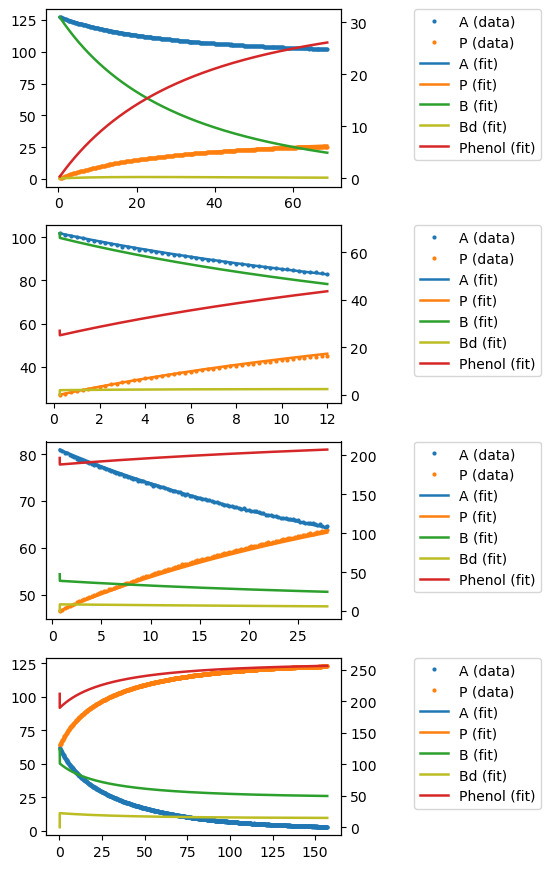

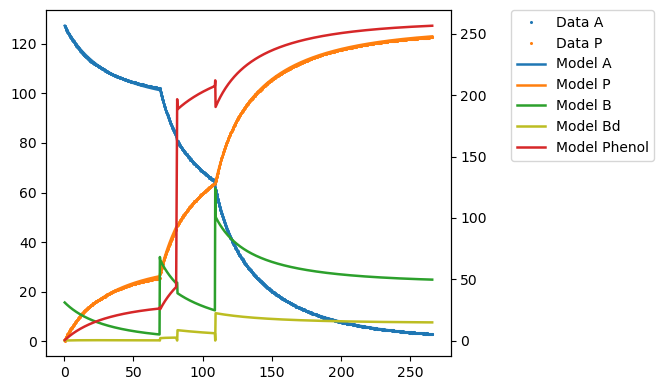

array([0.00368464, 0.02899924, 0.00116129])

In [15]:
for path in Experiment_paths_C1[4:5]:
    print(os.path.basename(path))
    print('fit_and_analyse_selected_3parameter_model')
    fit_and_analyse_selected_3parameter_model_extra_plotting_options(path,convert_to_SI=True,figsize_final=(9, 4),subplot_figsize=(9, 2.2),plot_B=True,plot_Phenol=True,legend_anchor_subplot=1.25,legend_anchor_final=1.15)

#### Comparaison of Model Performance for C1_E5

Dataset being analysed: C1_E4b.xlsx
Model Function: fit_and_analyze_full_mechanism_no_inhibition()


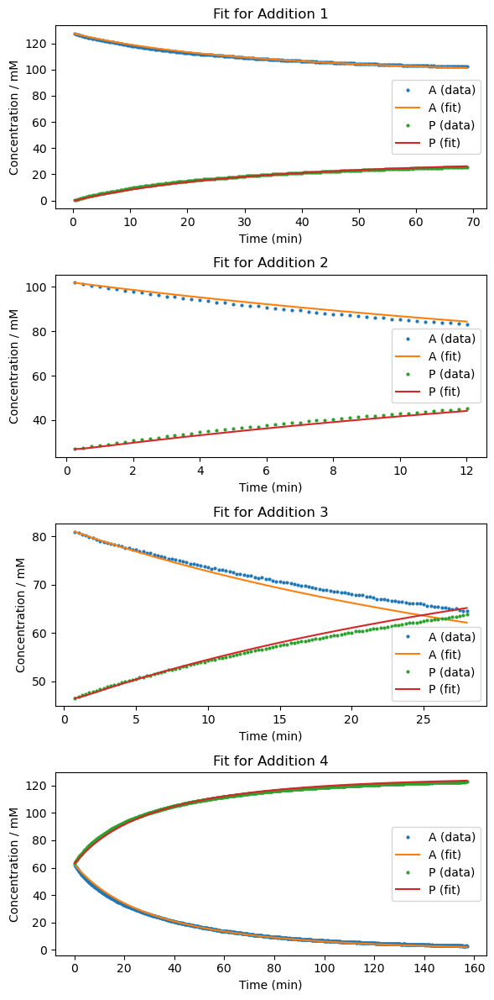

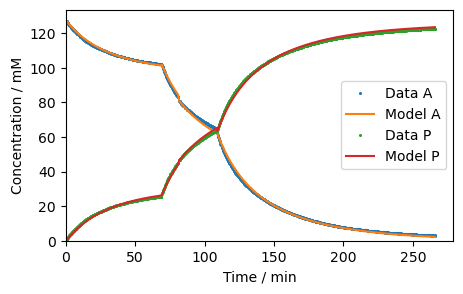

Model Function: fit_and_analyze_full_mechanism()
Number of datapoints per dataset: [275, 48, 110, 628]


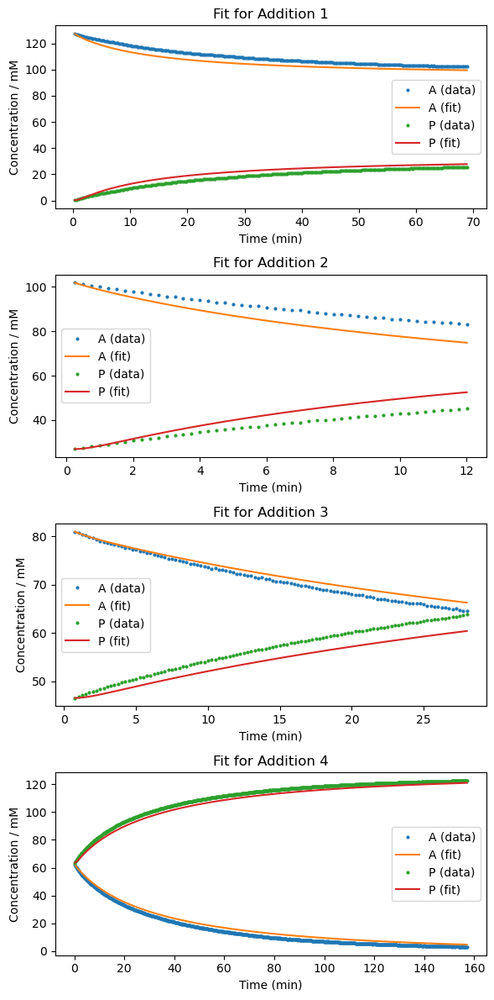

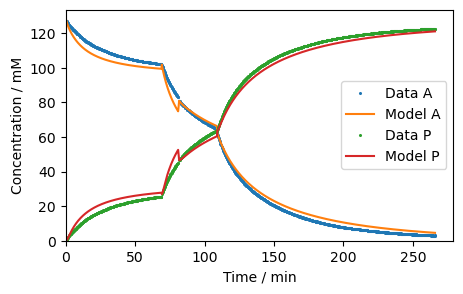

Model Function: fit_and_analyze_selected_3parameter_model()
Number of datapoints per SAKE period: [275, 48, 110, 628]


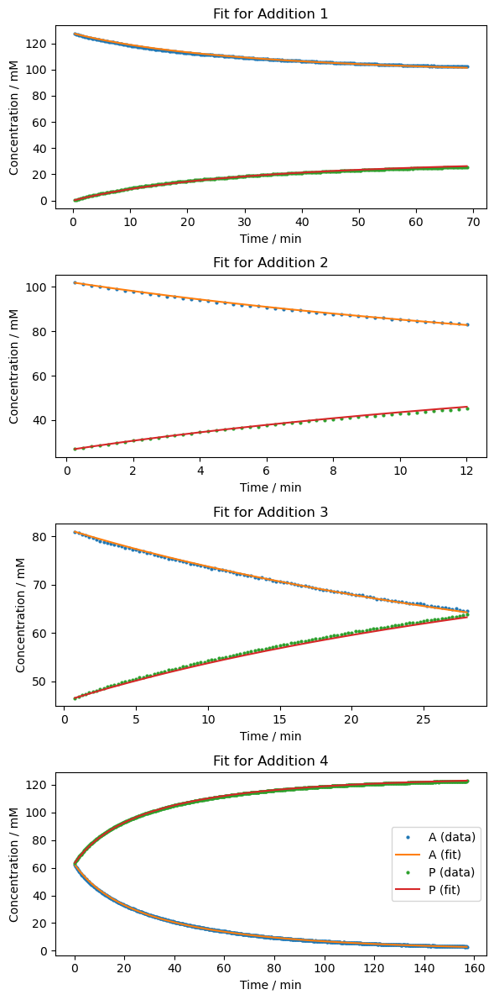

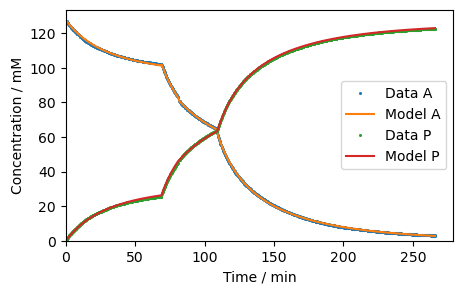

Model Function: fit_and_analyze_selected_3parameter_model_no_KI()
Number of datapoints per SAKE period: [275, 48, 110, 628]


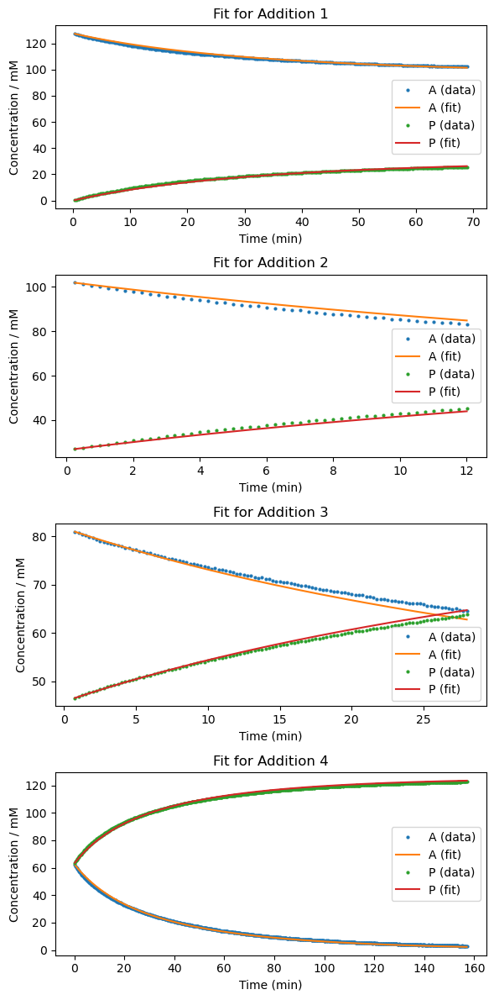

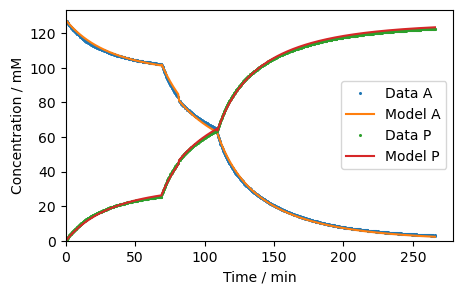

array([0.0038561 , 0.00913127])

Model Function: fit_and_analyze_selected_3parameter_model_only_Kk2()


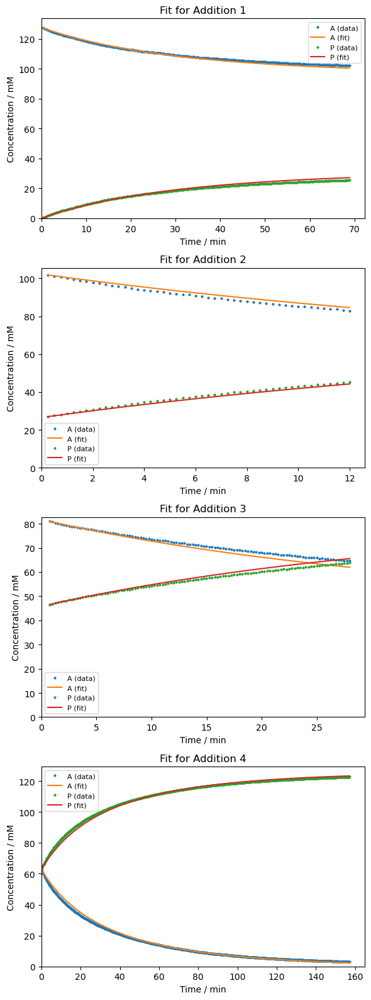

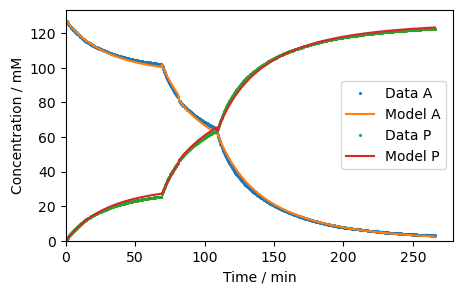

Model Function: fit_and_analyze_selected_3parameter_model_only_Kk3()


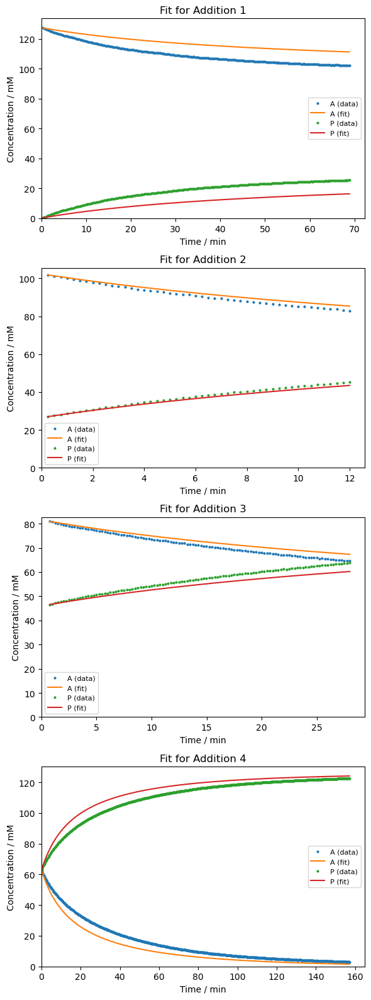

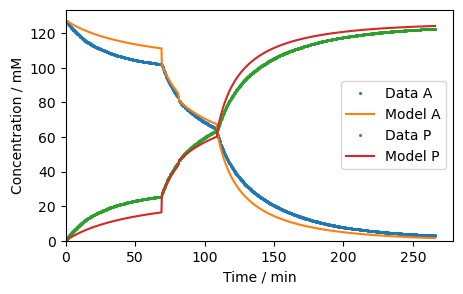

In [16]:
for path in Experiment_paths_C1[4:5]:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    print('Model Function: fit_and_analyse_full_mechanism_no_inhibition()')
    fit_and_analyse_full_mechanism_no_inhibition(path,convert_to_SI=True,figsize_final=(5, 3))
    
    print('Model Function: fit_and_analyse_full_mechanism()')
    fit_and_analyse_full_mechanism(path,convert_to_SI=True,figsize_final=(5, 3))
    
    print('Model Function: fit_and_analyse_selected_3parameter_model()')
    fit_and_analyse_selected_3parameter_model(path,convert_to_SI=True,figsize_final=(5, 3))
    
    print('Model Function: fit_and_analyse_selected_3parameter_model_no_KI()')
    fit_and_analyse_selected_3parameter_model_no_KI(path,convert_to_SI=True,figsize_final=(5, 3))
    
    print('Model Function: fit_and_analyse_selected_3parameter_model_only_Kk2()')
    fit_and_analyse_selected_3parameter_model_only_Kk2(path,convert_to_SI=True,figsize_final=(5, 3))
    
    print('Model Function: fit_and_analyse_selected_3parameter_model_only_Kk3()')
    fit_and_analyse_selected_3parameter_model_only_Kk3(path,convert_to_SI=True,figsize_final=(5, 3))

#### Full Mechanism no Inhibtion (F4)

Dataset being analysed: C1_E1.xlsx


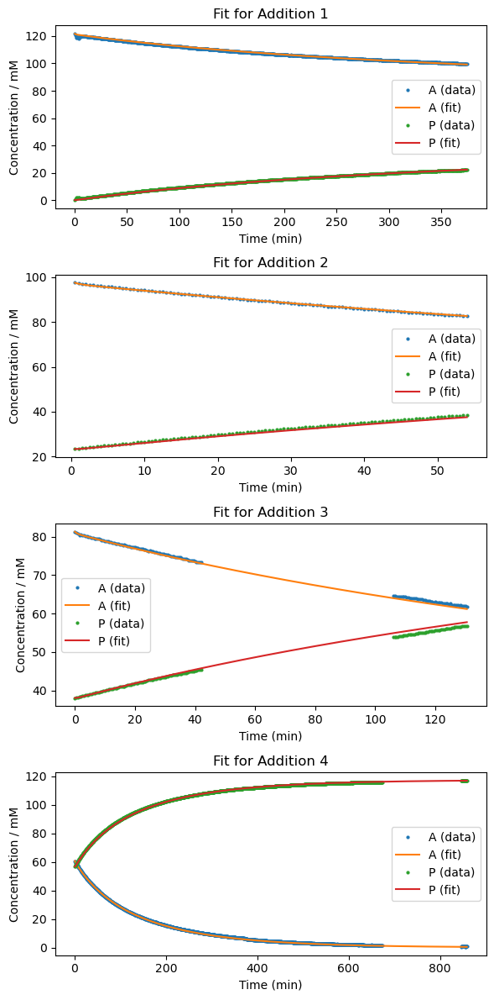

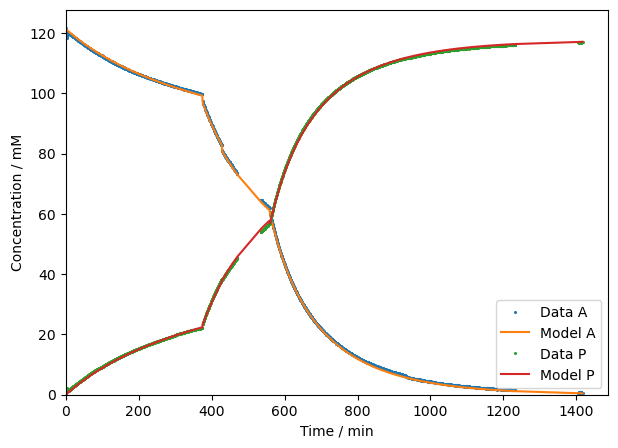

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.001740002,0.014522801,0.001548424,0.044148766,0.999928824,0.999887792,0.384866418,0.464933595,0.424900007


Dataset being analysed: C1_E2.xlsx


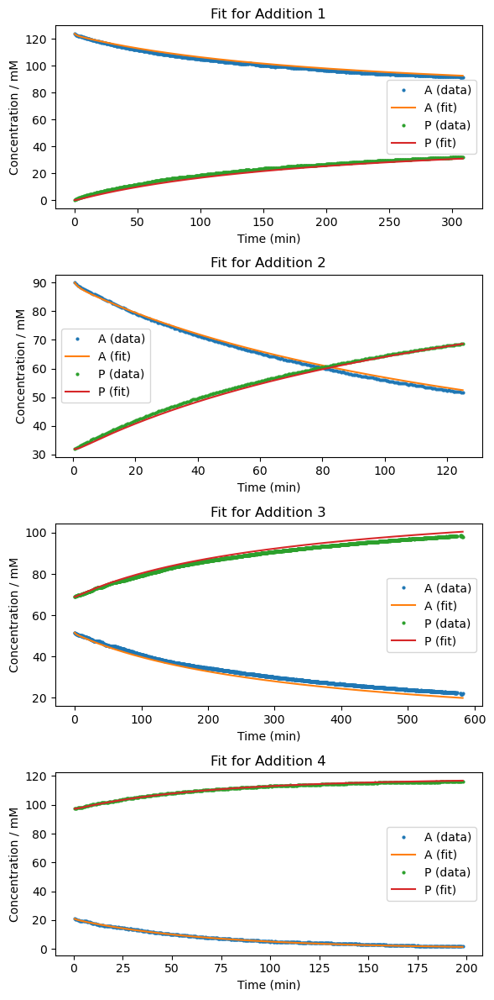

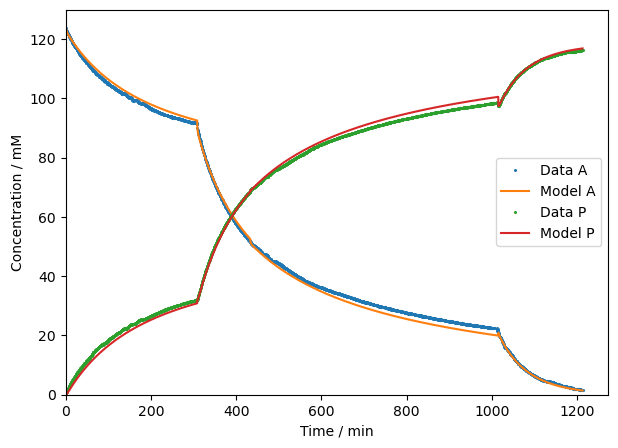

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E2,0.002955629,0.008124057,0.001530183,0.033772636,0.998318947,0.998400481,1.437409414,1.340197072,1.388803243


Dataset being analysed: C1_E3.xlsx


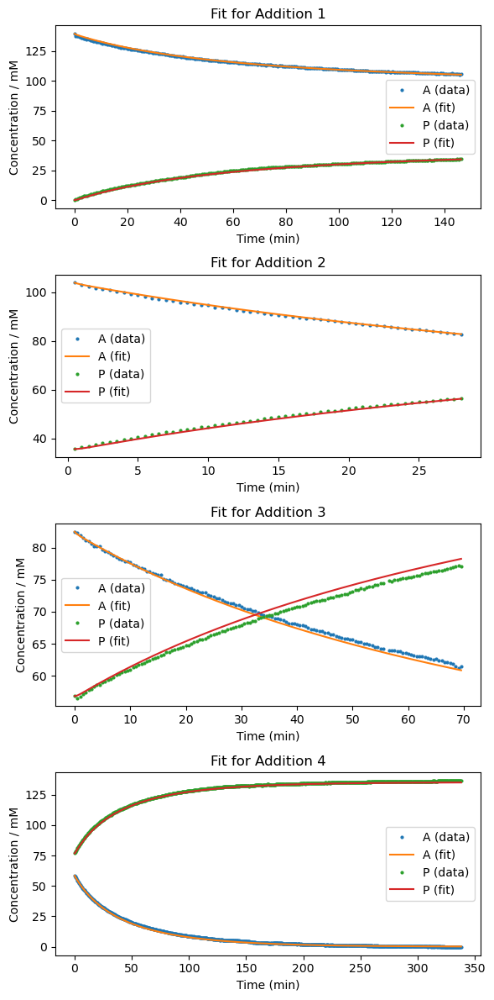

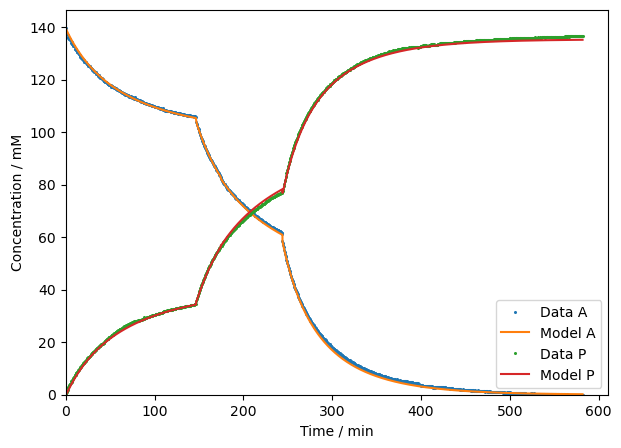

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E3,0.004199499,0.017747502,0.008834058,0.232908712,0.999850522,0.999695928,0.589185526,0.814642710,0.701914118


Dataset being analysed: C1_E4a.xlsx


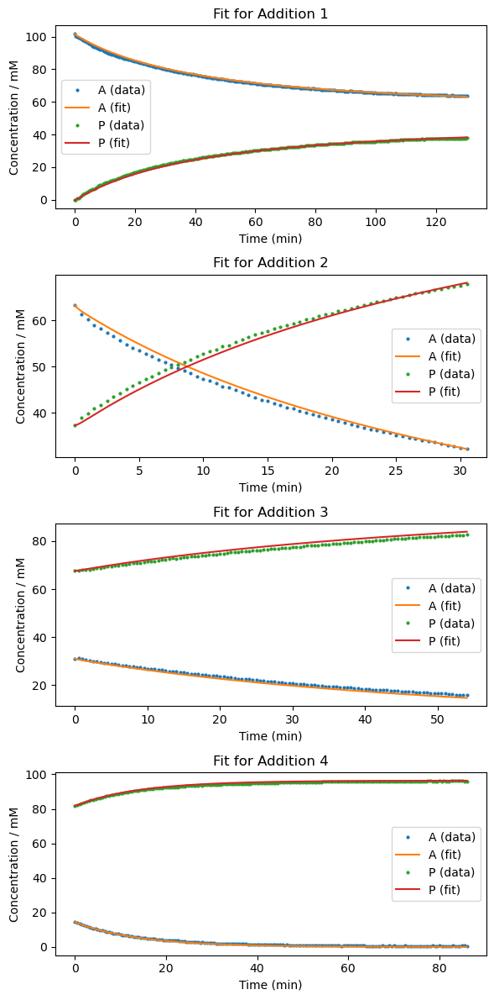

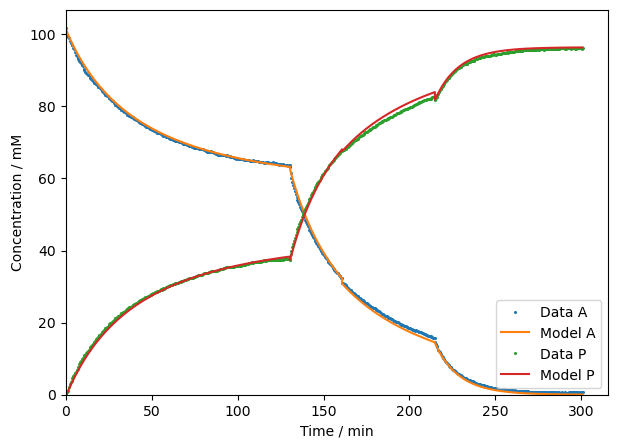

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4a,0.010482022,0.037628325,0.018732705,0.205168589,0.999593618,0.999421483,0.635643213,0.709294831,0.672469022


Dataset being analysed: C1_E4b.xlsx


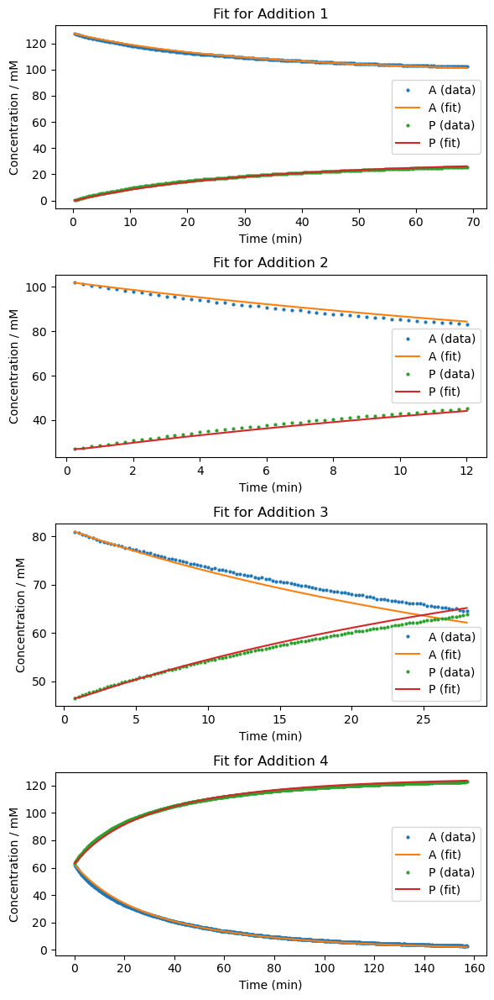

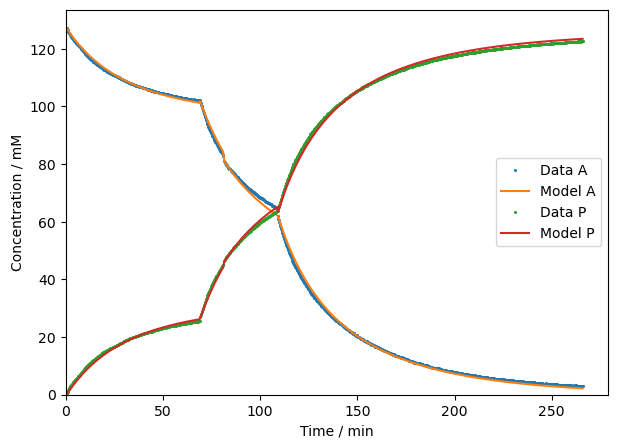

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4b,0.004866198,0.004818362,0.010860683,0.994572812,0.999611844,0.999570063,0.855909125,0.880188156,0.868048641


Dataset being analysed: C1_E5.xlsx


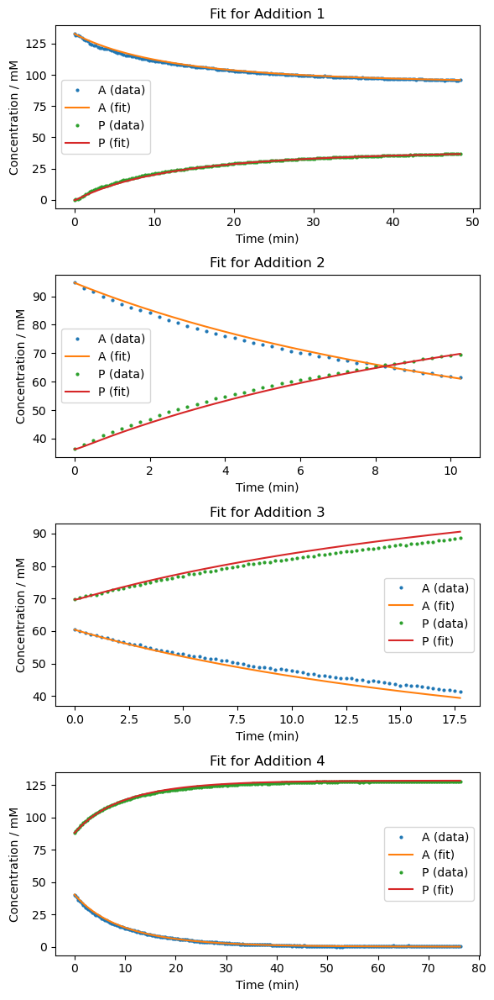

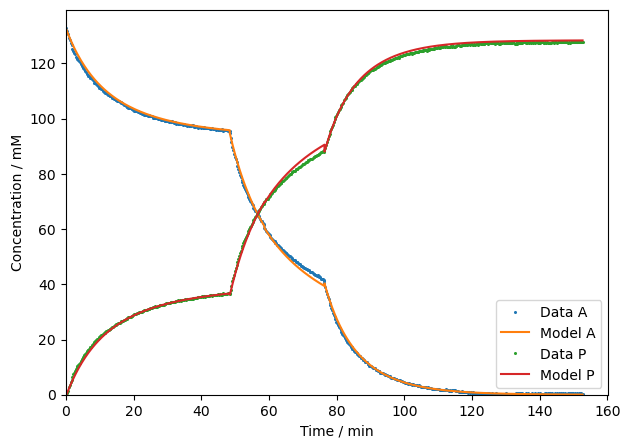

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E5,0.011675746,0.015520883,0.003887849,2.522661287,0.999726762,0.999630780,0.745548750,0.829589466,0.787569108


Dataset being analysed: C1_E6.xlsx


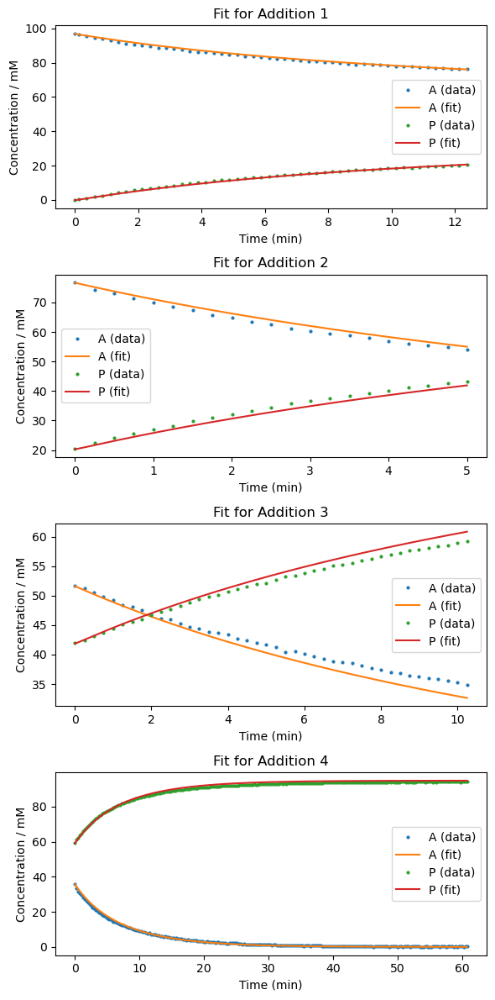

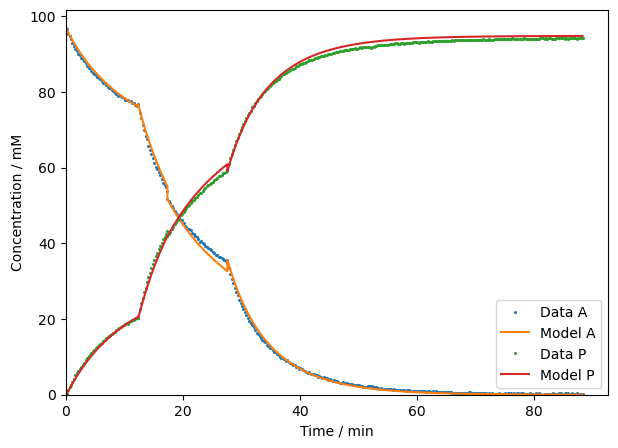

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E6,0.016977936,0.021208968,0.129020958,6.029904260,0.999425514,0.999130865,0.737250895,0.881131743,0.809191319


Dataset being analysed: C1_E7.xlsx


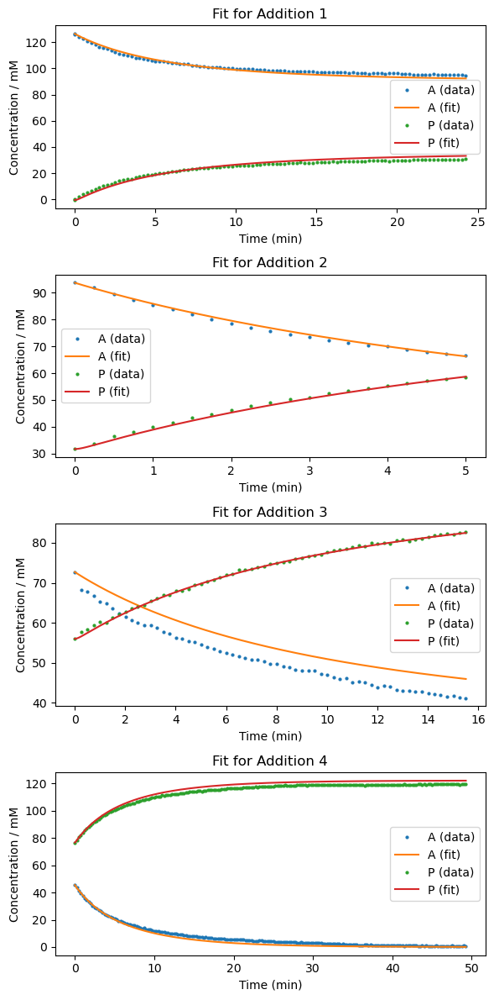

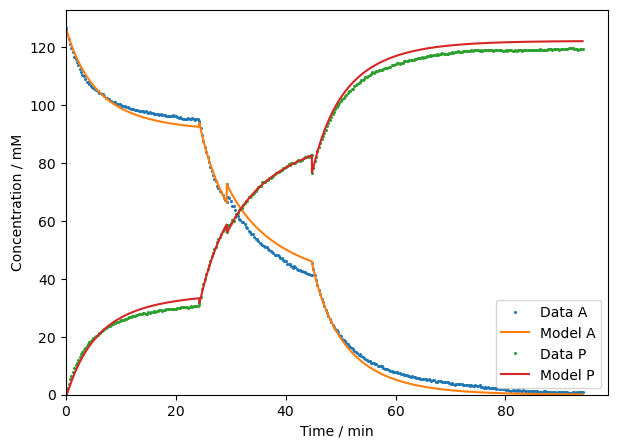

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.025157691,0.010165656,0.000065487,3.312281072,0.996806443,0.997333702,2.324605386,2.023077405,2.173841396


In [17]:
results_full_mechanism_no_inhibition = []

for path in Experiment_paths_C1:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_full_mechanism_no_inhibition(path,convert_to_SI=True)
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_full_mechanism_no_inhibition.append(best_params)

In [18]:
results_full_mechanism_no_inhibition_DF = pd.concat(results_full_mechanism_no_inhibition, ignore_index=True)
results_full_mechanism_no_inhibition_DF

,Dataset,k1f,k1r,k2,k3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.001740002,0.014522801,0.001548424,0.044148766,0.999928824,0.999887792,0.384866418,0.464933595,0.424900007
1,C1_E2,0.002955629,0.008124057,0.001530183,0.033772636,0.998318947,0.998400481,1.437409414,1.340197072,1.388803243
2,C1_E3,0.004199499,0.017747502,0.008834058,0.232908712,0.999850522,0.999695928,0.589185526,0.814642710,0.701914118
3,C1_E4a,0.010482022,0.037628325,0.018732705,0.205168589,0.999593618,0.999421483,0.635643213,0.709294831,0.672469022
4,C1_E4b,0.004866198,0.004818362,0.010860683,0.994572812,0.999611844,0.999570063,0.855909125,0.880188156,0.868048641
5,C1_E5,0.011675746,0.015520883,0.003887849,2.522661287,0.999726762,0.999630780,0.745548750,0.829589466,0.787569108
6,C1_E6,0.016977936,0.021208968,0.129020958,6.029904260,0.999425514,0.999130865,0.737250895,0.881131743,0.809191319
7,C1_E7,0.025157691,0.010165656,0.000065487,3.312281072,0.996806443,0.997333702,2.324605386,2.023077405,2.173841396


#### Full mechanism with reversible inhbition 

Dataset being analysed: C1_E1.xlsx
Number of datapoints per dataset: [749, 108, 135, 1371]


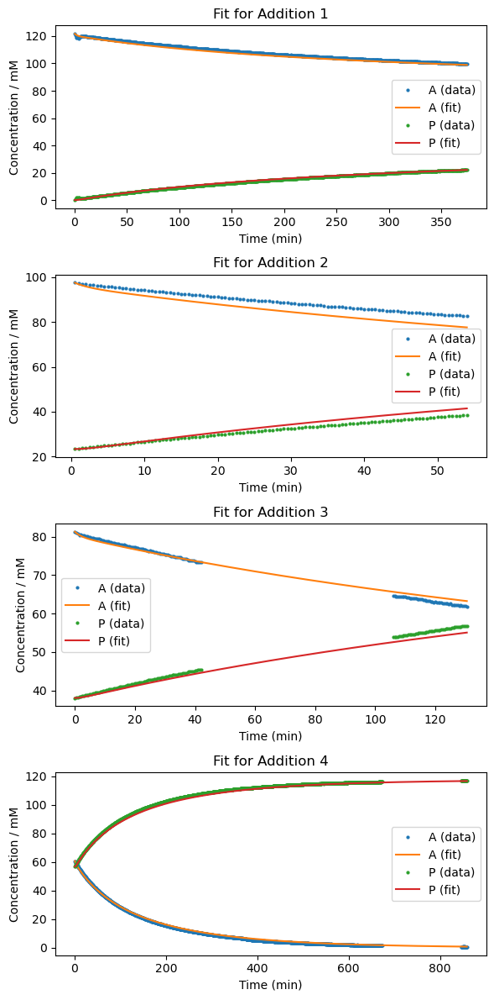

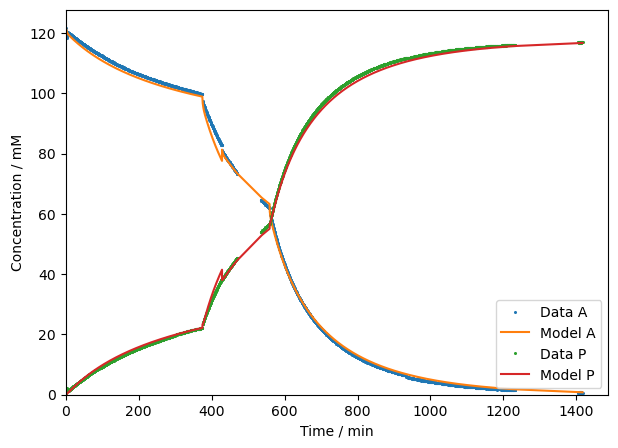

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.002352968,0.005821740,0.000003943,0.030267861,0.002394234,0.999348482,0.999413087,1.164410334,1.063325109,1.113867722


Dataset being analysed: C1_E2.xlsx
Number of datapoints per dataset: [617, 250, 1155, 396]


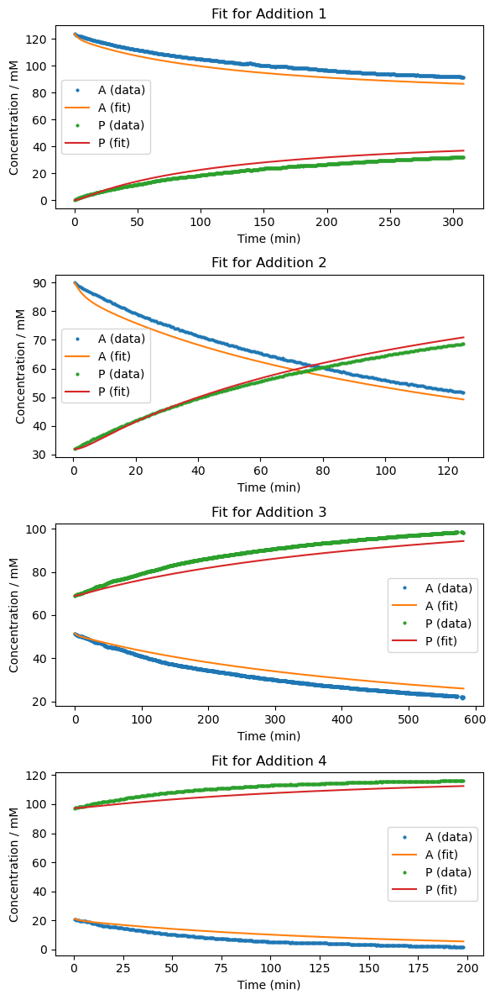

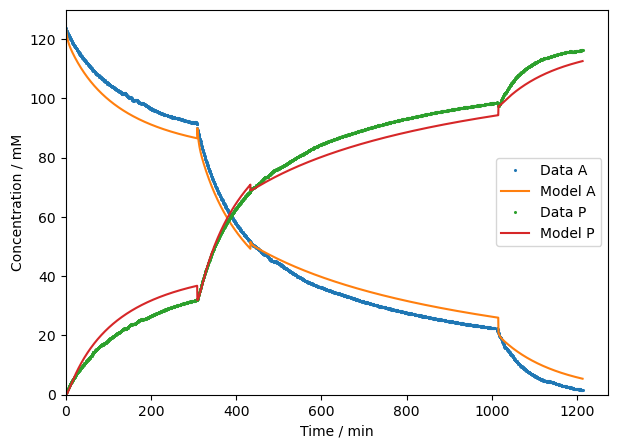

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E2,0.004686868,0.003712052,0.001245083,0.007996861,0.007313358,0.987115353,0.985778653,3.979477730,3.996173472,3.987825601


Dataset being analysed: C1_E3.xlsx
Number of datapoints per dataset: [294, 56, 139, 677]


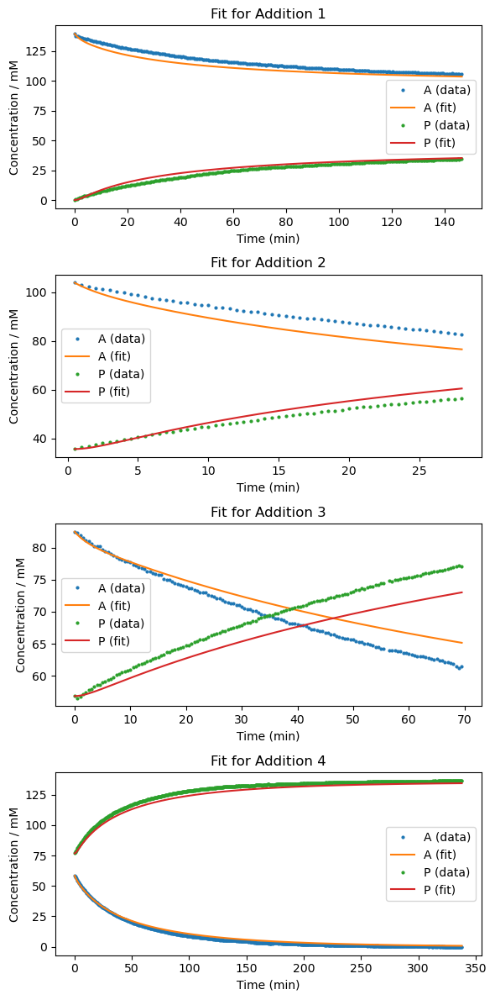

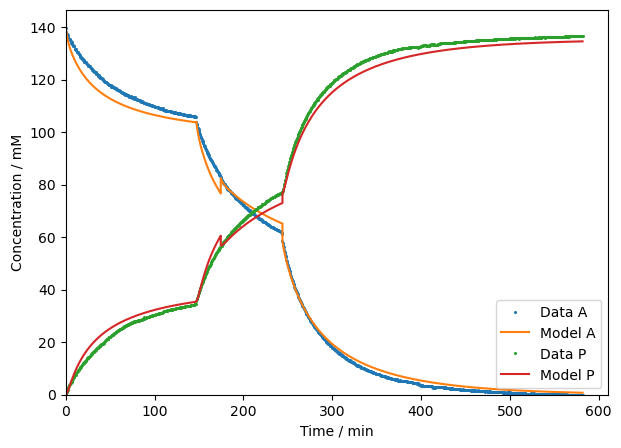

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E3,0.008789401,0.004602088,0.000938852,0.095207525,0.008059153,0.996900072,0.996537830,2.683118654,2.748861322,2.715989988


Dataset being analysed: C1_E4a.xlsx
Number of datapoints per dataset: [262, 62, 109, 173]


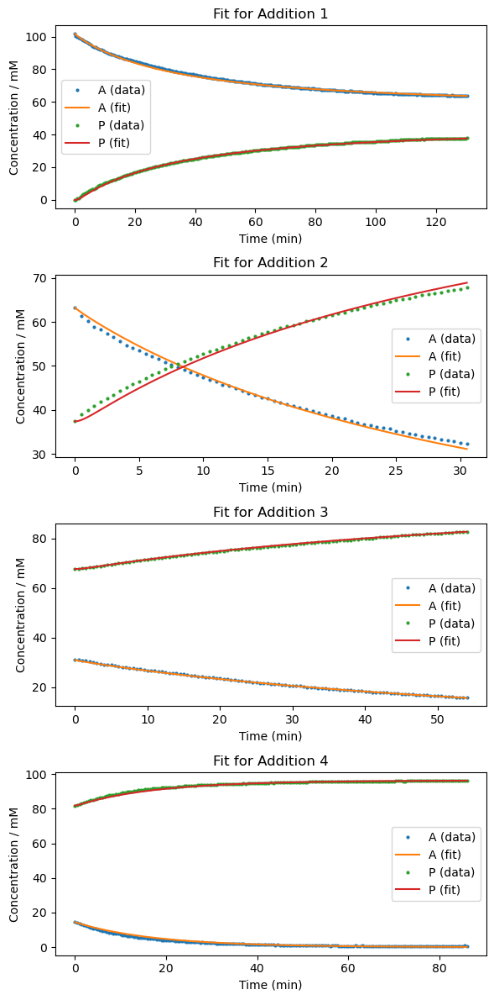

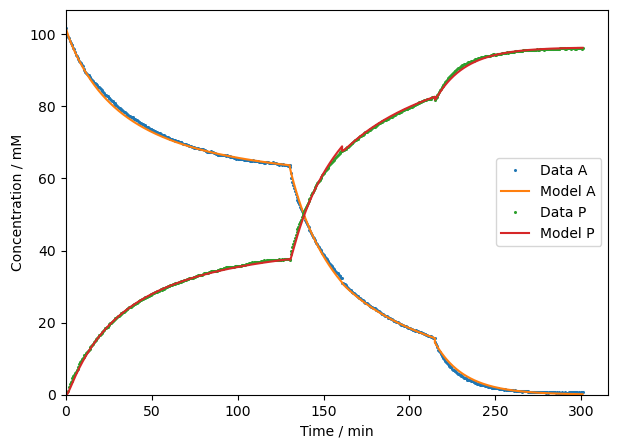

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4a,0.006803288,0.003895292,0.001879509,0.248273662,0.001285397,0.999749089,0.999735071,0.499465865,0.479991635,0.489728750


Dataset being analysed: C1_E4b.xlsx
Number of datapoints per dataset: [275, 48, 110, 628]


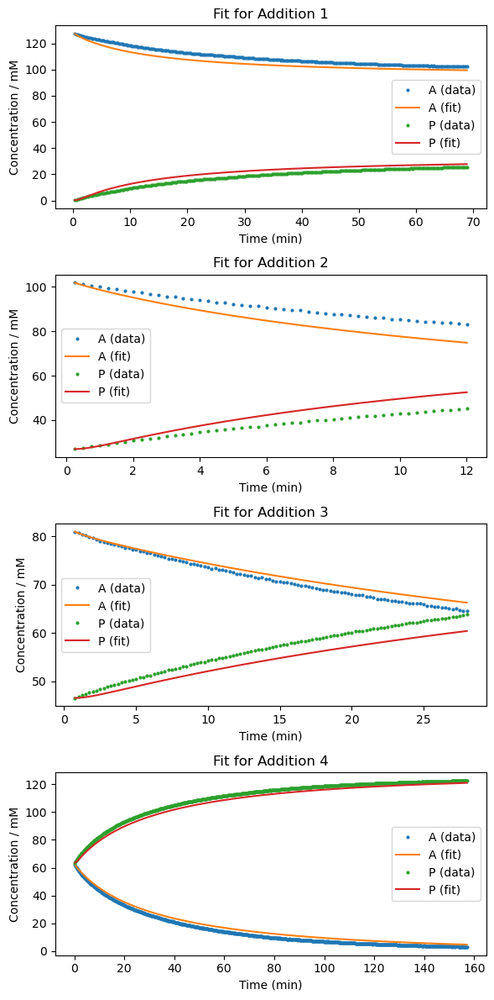

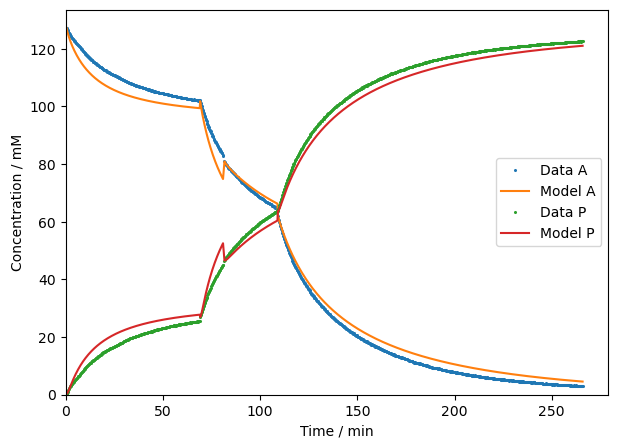

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4b,0.013574406,0.006140532,0.001748514,0.464652466,0.008783037,0.994921990,0.995285492,3.095786680,2.914683887,3.005235283


Dataset being analysed: C1_E5.xlsx
Number of datapoints per dataset: [195, 42, 72, 306]


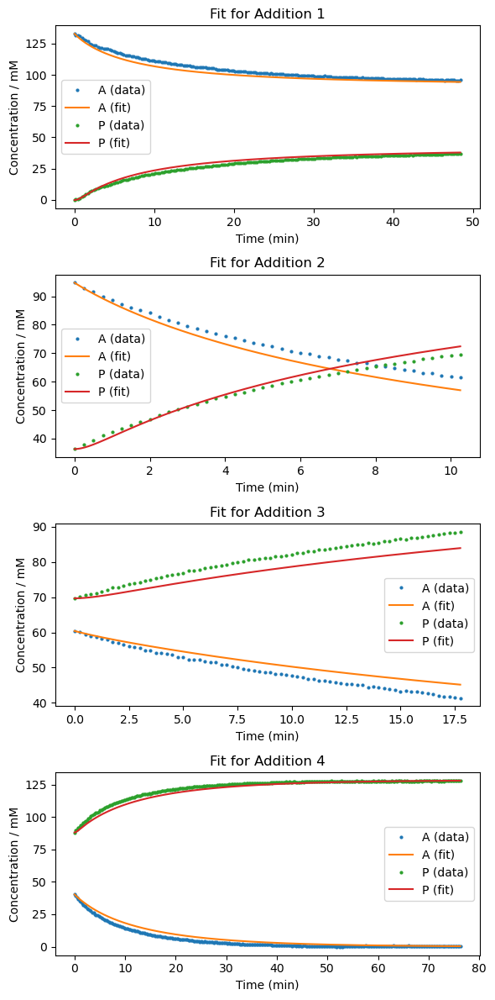

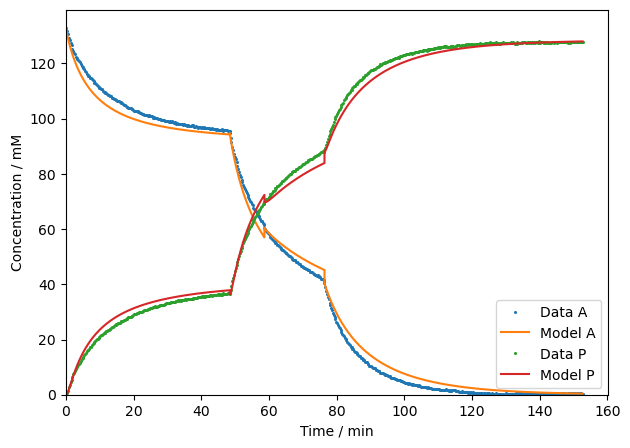

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E5,0.020640325,0.003892040,0.002521619,0.516288179,0.009697948,0.996636396,0.997438701,2.615822724,2.184997540,2.400410132


Dataset being analysed: C1_E6.xlsx
Number of datapoints per dataset: [51, 21, 42, 244]


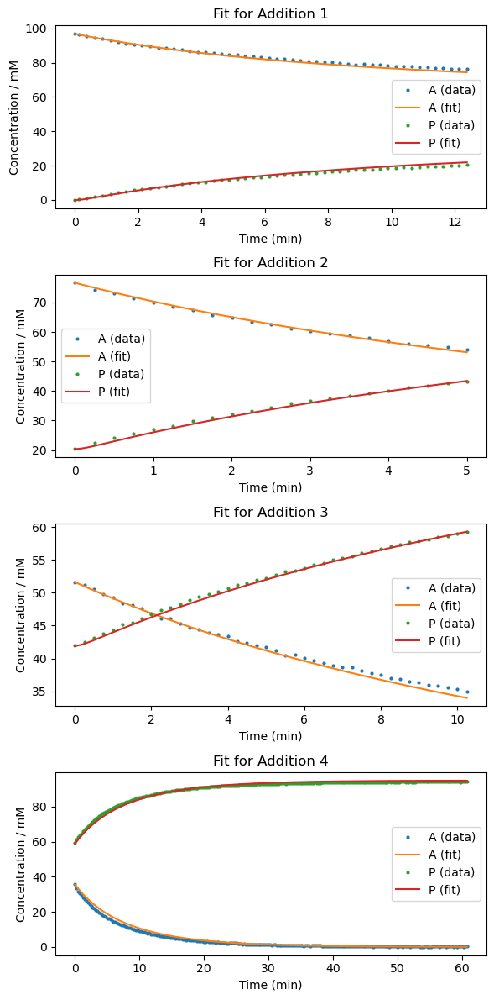

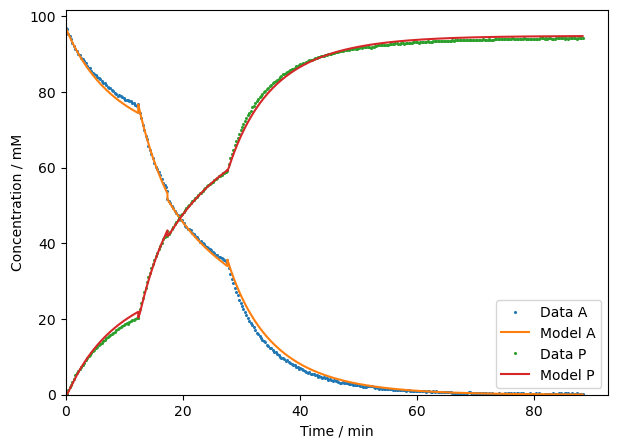

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E6,0.019848346,0.002821912,0.012735447,1.856276555,0.001971983,0.999137459,0.999357284,0.903369469,0.757716716,0.830543092


Dataset being analysed: C1_E7.xlsx
Number of datapoints per dataset: [99, 21, 63, 198]


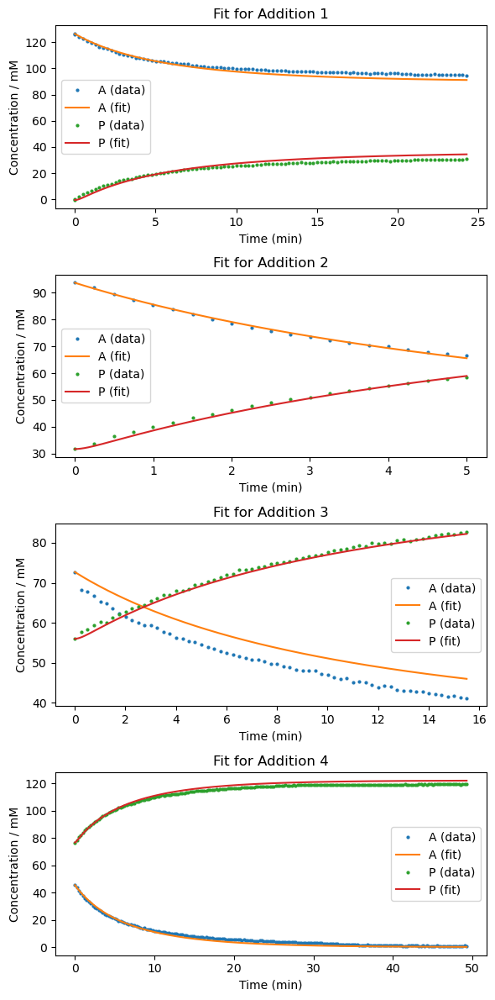

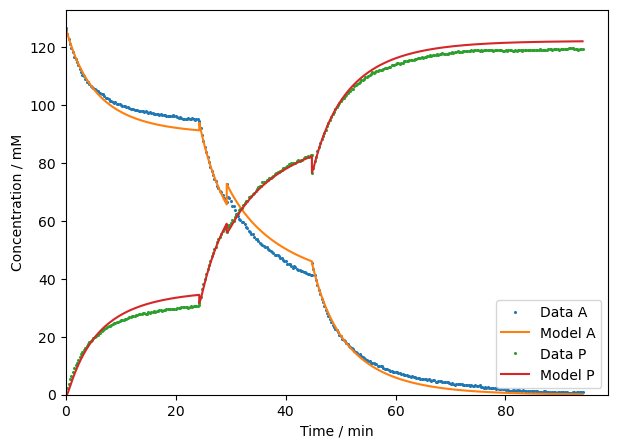

Best-fit parameters:


,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.026142586,0.002780035,0.006301743,1.684921352,0.000643138,0.996409895,0.997242674,2.464707875,2.057321949,2.261014912


In [19]:
results_full_mechanism = []

for path in Experiment_paths_C1:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_full_mechanism(path,convert_to_SI=True)
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_full_mechanism.append(best_params)


In [20]:
results_full_mechanism_DF = pd.concat(results_full_mechanism, ignore_index=True)
results_full_mechanism_DF

,Dataset,k1f,k1r,k2,k3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.002352968,0.005821740,0.000003943,0.030267861,0.002394234,0.999348482,0.999413087,1.164410334,1.063325109,1.113867722
1,C1_E2,0.004686868,0.003712052,0.001245083,0.007996861,0.007313358,0.987115353,0.985778653,3.979477730,3.996173472,3.987825601
2,C1_E3,0.008789401,0.004602088,0.000938852,0.095207525,0.008059153,0.996900072,0.996537830,2.683118654,2.748861322,2.715989988
3,C1_E4a,0.006803288,0.003895292,0.001879509,0.248273662,0.001285397,0.999749089,0.999735071,0.499465865,0.479991635,0.489728750
4,C1_E4b,0.013574406,0.006140532,0.001748514,0.464652466,0.008783037,0.994921990,0.995285492,3.095786680,2.914683887,3.005235283
5,C1_E5,0.020640325,0.003892040,0.002521619,0.516288179,0.009697948,0.996636396,0.997438701,2.615822724,2.184997540,2.400410132
6,C1_E6,0.019848346,0.002821912,0.012735447,1.856276555,0.001971983,0.999137459,0.999357284,0.903369469,0.757716716,0.830543092
7,C1_E7,0.026142586,0.002780035,0.006301743,1.684921352,0.000643138,0.996409895,0.997242674,2.464707875,2.057321949,2.261014912


#### Simplified Mechanism Without Reversible Inhbition (S2)

Dataset being analysed: C1_E1.xlsx
Number of datapoints per SAKE period: [749, 108, 135, 1371]


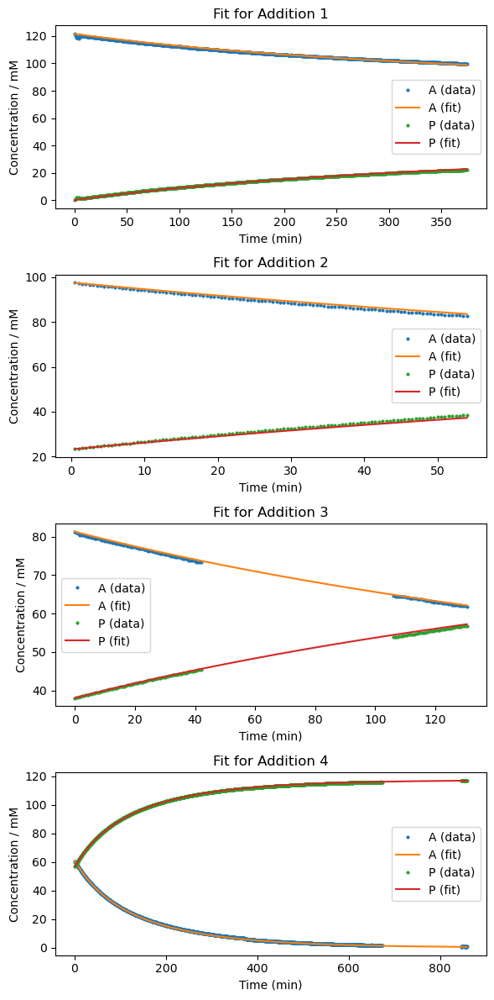

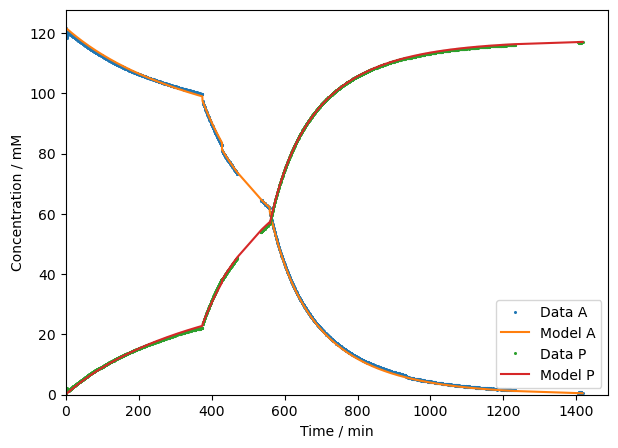

array([0.00021322, 0.00265783])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E1,0.000213217,0.002657832,0.999897799,0.999942679,0.461180418,0.332303580,0.396741999


Dataset being analysed: C1_E2.xlsx
Number of datapoints per SAKE period: [617, 250, 1155, 396]


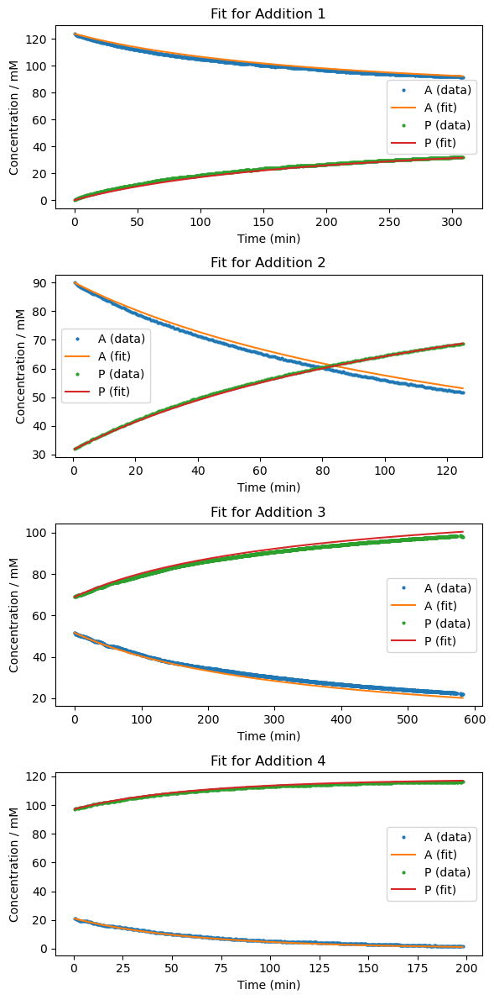

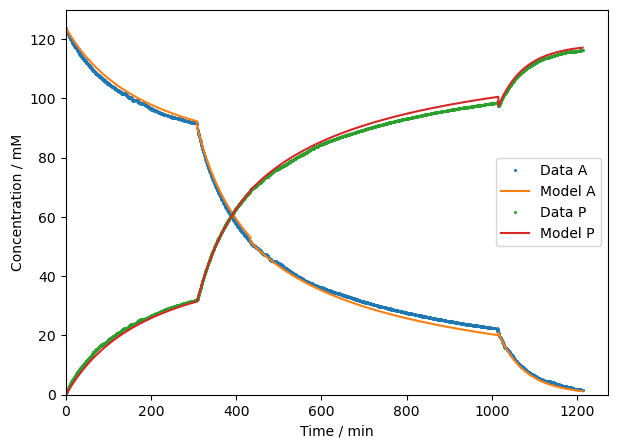

array([0.00053004, 0.00561408])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E2,0.000530044,0.005614083,0.998383382,0.998708762,1.409592382,1.204140470,1.306866426


Dataset being analysed: C1_E3.xlsx
Number of datapoints per SAKE period: [294, 56, 139, 677]


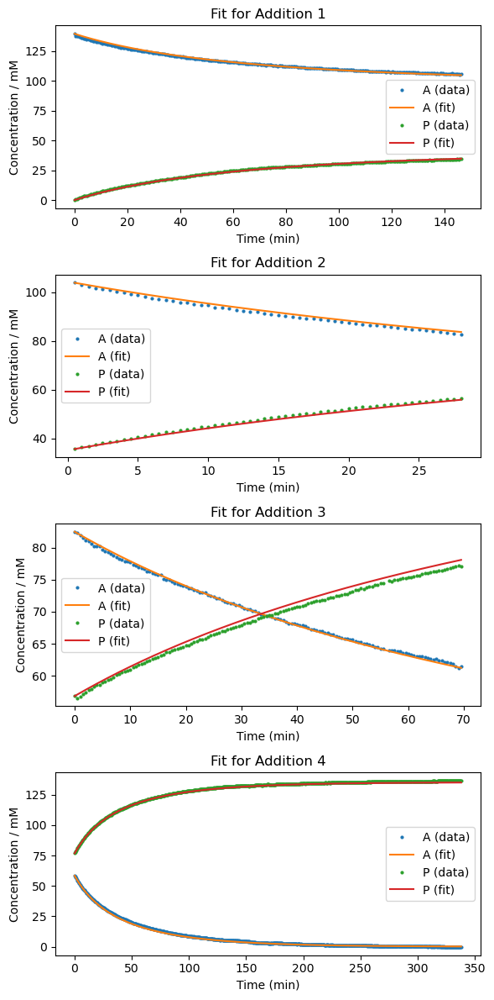

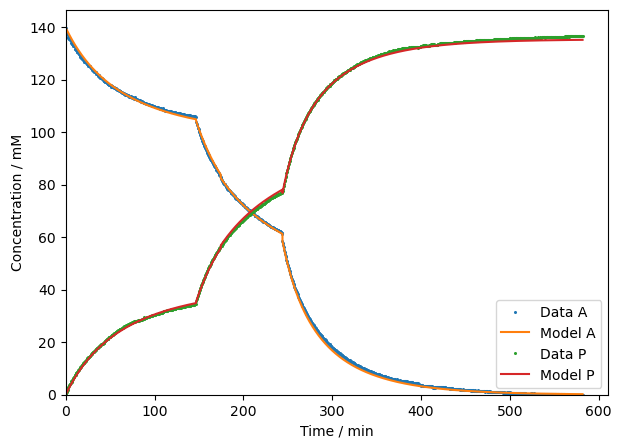

array([0.00165489, 0.00967459])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E3,0.001654889,0.009674590,0.999806984,0.999752279,0.669515997,0.735291796,0.702403897


Dataset being analysed: C1_E4a.xlsx
Number of datapoints per SAKE period: [262, 62, 109, 173]


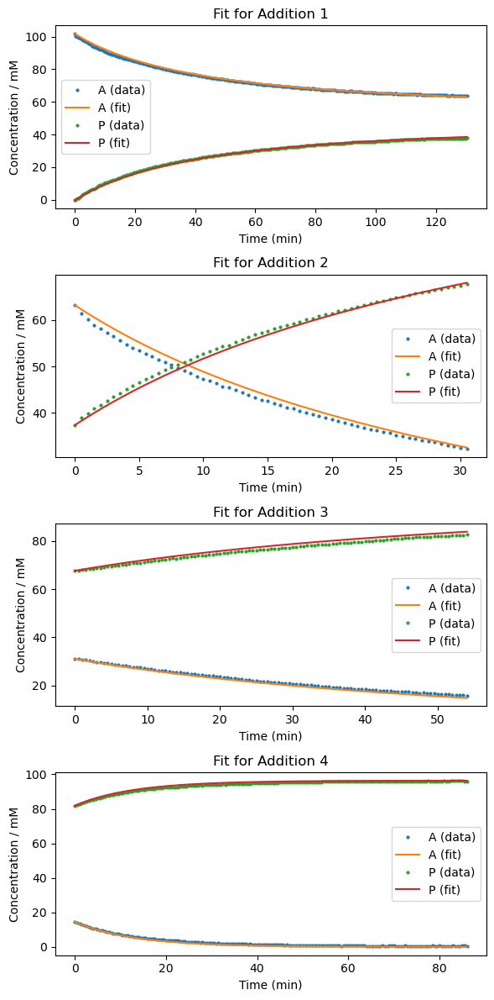

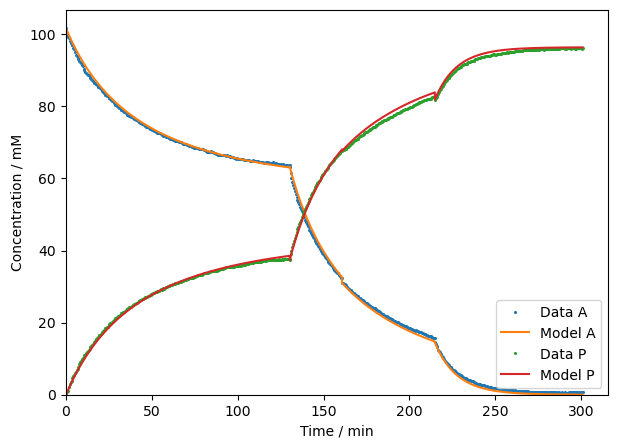

array([0.00363733, 0.01663924])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E4a,0.003637335,0.016639238,0.999477728,0.999437978,0.720600116,0.699109905,0.709855010


Dataset being analysed: C1_E4b.xlsx
Number of datapoints per SAKE period: [275, 48, 110, 628]


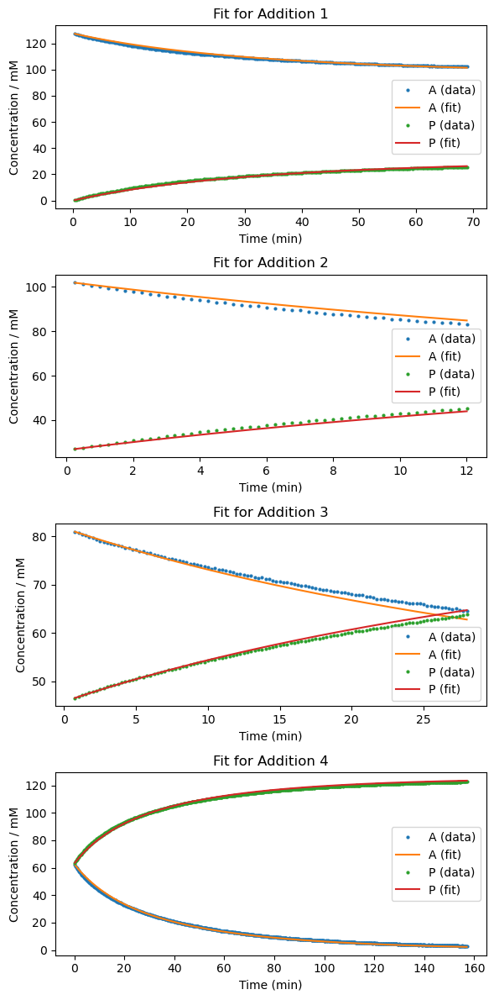

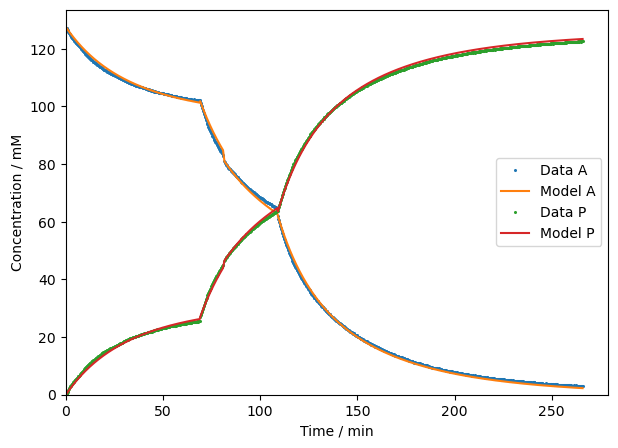

array([0.0038561 , 0.00913127])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E4b,0.003856104,0.009131270,0.999694707,0.999690723,0.759071722,0.746529802,0.752800762


Dataset being analysed: C1_E5.xlsx
Number of datapoints per SAKE period: [195, 42, 72, 306]


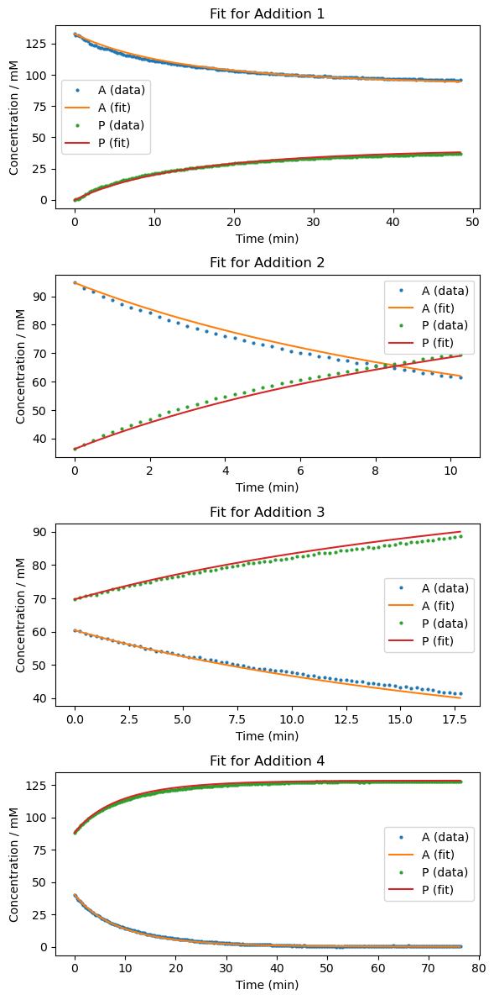

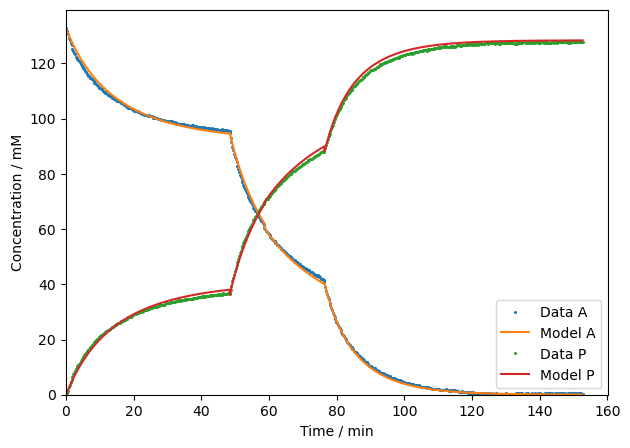

array([0.00866995, 0.02295615])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E5,0.008669949,0.022956148,0.999667386,0.999437935,0.822575882,1.023561888,0.923068885


Dataset being analysed: C1_E6.xlsx
Number of datapoints per SAKE period: [51, 21, 42, 244]


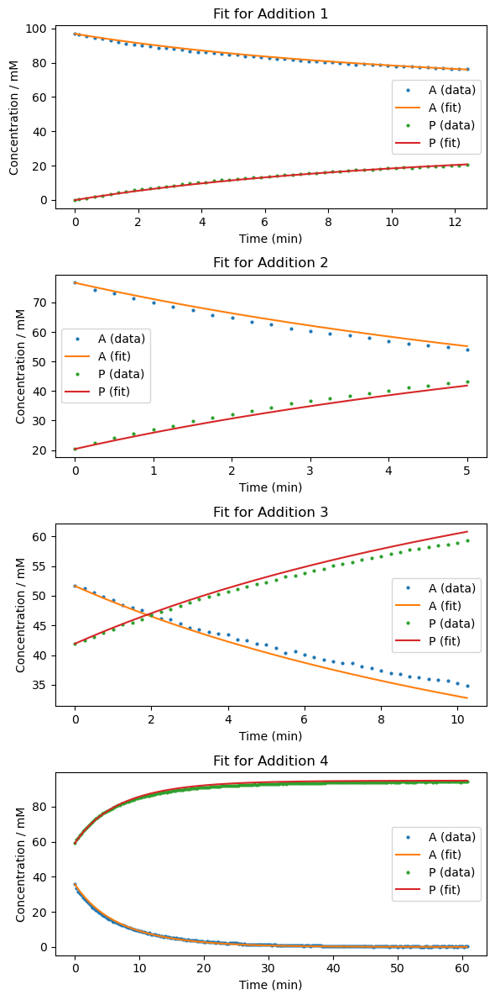

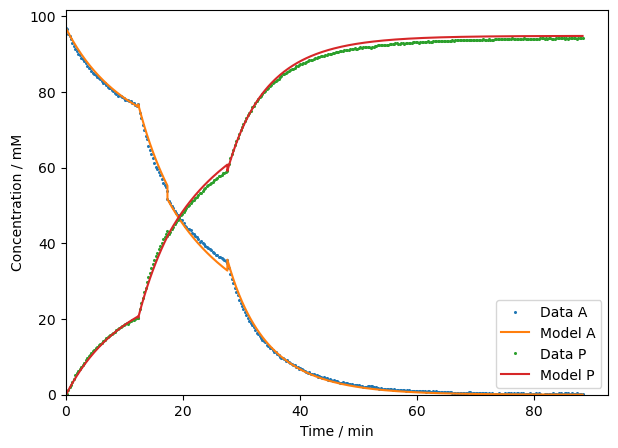

array([0.01548002, 0.00983646])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E6,0.015480020,0.009836464,0.999457245,0.999117249,0.716601368,0.888007249,0.802304309


Dataset being analysed: C1_E7.xlsx
Number of datapoints per SAKE period: [99, 21, 63, 198]


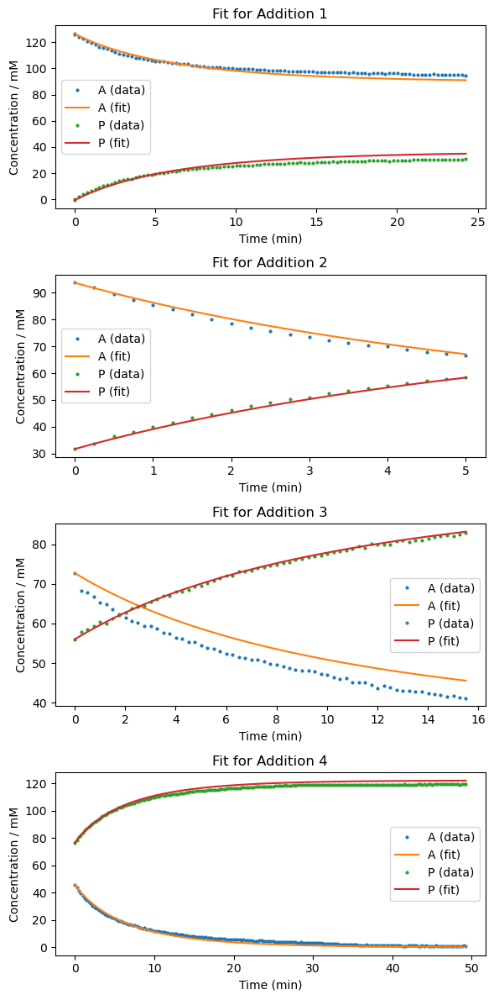

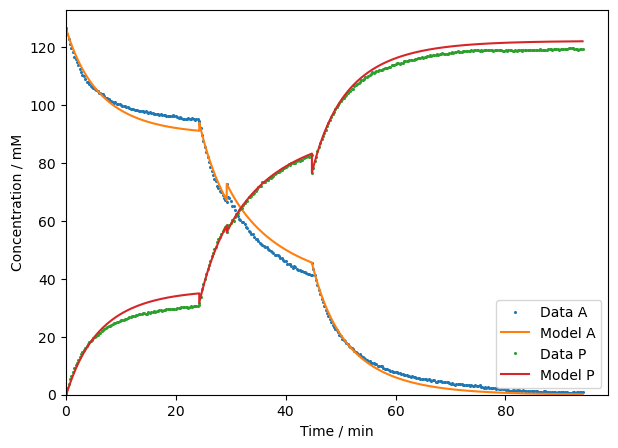

array([2.25686499e-02, 1.66666879e-07])

Best-fit parameters:


,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E7,0.022568650,0.000000167,0.996565158,0.996967132,2.410822839,2.157669388,2.284246114


In [21]:
results_simplified_mechanism_no_KI = []

for path in Experiment_paths_C1:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_selected_3parameter_model_no_KI(path,convert_to_SI=True)
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_simplified_mechanism_no_KI.append(best_params)


In [22]:
results_simplified_mechanism_no_KI_DF = pd.concat(results_simplified_mechanism_no_KI, ignore_index=True)
results_simplified_mechanism_no_KI_DF

,Dataset,Kk2,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_A_and_P
0,C1_E1,0.000213217,0.002657832,0.999897799,0.999942679,0.461180418,0.332303580,0.396741999
1,C1_E2,0.000530044,0.005614083,0.998383382,0.998708762,1.409592382,1.204140470,1.306866426
2,C1_E3,0.001654889,0.009674590,0.999806984,0.999752279,0.669515997,0.735291796,0.702403897
3,C1_E4a,0.003637335,0.016639238,0.999477728,0.999437978,0.720600116,0.699109905,0.709855010
4,C1_E4b,0.003856104,0.009131270,0.999694707,0.999690723,0.759071722,0.746529802,0.752800762
5,C1_E5,0.008669949,0.022956148,0.999667386,0.999437935,0.822575882,1.023561888,0.923068885
6,C1_E6,0.015480020,0.009836464,0.999457245,0.999117249,0.716601368,0.888007249,0.802304309
7,C1_E7,0.022568650,0.000000167,0.996565158,0.996967132,2.410822839,2.157669388,2.284246114


#### Simplified Mechanism with Reversible Inhbition 

Dataset being analysed: C1_E1.xlsx
Number of datapoints per SAKE period: [749, 108, 135, 1371]


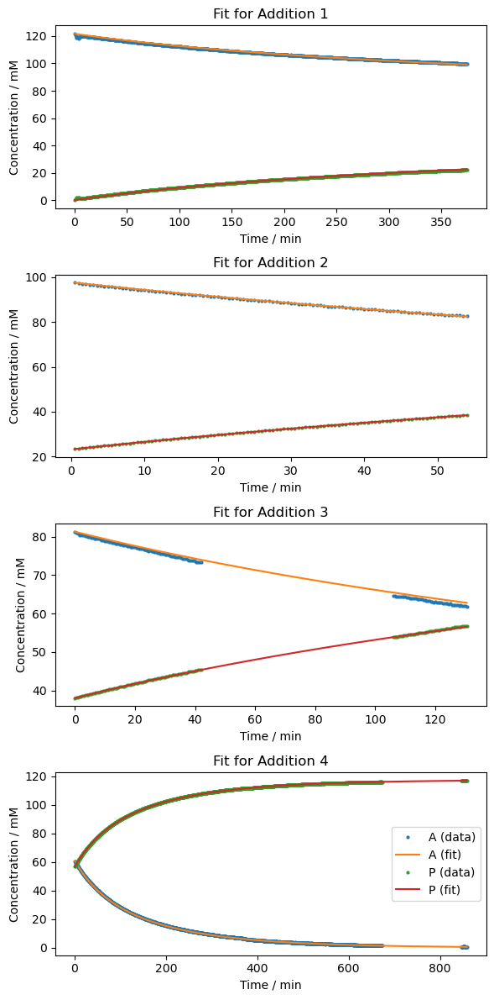

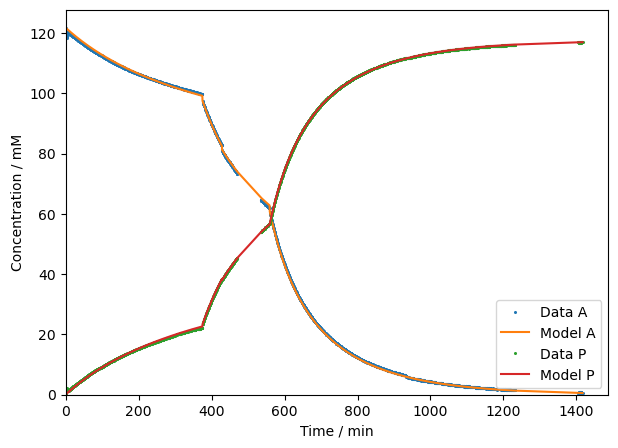

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.000182925,0.003605086,0.000528801,0.999936872,0.999978662,0.362455979,0.202748450,0.282602215


Dataset being analysed: C1_E2.xlsx
Number of datapoints per SAKE period: [617, 250, 1155, 396]


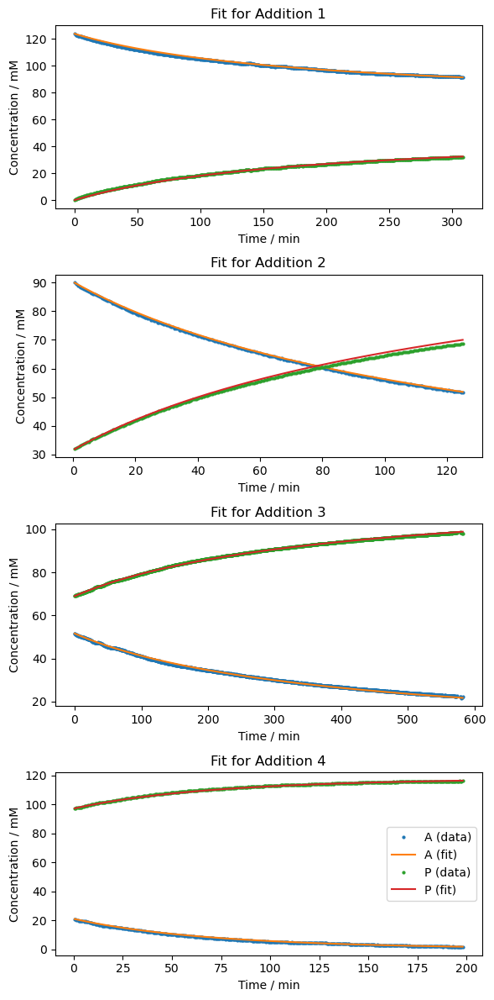

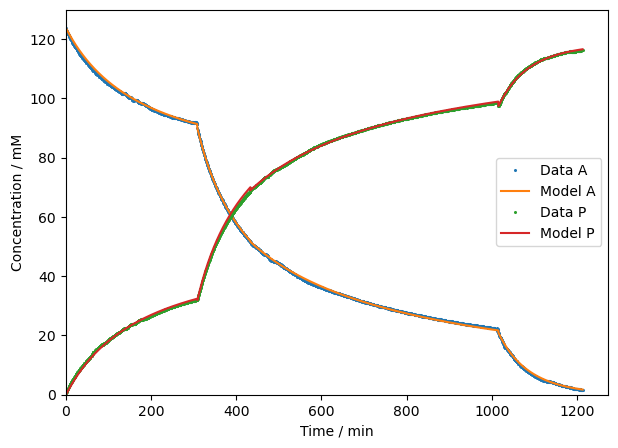

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E2,0.000568546,0.006754513,0.000804420,0.999855933,0.999855278,0.420796958,0.403126682,0.411961820


Dataset being analysed: C1_E3.xlsx
Number of datapoints per SAKE period: [294, 56, 139, 677]


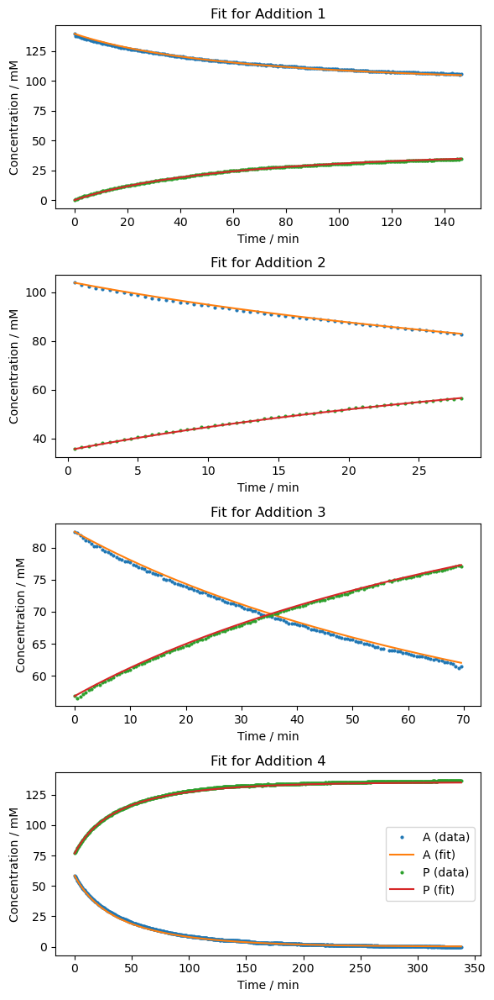

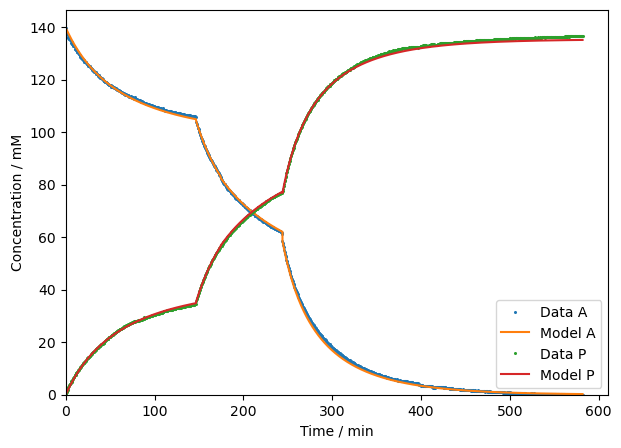

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E3,0.001613360,0.013886286,0.000590009,0.999836925,0.999764972,0.615401135,0.716206590,0.665803862


Dataset being analysed: C1_E4a.xlsx
Number of datapoints per SAKE period: [262, 62, 109, 173]


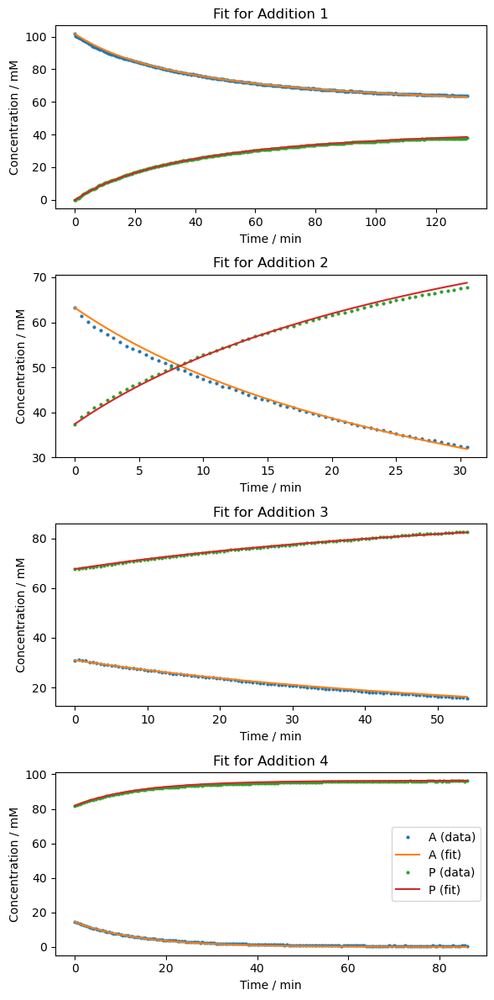

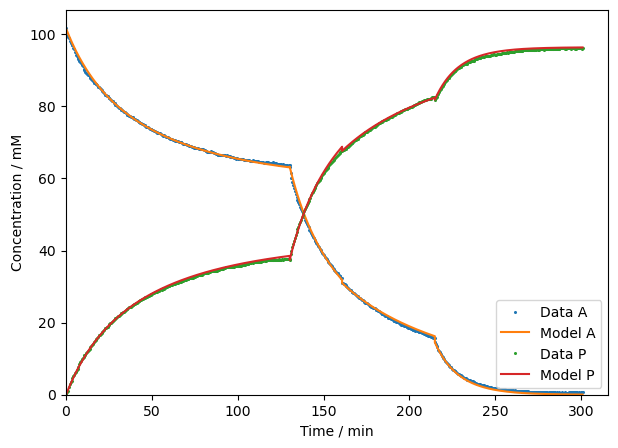

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4a,0.003630481,0.024767744,0.001071624,0.999805137,0.999847084,0.440159641,0.364665842,0.402412742


Dataset being analysed: C1_E4b.xlsx
Number of datapoints per SAKE period: [275, 48, 110, 628]


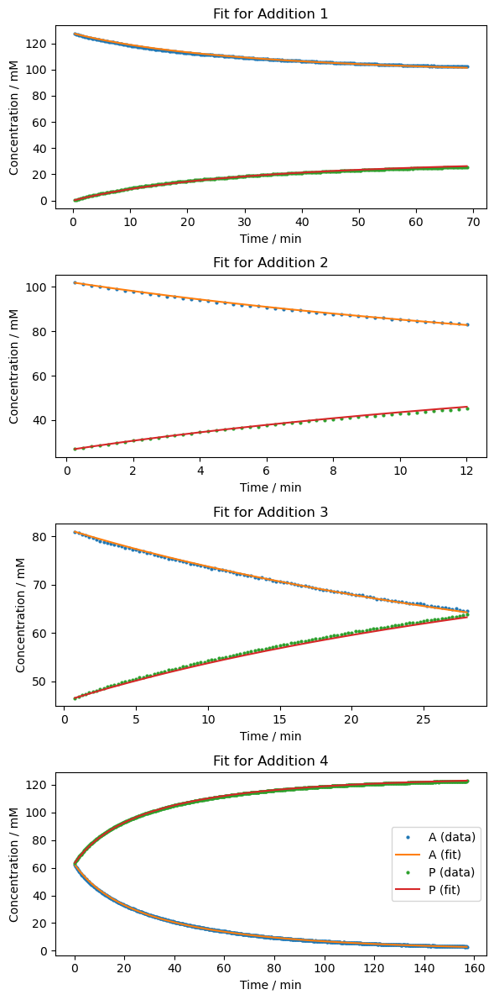

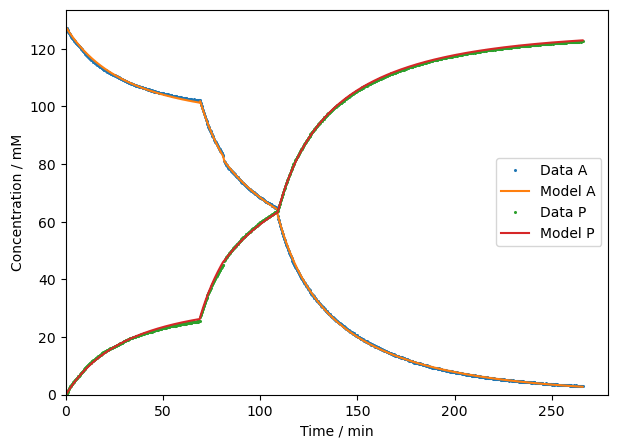

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4b,0.003684644,0.028999235,0.001161290,0.999952116,0.999925029,0.300620588,0.367554108,0.334087348


Dataset being analysed: C1_E5.xlsx
Number of datapoints per SAKE period: [195, 42, 72, 306]


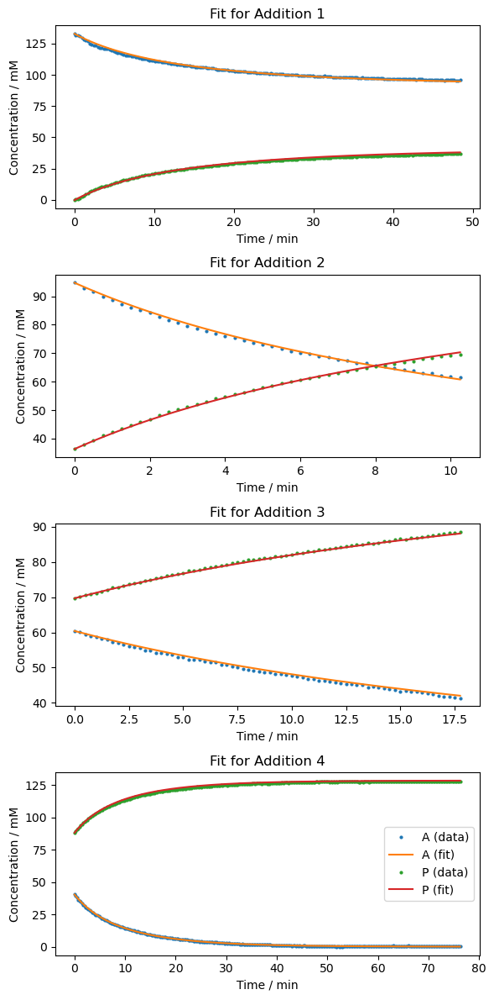

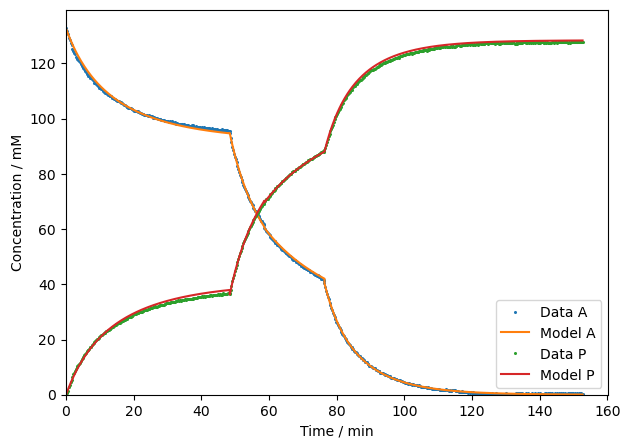

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E5,0.008578854,0.049354577,0.001407814,0.999869083,0.999742581,0.516064442,0.692694071,0.604379257


Dataset being analysed: C1_E6.xlsx
Number of datapoints per SAKE period: [51, 21, 42, 244]


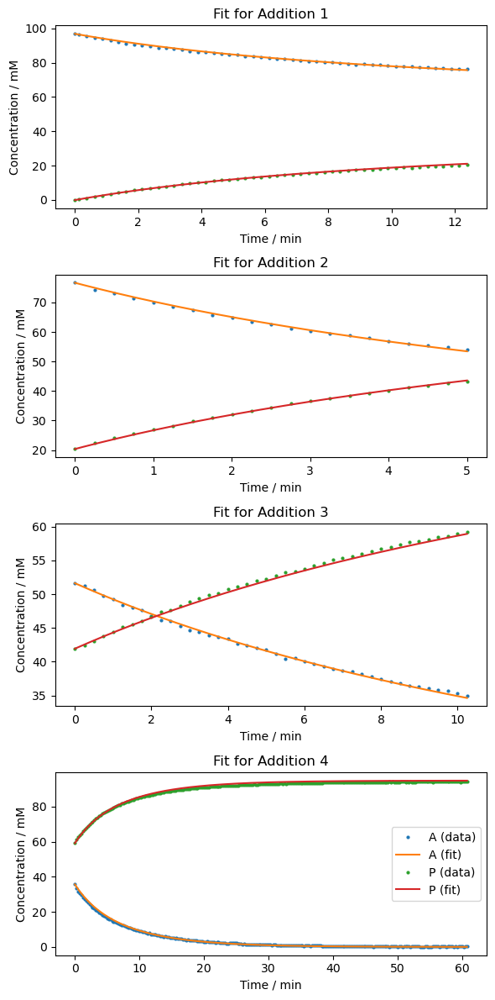

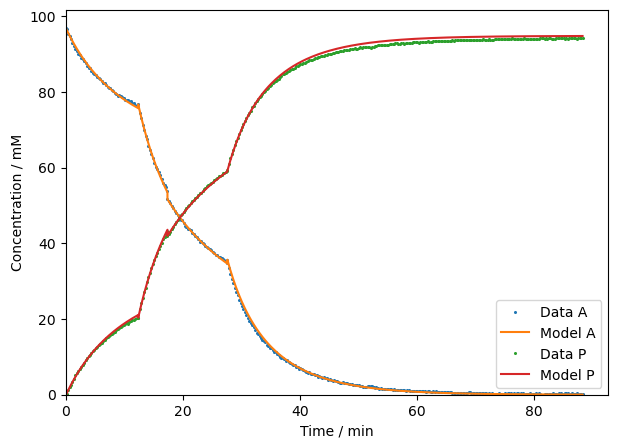

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E6,0.015454952,0.054367587,0.001665566,0.999859192,0.999522884,0.364997614,0.652844131,0.508920873


Dataset being analysed: C1_E7.xlsx
Number of datapoints per SAKE period: [99, 21, 63, 198]


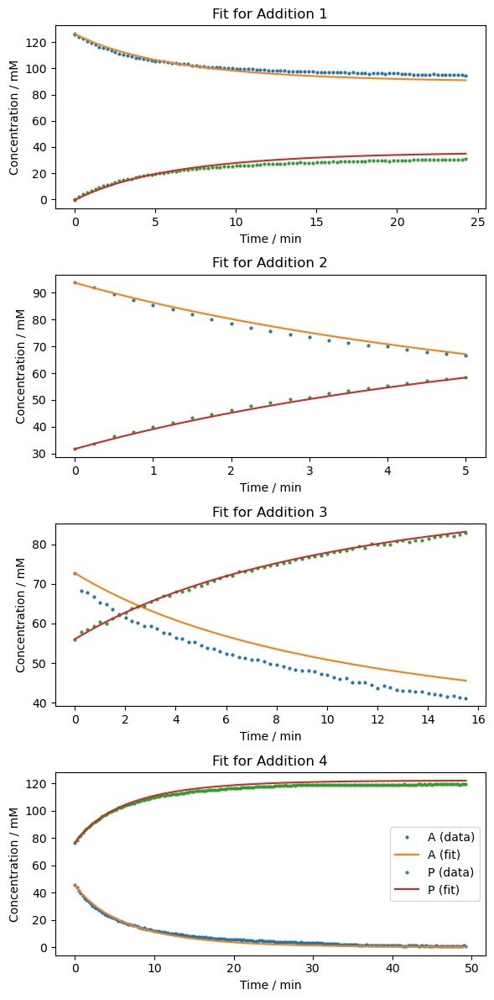

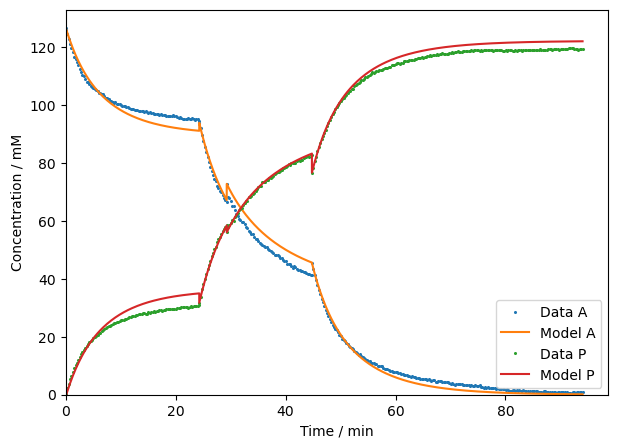

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.022571371,0.000000167,0.000001000,0.996564742,0.996967258,2.410968646,2.157624752,2.284296699


In [23]:
results_simplified_mechanism = []

for path in Experiment_paths_C1:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_selected_3parameter_model(path,convert_to_SI=True)
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_simplified_mechanism.append(best_params)

Dataset being analysed: C1_E7.xlsx
Number of datapoints per SAKE period: [99, 21, 63, 198]


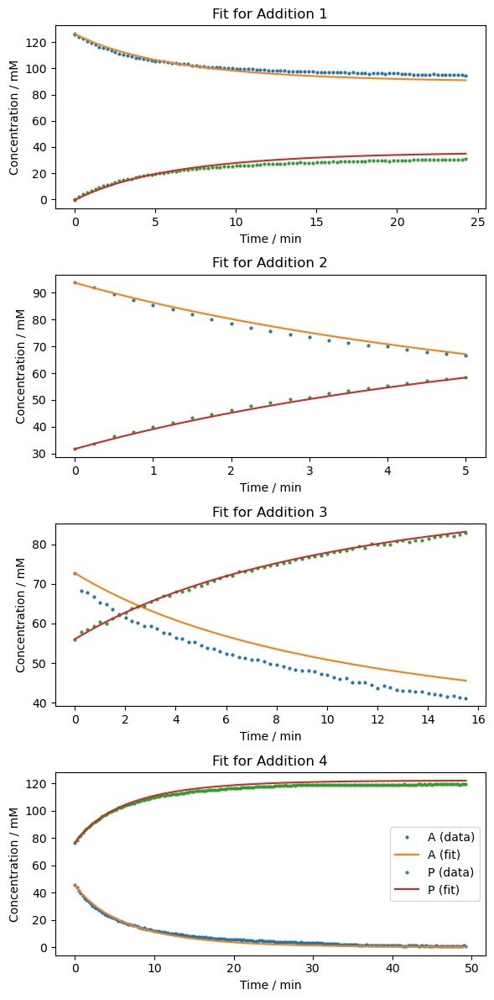

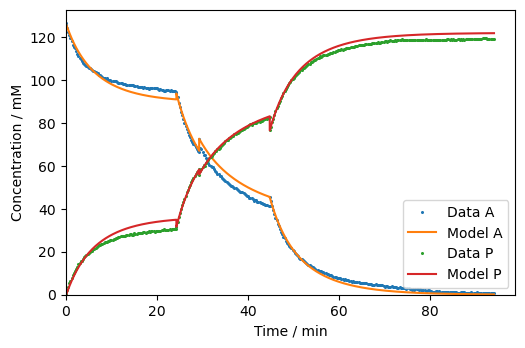

Best-fit parameters:


,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.022571371,0.000000167,0.000001000,0.996564742,0.996967258,2.410968646,2.157624752,2.284296699


In [24]:
results_simplified_mechanism = []

for path in Experiment_paths_C1[-1:]:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_selected_3parameter_model(path,convert_to_SI=True,figsize_final=(5.8,3.7))
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_simplified_mechanism.append(best_params)

In [25]:
results_simplified_mechanism_DF = pd.concat(results_simplified_mechanism, ignore_index=True)
results_simplified_mechanism_DF

,Dataset,Kk2,Kk3,KI,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.022571371,0.000000167,0.000001000,0.996564742,0.996967258,2.410968646,2.157624752,2.284296699


#### Simplified mechanism only Kk2

Dataset being analysed: C1_E1.xlsx


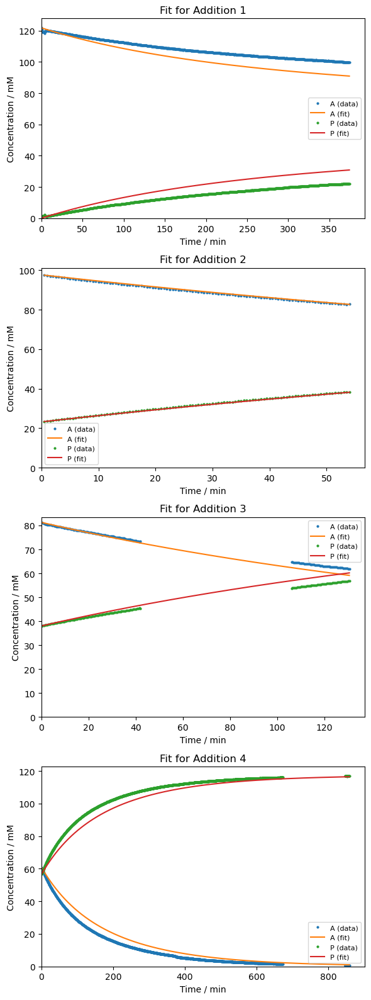

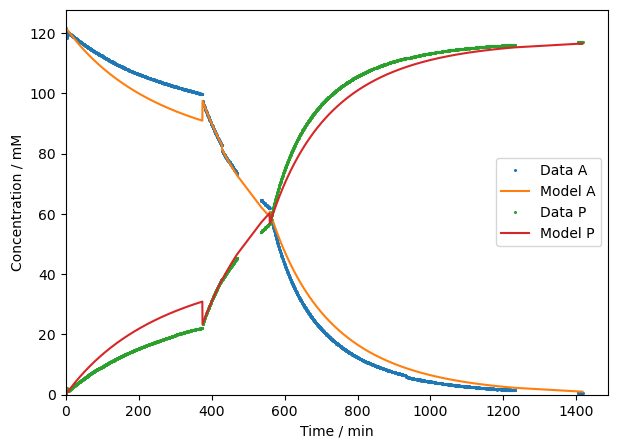

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.000515357,0.990975472,0.989410987,4.333664012,4.516550323,4.425107168


Dataset being analysed: C1_E2.xlsx


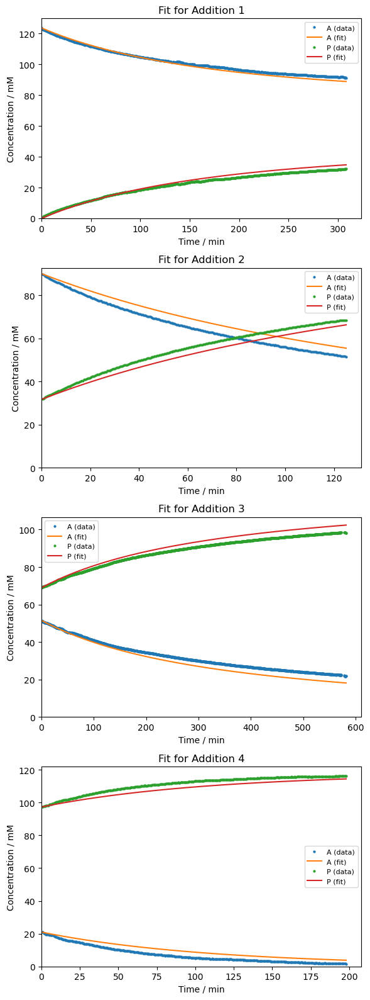

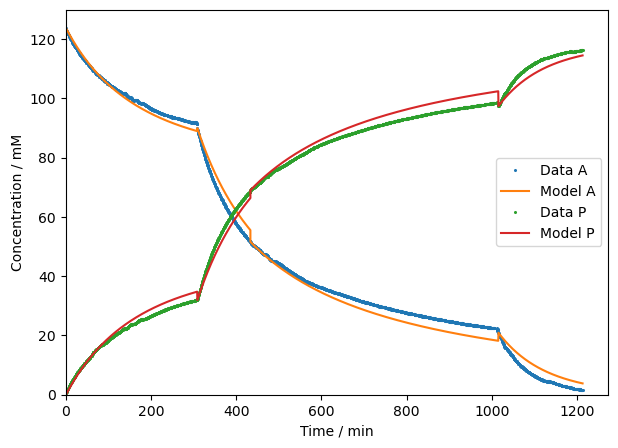

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E2,0.000847493,0.994207493,0.994465883,2.668228979,2.492861304,2.580545142


Dataset being analysed: C1_E3.xlsx


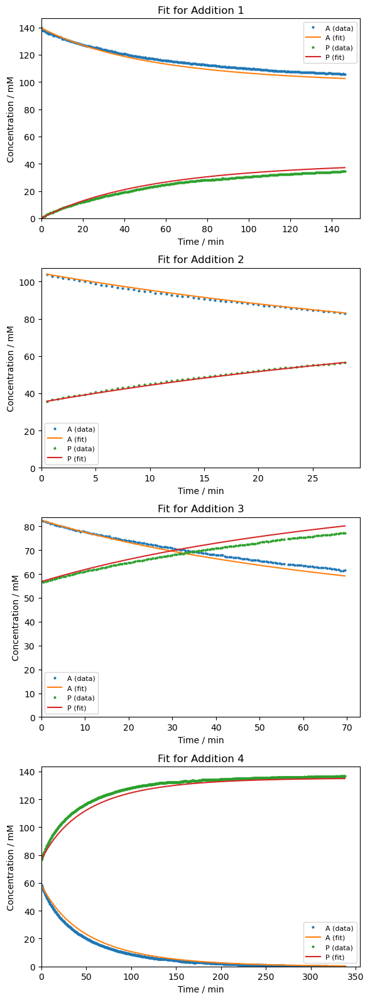

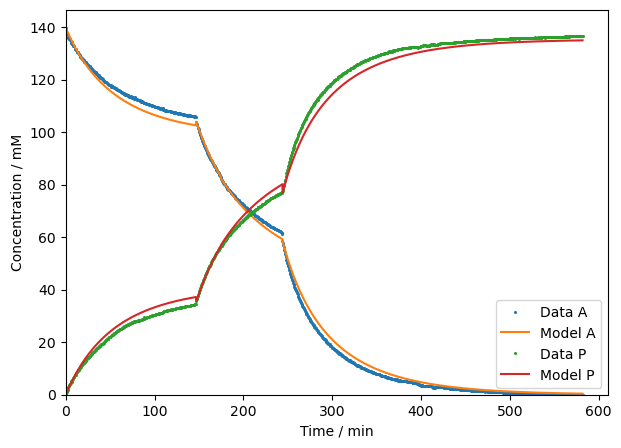

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E3,0.002316691,0.998425098,0.997056650,1.912453225,2.534542810,2.223498017


Dataset being analysed: C1_E4a.xlsx


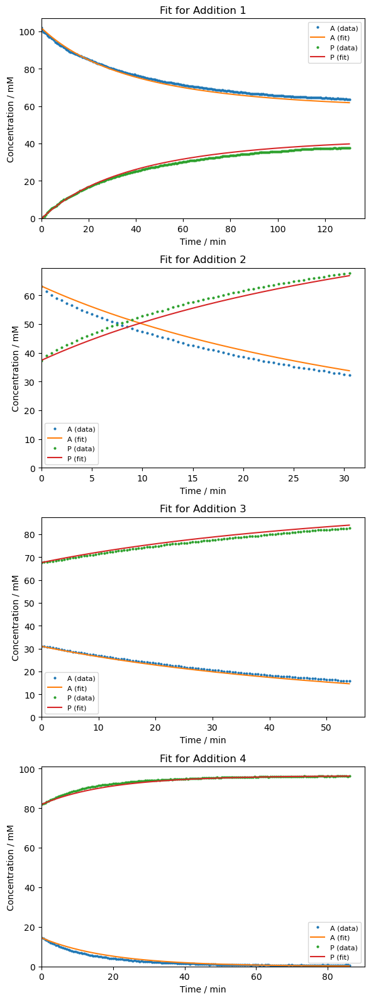

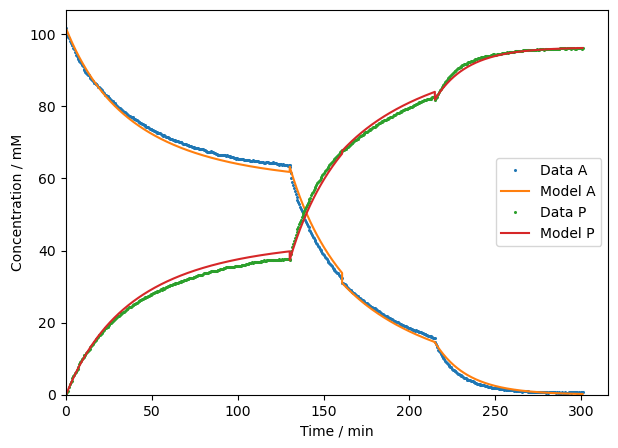

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4a,0.004552651,0.998443586,0.998264160,1.243966128,1.228637236,1.236301682


Dataset being analysed: C1_E4b.xlsx


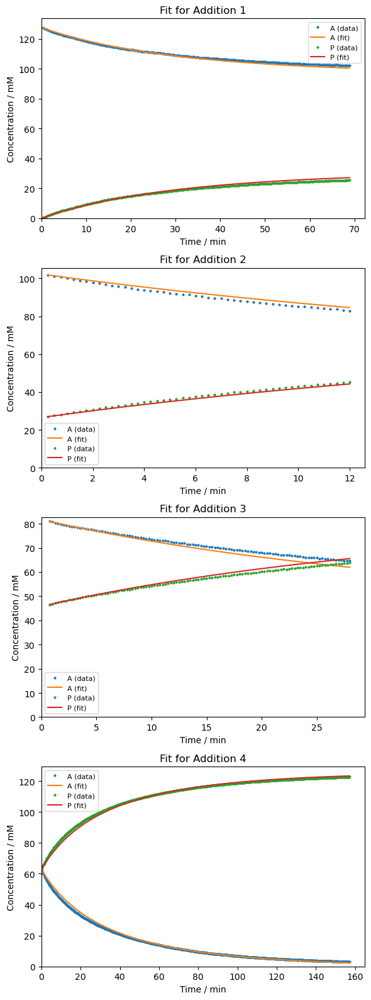

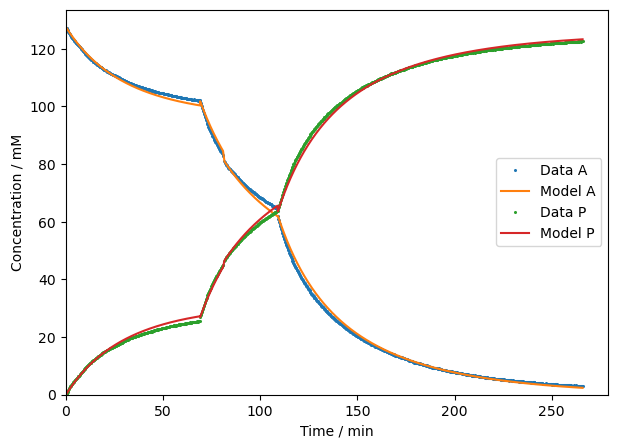

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4b,0.004480413,0.999387625,0.999414671,1.075060323,1.027006799,1.051033561


Dataset being analysed: C1_E5.xlsx


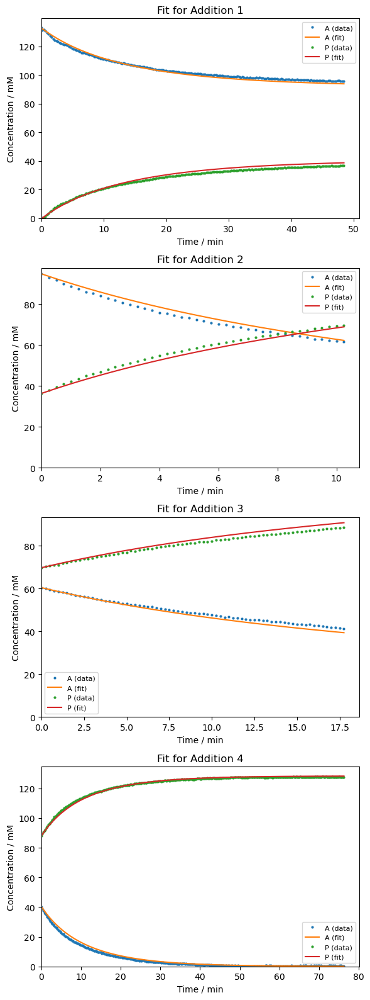

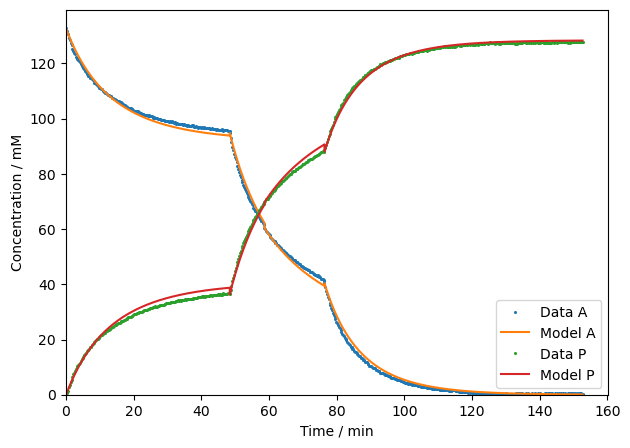

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E5,0.010114012,0.999266952,0.999199828,1.221158373,1.221272541,1.221215457


Dataset being analysed: C1_E6.xlsx


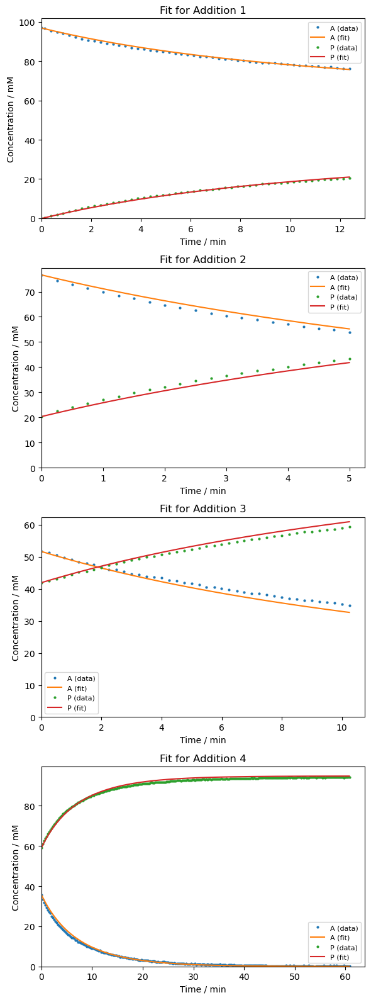

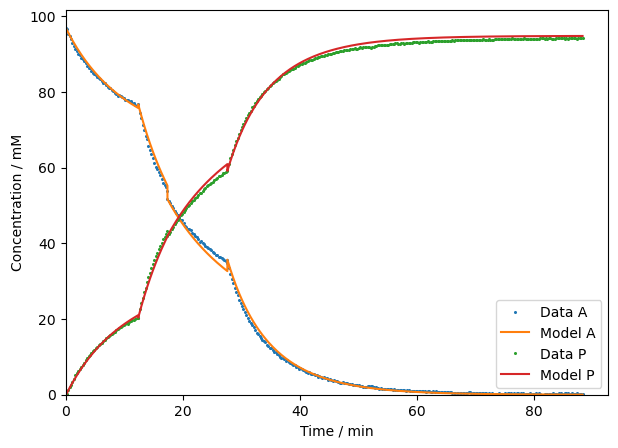

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E6,0.016117305,0.999364656,0.999221428,0.775318401,0.833962781,0.804640591


Dataset being analysed: C1_E7.xlsx


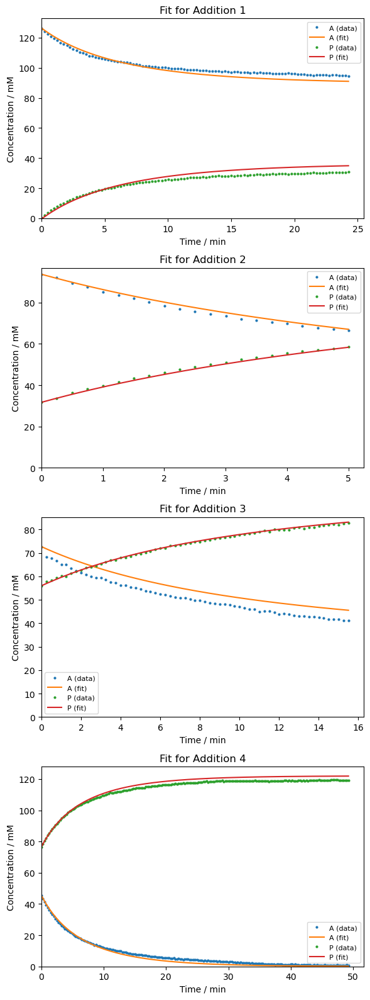

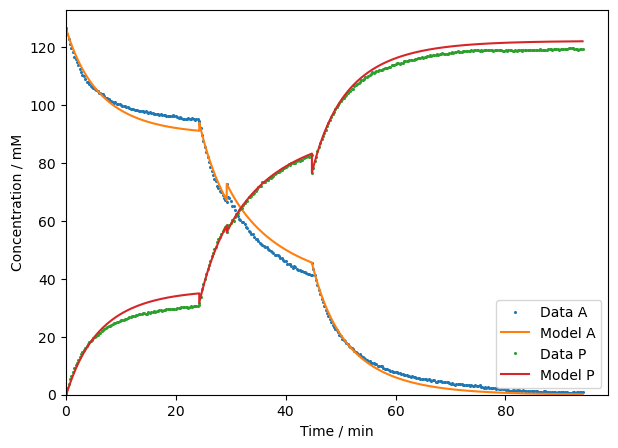

Best-fit parameters:


,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.022568646,0.996565158,0.996967139,2.410822648,2.157666890,2.284244769


In [26]:
results_simplified_mechanism_only_Kk2 = []

for path in Experiment_paths_C1:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_selected_3parameter_model_only_Kk2(path,convert_to_SI=True)
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_simplified_mechanism_only_Kk2.append(best_params)

In [27]:
results_simplified_mechanism_only_Kk2_DF = pd.concat(results_simplified_mechanism_only_Kk2, ignore_index=True)
results_simplified_mechanism_only_Kk2_DF

,Dataset,Kk2,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.000515357,0.990975472,0.989410987,4.333664012,4.516550323,4.425107168
1,C1_E2,0.000847493,0.994207493,0.994465883,2.668228979,2.492861304,2.580545142
2,C1_E3,0.002316691,0.998425098,0.997056650,1.912453225,2.534542810,2.223498017
3,C1_E4a,0.004552651,0.998443586,0.998264160,1.243966128,1.228637236,1.236301682
4,C1_E4b,0.004480413,0.999387625,0.999414671,1.075060323,1.027006799,1.051033561
5,C1_E5,0.010114012,0.999266952,0.999199828,1.221158373,1.221272541,1.221215457
6,C1_E6,0.016117305,0.999364656,0.999221428,0.775318401,0.833962781,0.804640591
7,C1_E7,0.022568646,0.996565158,0.996967139,2.410822648,2.157666890,2.284244769


#### Simplified mechanism only Kk3

Dataset being analysed: C1_E1.xlsx


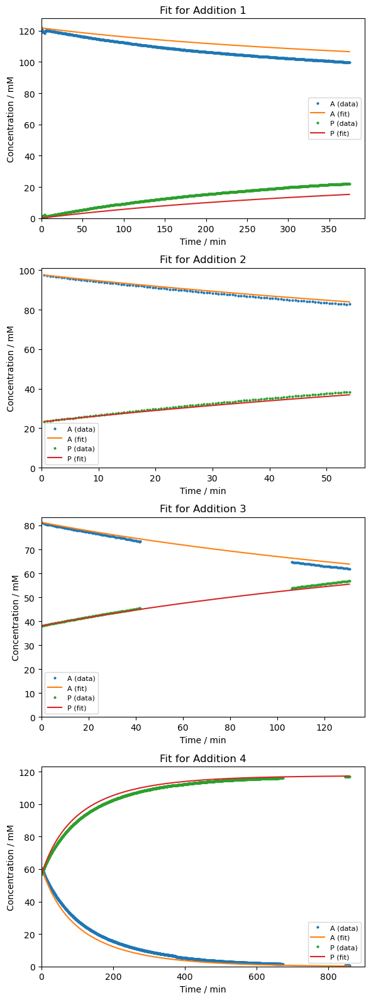

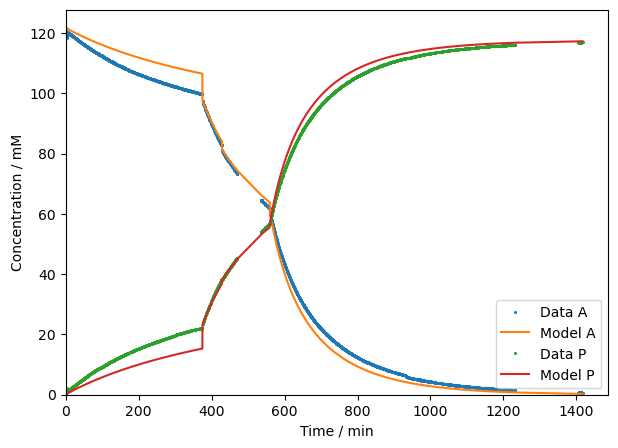

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.004646031,0.994364637,0.994487123,3.424553323,3.258879256,3.341716289


Dataset being analysed: C1_E2.xlsx


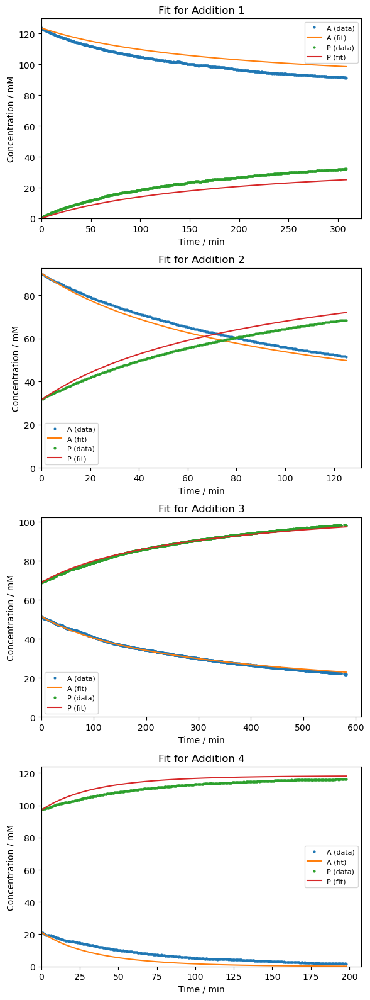

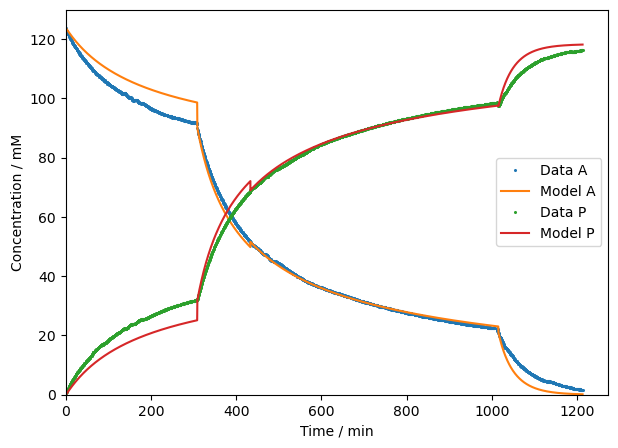

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E2,0.015540815,0.991627615,0.990947917,3.207852705,3.188219509,3.198036107


Dataset being analysed: C1_E3.xlsx


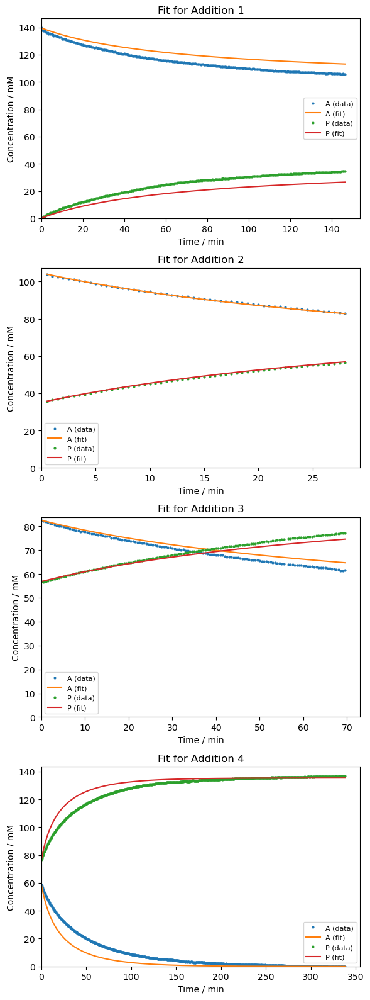

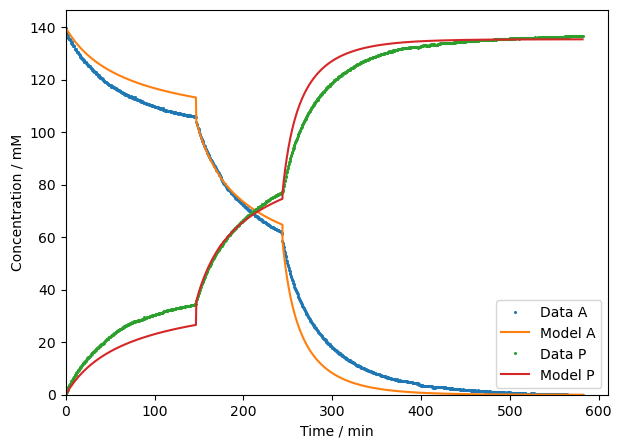

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E3,0.040972144,0.988457068,0.989830447,5.177524336,4.711178719,4.944351528


Dataset being analysed: C1_E4a.xlsx


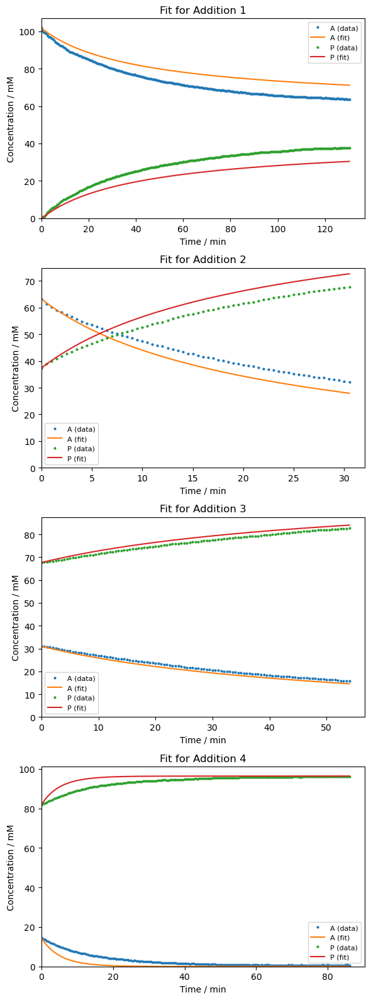

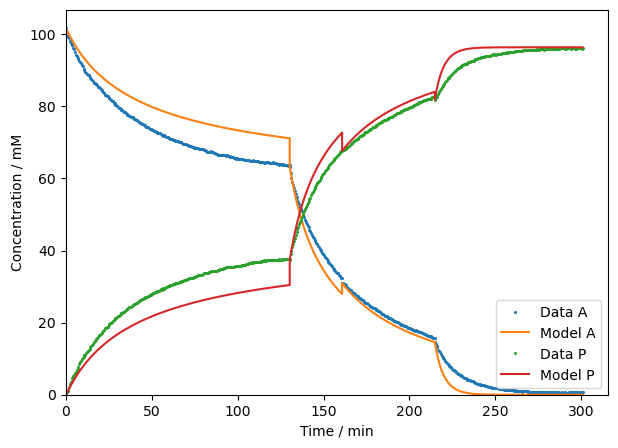

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4a,0.090121411,0.978822894,0.975846767,4.588590371,4.583069766,4.585830068


Dataset being analysed: C1_E4b.xlsx


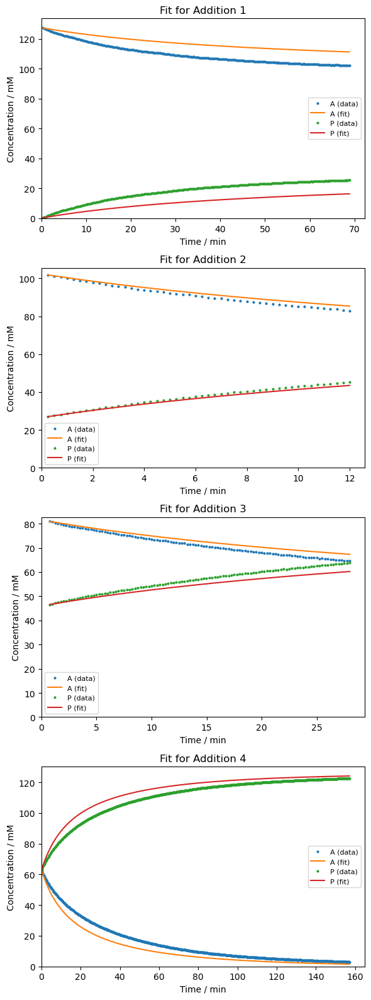

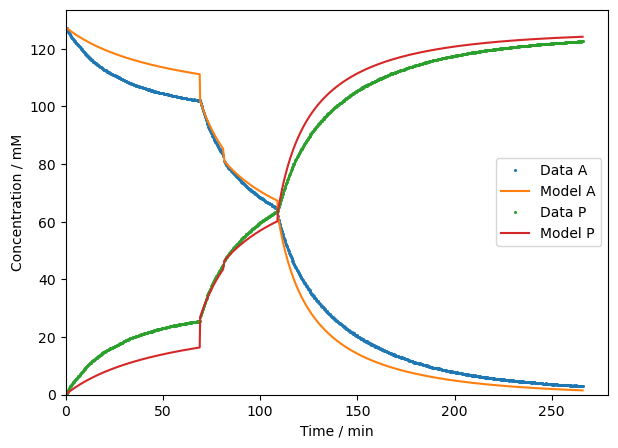

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E4b,0.071782679,0.985845177,0.984913158,5.168641963,5.214016780,5.191329371


Dataset being analysed: C1_E5.xlsx


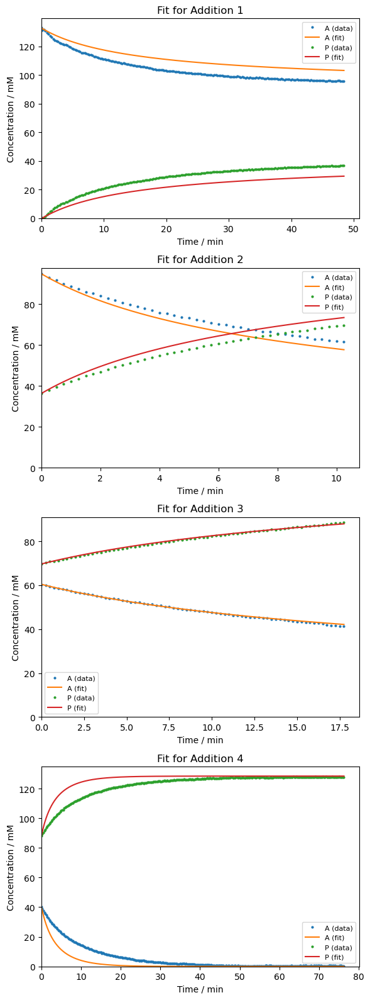

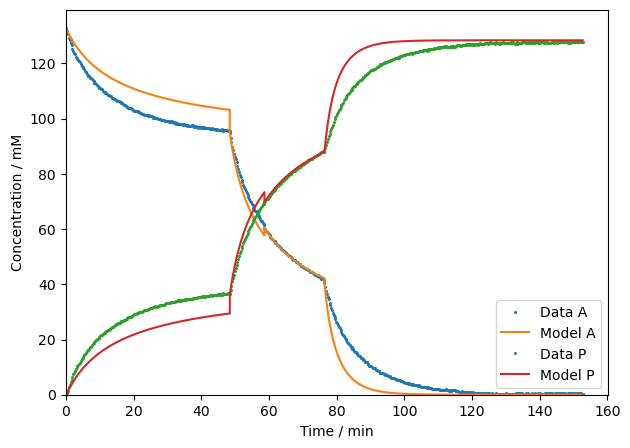

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E5,0.198853830,0.985833013,0.984185548,5.368396879,5.429350923,5.398873901


Dataset being analysed: C1_E6.xlsx


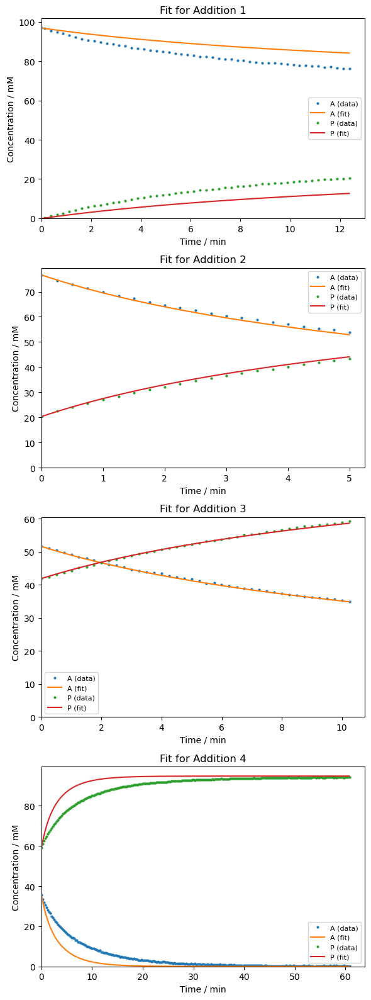

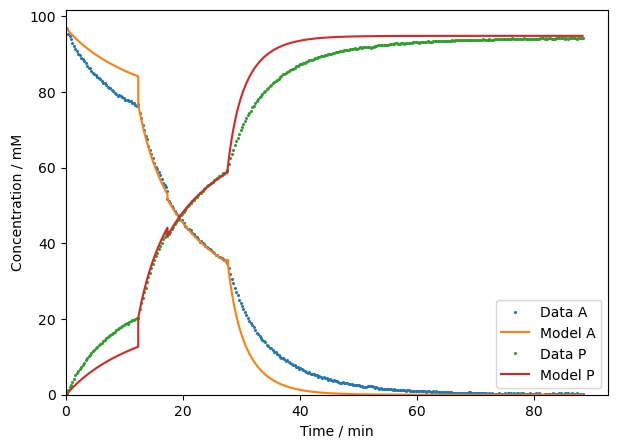

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E6,0.282573848,0.984849279,0.981065429,3.786101826,4.112681451,3.949391638


Dataset being analysed: C1_E7.xlsx


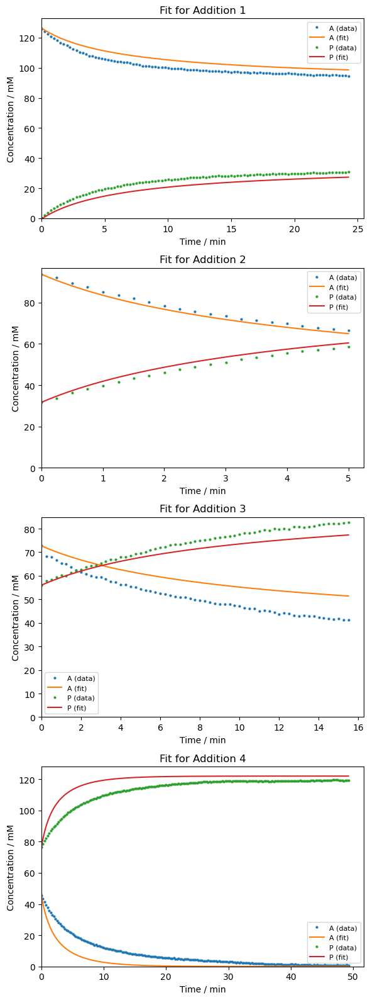

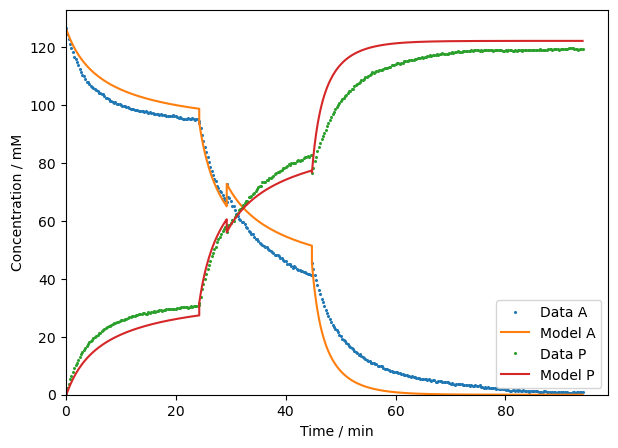

Best-fit parameters:


,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E7,0.545634222,0.979200739,0.980307897,5.932474110,5.497993341,5.715233725


In [28]:
results_simplified_mechanism_only_Kk3 = []

for path in Experiment_paths_C1:
    print('\033[1m' + 'Dataset being analysed:' + '\033[0m', os.path.basename(path))
    best_params = fit_and_analyse_selected_3parameter_model_only_Kk3(path,convert_to_SI=True)
    
    # Add a new column 'Dataset' as the first column
    dataset_name = Path(path).stem
    best_params.insert(0, 'Dataset', dataset_name)
    
    print("Best-fit parameters:")
    display(best_params)
    results_simplified_mechanism_only_Kk3.append(best_params)

In [29]:
results_simplified_mechanism_only_Kk3_DF = pd.concat(results_simplified_mechanism_only_Kk3, ignore_index=True)
results_simplified_mechanism_only_Kk3_DF

,Dataset,Kk3,R2_A,R2_P,RMSE_A,RMSE_P,RMSE_total
0,C1_E1,0.004646031,0.994364637,0.994487123,3.424553323,3.258879256,3.341716289
1,C1_E2,0.015540815,0.991627615,0.990947917,3.207852705,3.188219509,3.198036107
2,C1_E3,0.040972144,0.988457068,0.989830447,5.177524336,4.711178719,4.944351528
3,C1_E4a,0.090121411,0.978822894,0.975846767,4.588590371,4.583069766,4.585830068
4,C1_E4b,0.071782679,0.985845177,0.984913158,5.168641963,5.214016780,5.191329371
5,C1_E5,0.198853830,0.985833013,0.984185548,5.368396879,5.429350923,5.398873901
6,C1_E6,0.282573848,0.984849279,0.981065429,3.786101826,4.112681451,3.949391638
7,C1_E7,0.545634222,0.979200739,0.980307897,5.932474110,5.497993341,5.715233725
